# **The Air We Breathe**
### **A Local Data Science Project**

## **PART 2: Modelling**

## **Modeling Phase Overview**

This notebook continues the analysis by developing predictive models based on the dataset prepared during the exploratory and feature engineering phases.

The input data includes:

- validated pollutant concentration measurements  
- engineered temporal features and lagged variables  
- meteorological descriptors and derived categorical features  
- the **Day Type** clustering feature, representing recurring atmospheric regimes  

These features provide both short-term temporal context and structural environmental information, allowing the models to capture complex relationships between atmospheric conditions and pollutant levels.

The modeling phase focuses on:

- establishing baseline performance benchmarks  
- training quantile regression models using CatBoost  
- evaluating predictive performance across different concentration ranges  
- analyzing model behavior and feature influence using SHAP explainability methods  

This structured approach ensures both predictive accuracy and interpretability, enabling a deeper understanding of the environmental drivers of air quality.

In [1]:
#!pip install catboost

In [2]:
import sys
sys.path.append('..')

from utils import *
from catboost import CatBoostRegressor
from sklearn.metrics import confusion_matrix, classification_report
import pickle

In [3]:
# Loading the prepared data from Notebook 1
data_full = pd.read_pickle('../data/processed/data_full.pkl')

# data_orig is the dataset before the data cleanup step, needed by the baseline() function
data_orig = pd.read_pickle('../data/processed/data_orig.pkl')

# Target variables and their class labels
pm_vals = pd.read_pickle('../data/processed/pm_vals.pkl')
o3_vals = pd.read_pickle('../data/processed/o3_vals.pkl')
pm_classes = pd.read_pickle('../data/processed/pm_classes.pkl')
o3_classes = pd.read_pickle('../data/processed/o3_classes.pkl')

# The fitted KMeans model and the day type series derived from it
with open('../data/processed/kmeans_model.pkl', 'rb') as f:
    kmeans_model = pickle.load(f)

day_types = pd.read_pickle('../data/processed/day_types.pkl')

print('All files loaded successfully.')
print('data_full shape:', data_full.shape)

All files loaded successfully.
data_full shape: (674, 39)


In [4]:
data = data_full.copy()

# Models

In [5]:
# 70% of the data are going to be used for the training set and 30% for the test set
print('Keeping',int(data.shape[0]*0.7),'elements for training set and',(data.shape[0]-int(data.shape[0]*0.7)),'for test set.')

Keeping 471 elements for training set and 203 for test set.


## Baseline model functions

It is important to be able to compare the scores obtained with complex models to something simpler, because if the more complex models performs only a little better than a very simple one (or equally or even worse) even with a low pinball loss (or any other metric) it is not a good idea to use it.

So in this case a given quantile is computed grouping the target training values by month, and the results are used to predict the test data. If it is not possible to outperform those results with a machine learning model it is better to just use them as an estimation.

## PM 2.5 Model

### Column Selection

In [6]:
# Selecting the most important column for PM 2.5 evaluation: keeping all columns would be less effective
data_pm = data_full.copy()[['PREV_pm2.5', 'WIND direction gust', 'AIR TEMP T min', 'Rain Classes', 'PREV_RMEAN_pm10', 'PREV_WIND speed gust',
                            'PREV_so2', 'AIR TEMP time max', 'AIR TEMP time min', 'DAYLIGHT HOURS', 'HUMIDITY avg', 'PREV_pm10', 'RMEAN_HUMIDITY avg',
                            'AIR TEMP T avg', 'HUMIDITY max']]

In [7]:
# Splitting in training and test set
for o in data_pm.select_dtypes(include = 'object').columns.tolist():
    data_pm[o] = data_pm[o].astype('category')

cat_cols_pm = data_pm.select_dtypes(include='category').columns.tolist()

x_train_pm = data_pm.head(int(data.shape[0]*0.7))

x_test_pm = data_pm.tail(data.shape[0]-int(data.shape[0]*0.7))

y_train_pm = pm_vals.head(int(data.shape[0]*0.7))

y_test_pm = pm_vals.tail(data.shape[0]-int(data.shape[0]*0.7))

### Baseline Results - median

In [8]:
baseline_50 = baseline(data_orig, 'pm2.5', x_train_pm, x_test_pm, 0.5)

print(f"Pinball Loss training: {baseline_50[0]}")
print(f"Pinball Loss test: {baseline_50[1]}")
print(f"Pinball Loss TOT: {baseline_50[2]}")

Pinball Loss training: 4.032908704883227
Pinball Loss test: 3.6120689655172415
Pinball Loss TOT: 3.8773314203730274


In [9]:
baseline_mae = tuple(2 * b for b in baseline_50)

print(f"Pinball Loss training: {baseline_mae[0]}")
print(f"Pinball Loss test: {baseline_mae[1]}")
print(f"Pinball Loss TOT: {baseline_mae[2]}")

Pinball Loss training: 8.065817409766455
Pinball Loss test: 7.224137931034483
Pinball Loss TOT: 7.754662840746055


### Baseline Model - 25th percentile

In [10]:
baseline_25 = baseline(data_orig, 'pm2.5', x_train_pm, x_test_pm, 0.25)

print(f"Pinball Loss training: {baseline_25[0]}")
print(f"Pinball Loss test: {baseline_25[1]}")
print(f"Pinball Loss TOT: {baseline_25[2]}")

Pinball Loss training: 2.656316348195329
Pinball Loss test: 2.4439655172413794
Pinball Loss TOT: 2.5785509325681493


### Baseline Model - 75th percentile

In [11]:
baseline_75 = baseline(data_orig, 'pm2.5', x_train_pm, x_test_pm, 0.75)

print(f"Pinball Loss training: {baseline_75[0]}")
print(f"Pinball Loss test: {baseline_75[1]}")
print(f"Pinball Loss TOT: {baseline_75[2]}")

Pinball Loss training: 3.7489384288747347
Pinball Loss test: 3.5049261083743843
Pinball Loss TOT: 3.6315459110473456


## Median Model

### Base

In [12]:
quantile = 0.5
base_model = CatBoostRegressor(loss_function=f'Quantile:alpha={quantile}',
                              cat_features=cat_cols_pm,
                              eval_metric=f'Quantile:alpha={quantile}',
                              random_state = 0, verbose=0).fit(x_train_pm, y_train_pm,
                                                               eval_set=[(x_train_pm, y_train_pm)], verbose = 0)

In [13]:
print('Performances of the CatBoost model (train set)')

display(train_test_performances(base_model, x_train_pm, y_train_pm, x_test_pm, y_test_pm, 'cat_50'))

print('Performances of the CatBoost model (full set)')
display(model_performance_regression_rounded(base_model, 'cat_50', data_pm, pm_vals))

Performances of the CatBoost model (train set)


,MAE
cat_50 train,3.424592
cat_50 test,4.662698


Performances of the CatBoost model (full set)


,MAE
cat_50,3.8


In [14]:
print('Evaluation of the base model')
base_train_50 = mean_pinball_loss(y_train_pm,base_model.predict(x_train_pm), alpha = 0.5)
base_test_50 = mean_pinball_loss(y_test_pm,base_model.predict(x_test_pm), alpha = 0.5)
base_tot_50 = mean_pinball_loss(pm_vals,base_model.predict(data_pm), alpha = 0.5)

print('Training set:',base_train_50)
print('Improvement on training set',round(((baseline_50[0]-base_train_50)/baseline_50[0])*100,2),'%')
print('Test set:',base_test_50)
print('Improvement on test set',round(((baseline_50[1]-base_test_50)/baseline_50[1])*100,2),'%')
print('Full set:',base_tot_50)
print('Improvement on training set',round(((baseline_50[2]-base_tot_50)/baseline_50[2])*100,2),'%')

Evaluation of the base model
Training set: 1.712295804508661
Improvement on training set 57.54 %
Test set: 2.3313488117113974
Improvement on test set 35.46 %
Full set: 1.8987464876869333
Improvement on training set 51.03 %


### Fine-Tuned

In [15]:
quantile = 0.5
model_50_pm = CatBoostRegressor(loss_function=f'Quantile:alpha={quantile}',
                              cat_features=cat_cols_pm,
                              eval_metric=f'Quantile:alpha={quantile}',
                             bootstrap_type = 'MVS',
                             n_estimators = 890,
                             subsample = 0.9,
                              random_state = 0, verbose=0).fit(x_train_pm, y_train_pm,
                                                               eval_set=[(x_train_pm, y_train_pm)], verbose = 0)

print('Performances of the CatBoost model (train/test set)')

display(train_test_performances(model_50_pm, x_train_pm, y_train_pm, x_test_pm, y_test_pm, 'cat_50'))

print('Performances of the CatBoost model (FULL set)')
display(model_performance_regression_rounded(model_50_pm, 'cat_50', data_pm, pm_vals))


print('Evaluation of the tuned model')
tuned_train_50 = mean_pinball_loss(y_train_pm,model_50_pm.predict(x_train_pm), alpha = 0.5)
tuned_test_50 = mean_pinball_loss(y_test_pm,model_50_pm.predict(x_test_pm), alpha = 0.5)
tuned_tot_50 = mean_pinball_loss(pm_vals,model_50_pm.predict(data_pm), alpha = 0.5)

print('Training set:',tuned_train_50)
print('Improvement on training set',round(((baseline_50[0]-tuned_train_50)/baseline_50[0])*100,2),'%')
print('Test set:',tuned_test_50)
print('Improvement on test set',round(((baseline_50[1]-tuned_test_50)/baseline_50[1])*100,2),'%')
print('Full set:',tuned_tot_50)
print('Improvement on full set',round(((baseline_50[2]-tuned_tot_50)/baseline_50[2])*100,2),'%')

Performances of the CatBoost model (train/test set)


,MAE
cat_50 train,3.454557
cat_50 test,4.786095


Performances of the CatBoost model (FULL set)


,MAE
cat_50,3.86


Evaluation of the tuned model
Training set: 1.727278540921867
Improvement on training set 57.17 %
Test set: 2.3930473353741863
Improvement on test set 33.75 %
Full set: 1.9277994092806516
Improvement on full set 50.28 %


In [16]:
explainer_pm = sh.TreeExplainer(model_50_pm)
shap_values_pm = explainer_pm(data_pm)

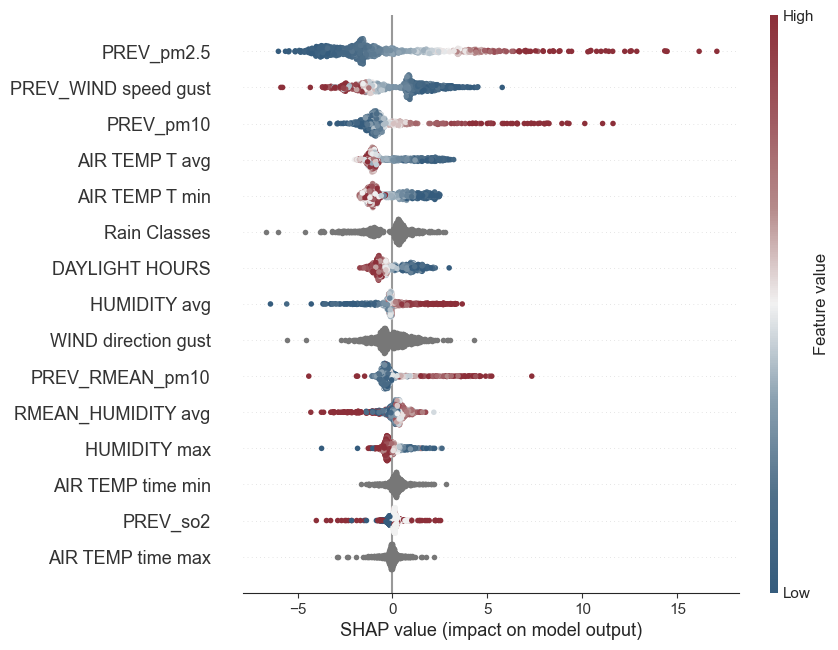

In [17]:
sh.plots.beeswarm(shap_values_pm, max_display=data_pm.shape[1], color = hcmap)

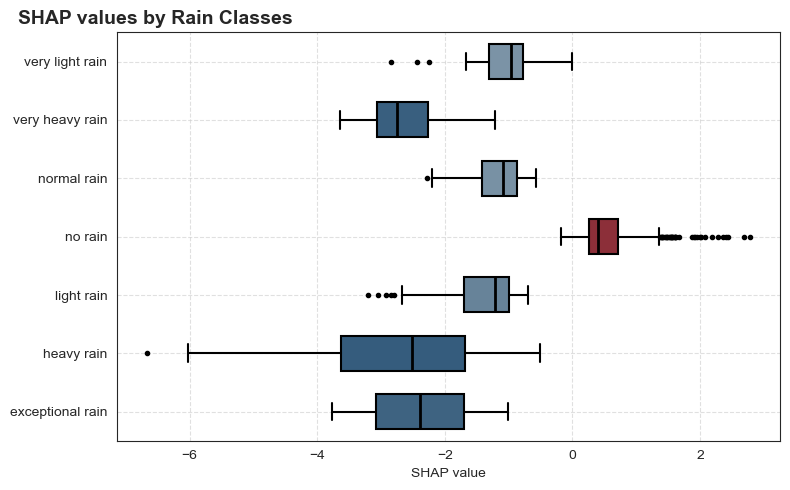

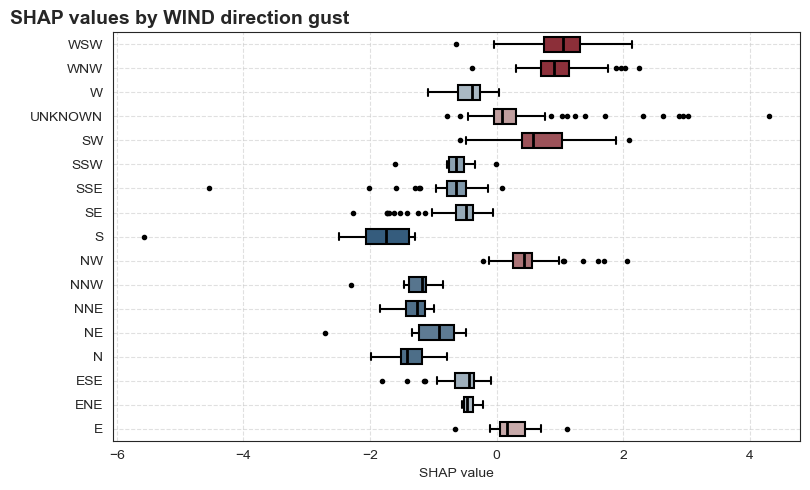

In [18]:
plot_shap_boxplot_colored(data_pm, shap_values_pm, 'Rain Classes', cmap = hcmap)

plot_shap_boxplot_colored(data_pm, shap_values_pm, 'WIND direction gust', cmap = hcmap)

In [19]:
interaction_values_pm = explainer_pm.shap_interaction_values(data_pm)

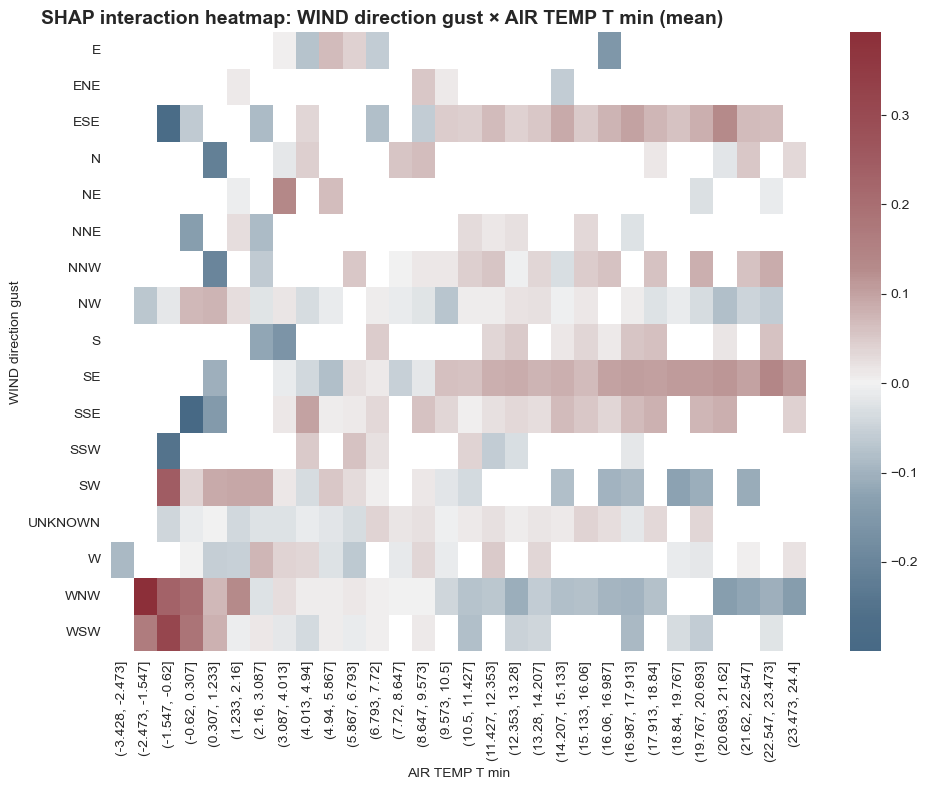

In [20]:
plot_shap_interaction_heatmap(interaction_values_pm, data_pm, 'WIND direction gust', 'AIR TEMP T min')

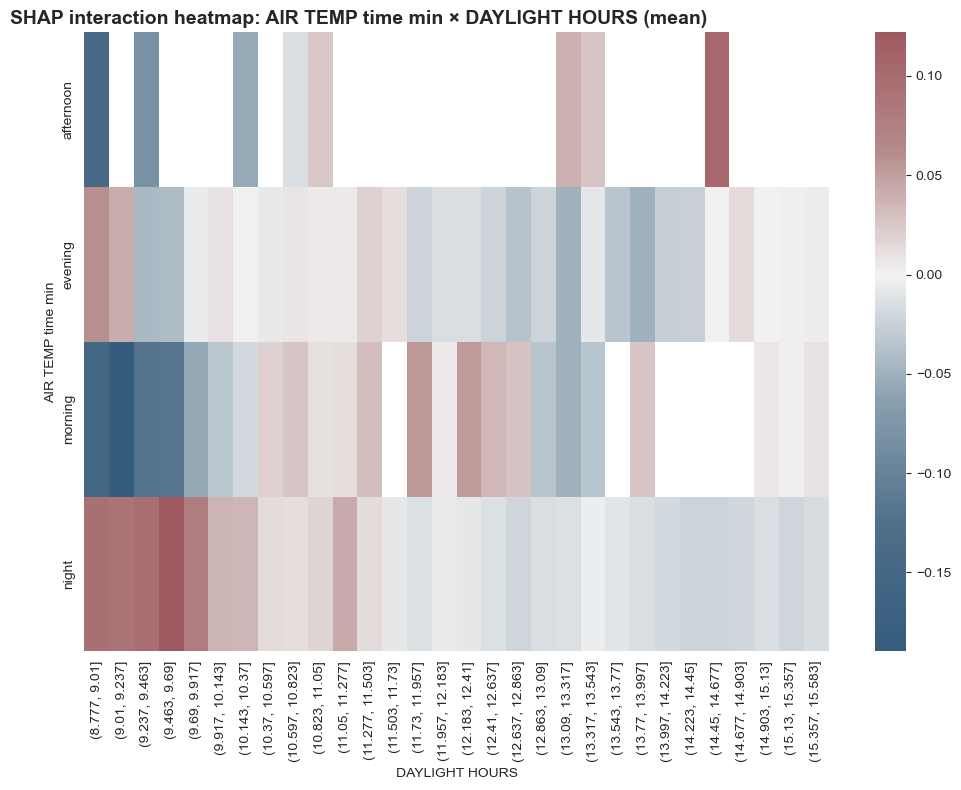

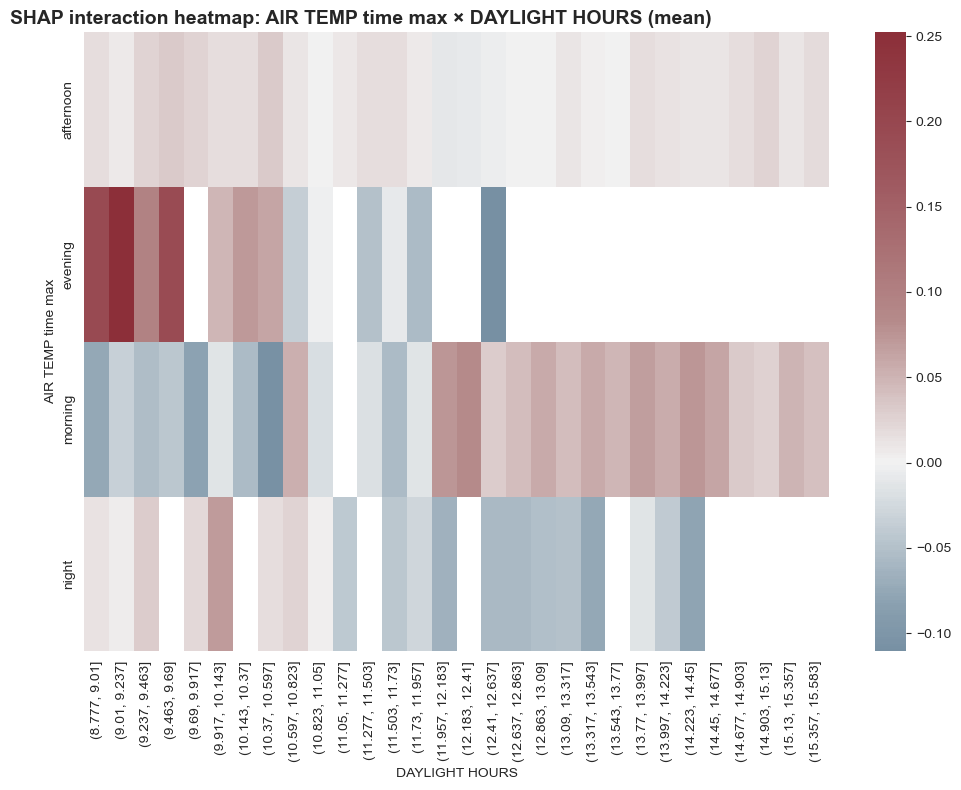

In [21]:
plot_shap_interaction_heatmap(interaction_values_pm, data_pm, 'AIR TEMP time min', 'DAYLIGHT HOURS')

plot_shap_interaction_heatmap(interaction_values_pm, data_pm, 'AIR TEMP time max', 'DAYLIGHT HOURS')

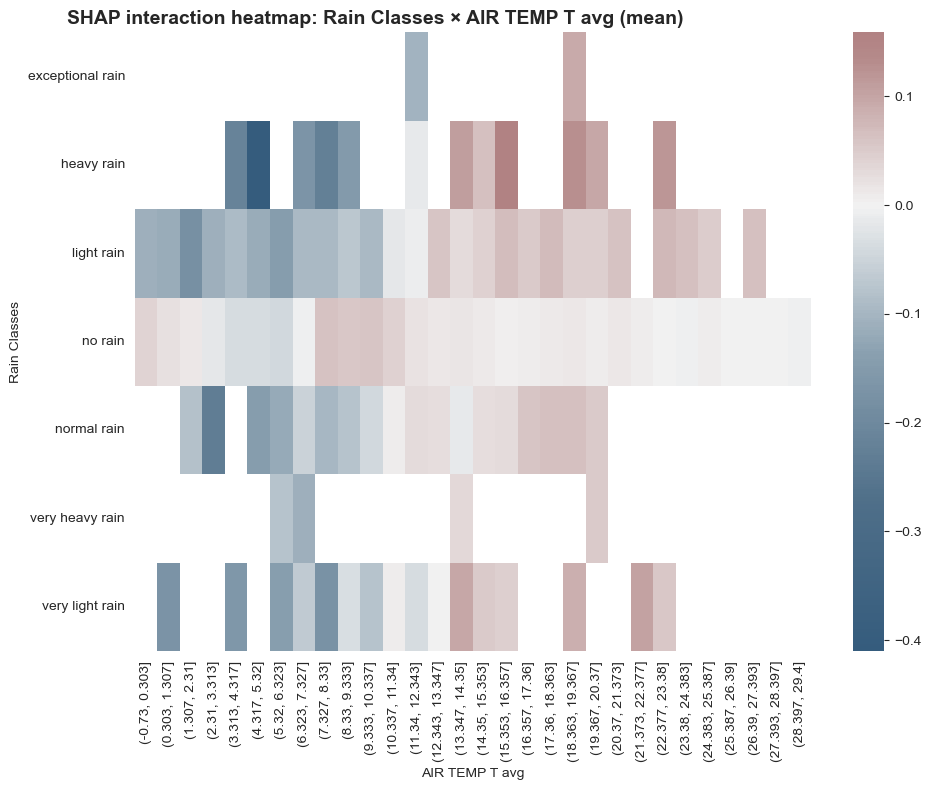

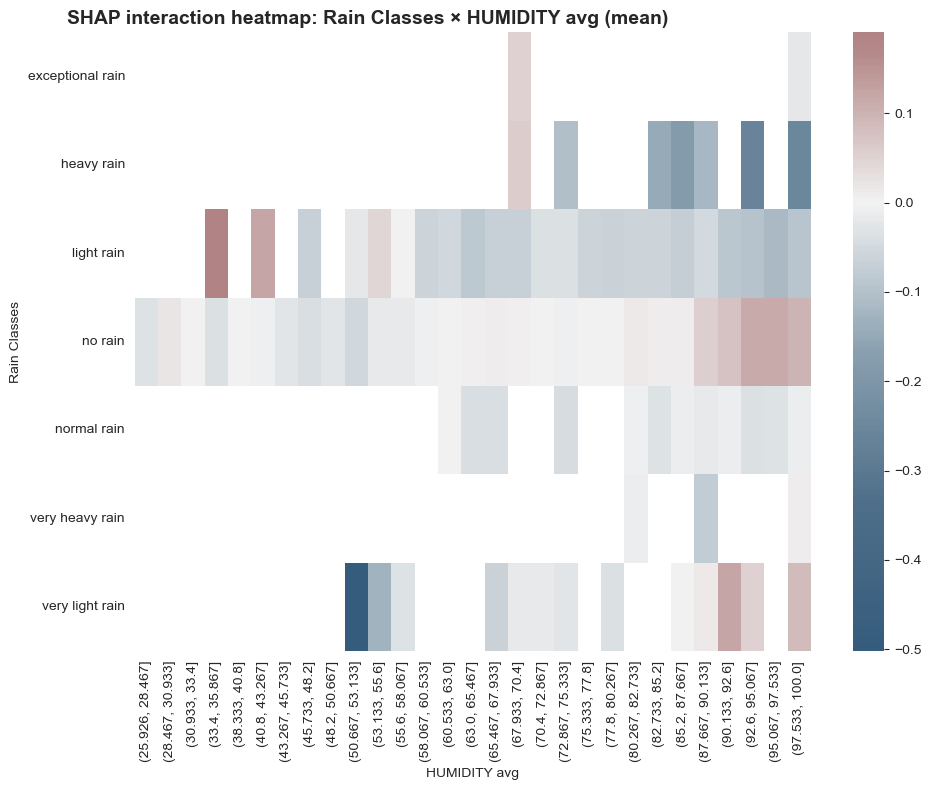

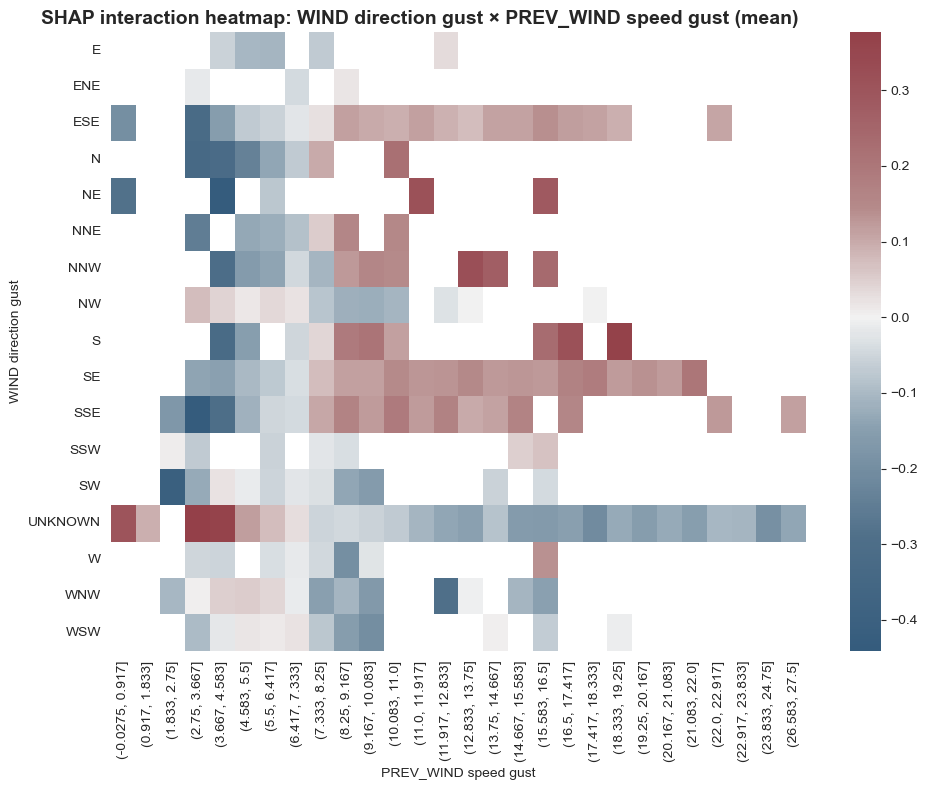

In [22]:
plot_shap_interaction_heatmap(interaction_values_pm, data_pm, 'Rain Classes', 'AIR TEMP T avg')

plot_shap_interaction_heatmap(interaction_values_pm, data_pm, 'Rain Classes', 'HUMIDITY avg')

plot_shap_interaction_heatmap(interaction_values_pm, data_pm, 'WIND direction gust', 'PREV_WIND speed gust')

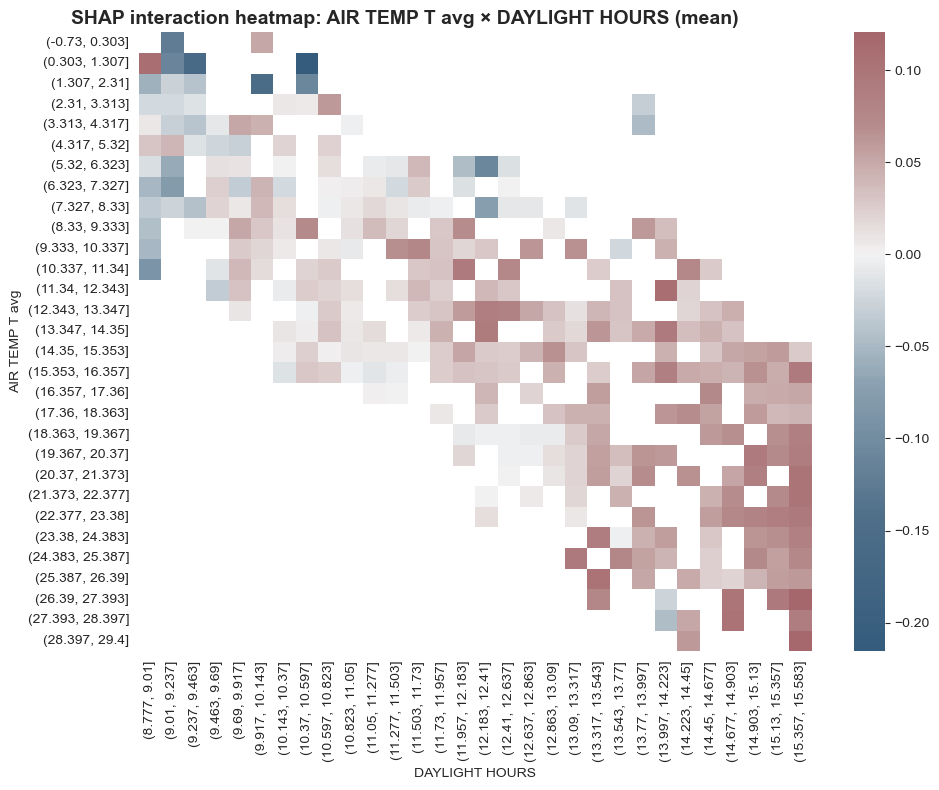

In [23]:
plot_shap_interaction_heatmap(interaction_values_pm, data_pm, 'AIR TEMP T avg', 'DAYLIGHT HOURS')

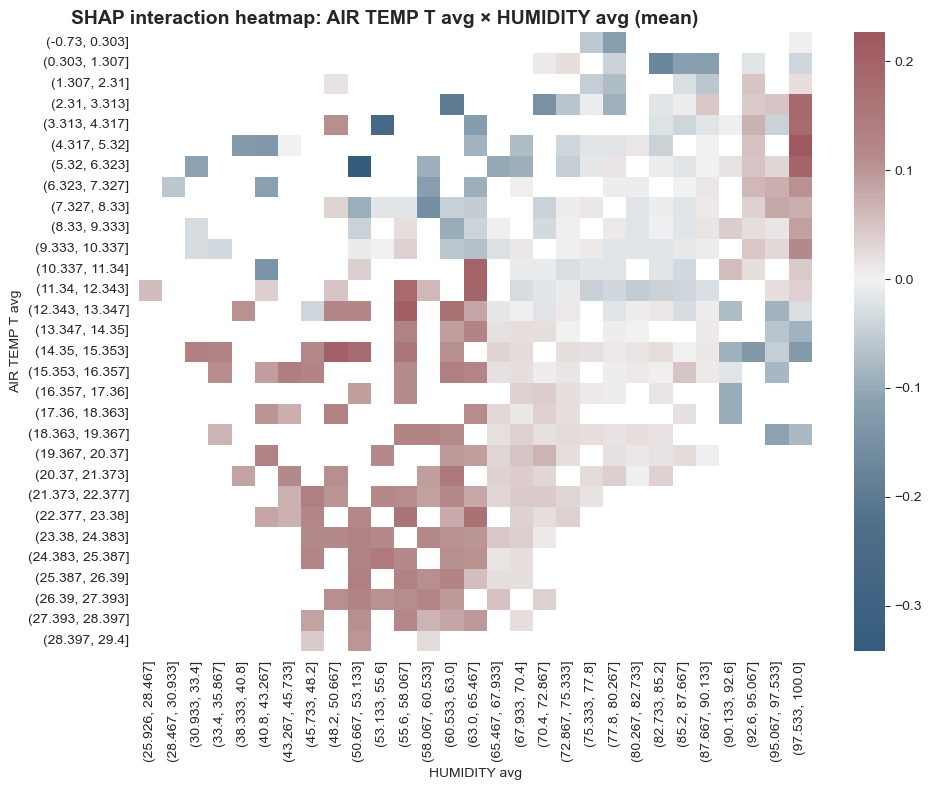

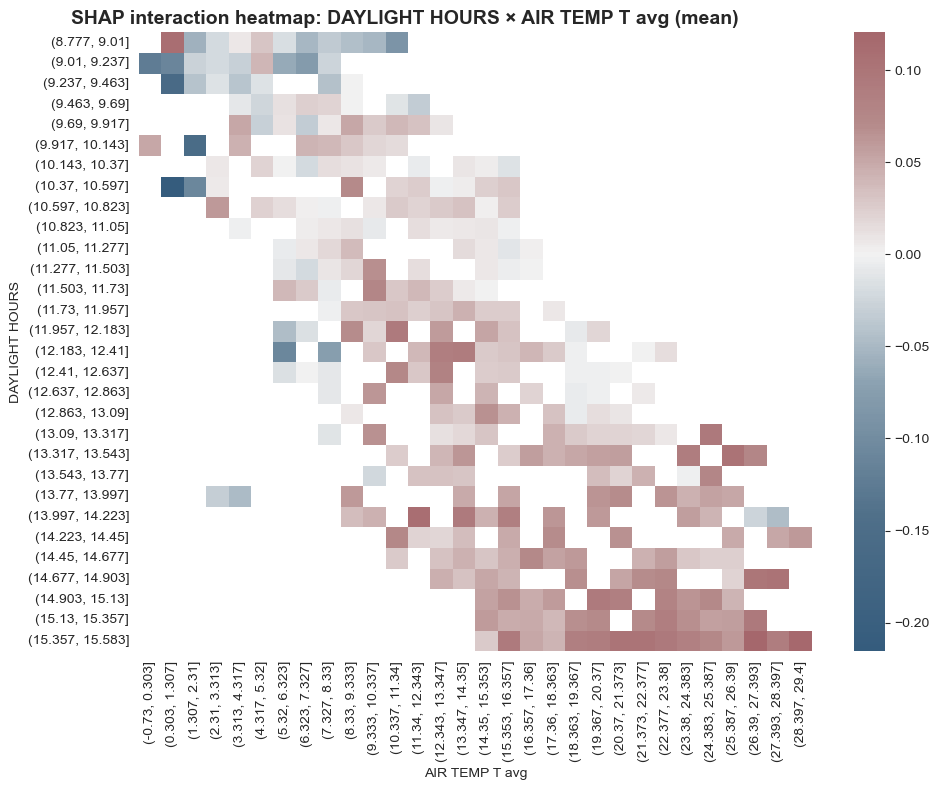

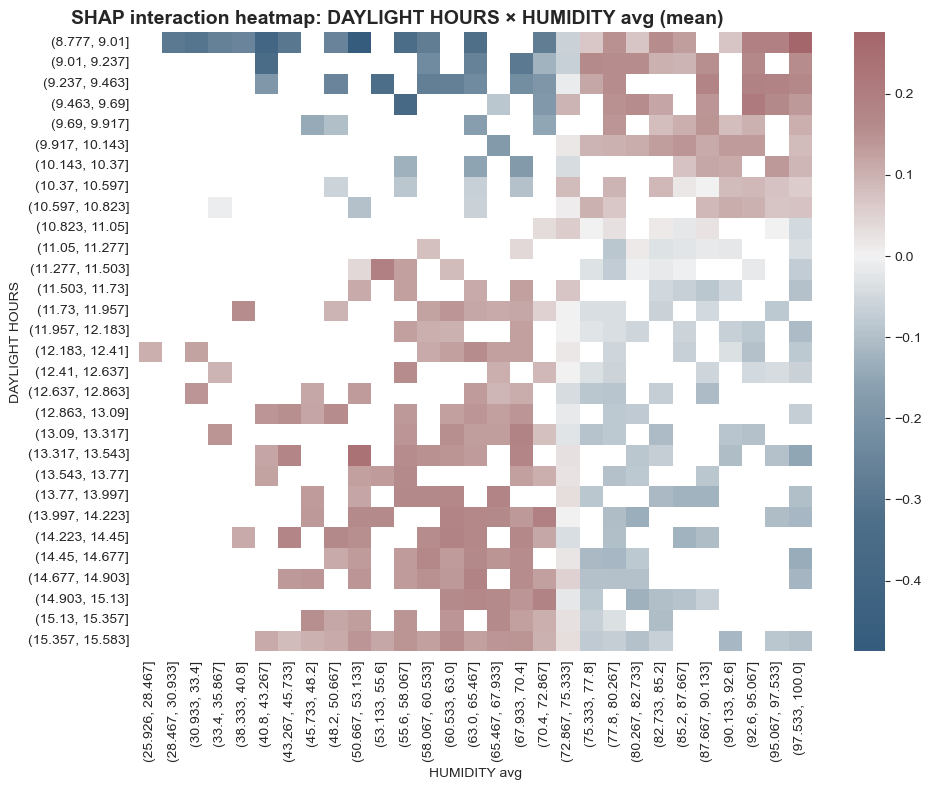

In [24]:
plot_shap_interaction_heatmap(interaction_values_pm, data_pm, 'AIR TEMP T avg', 'HUMIDITY avg')
plot_shap_interaction_heatmap(interaction_values_pm, data_pm, 'DAYLIGHT HOURS', 'AIR TEMP T avg')
plot_shap_interaction_heatmap(interaction_values_pm, data_pm, 'DAYLIGHT HOURS', 'HUMIDITY avg')

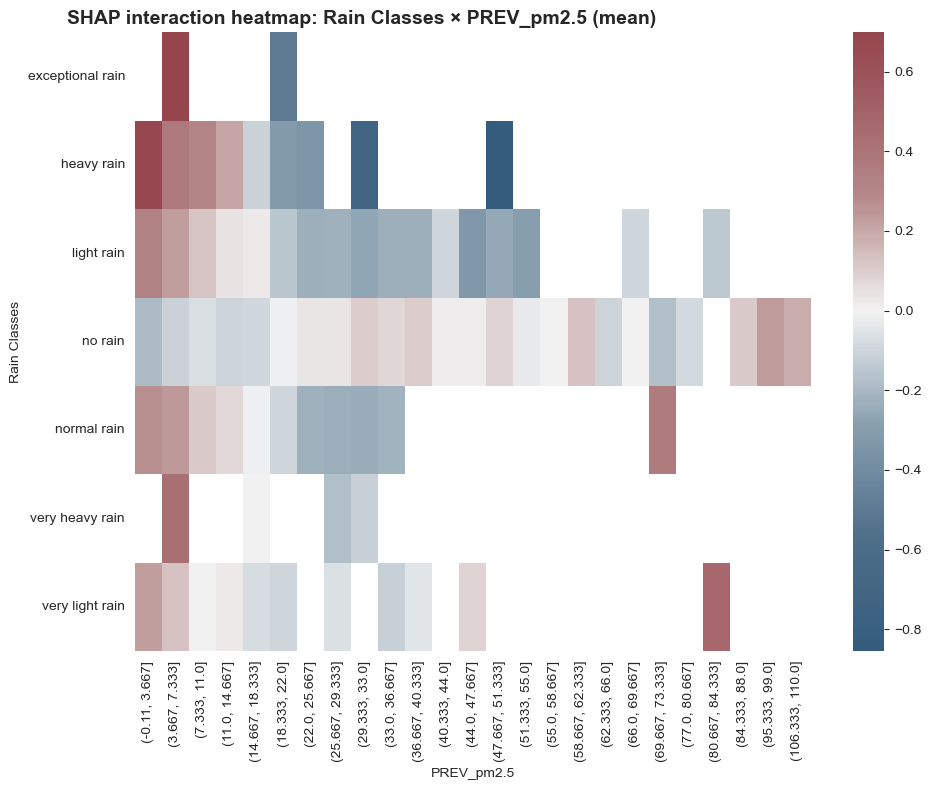

In [25]:
plot_shap_interaction_heatmap(interaction_values_pm, data_pm, 'Rain Classes', 'PREV_pm2.5')

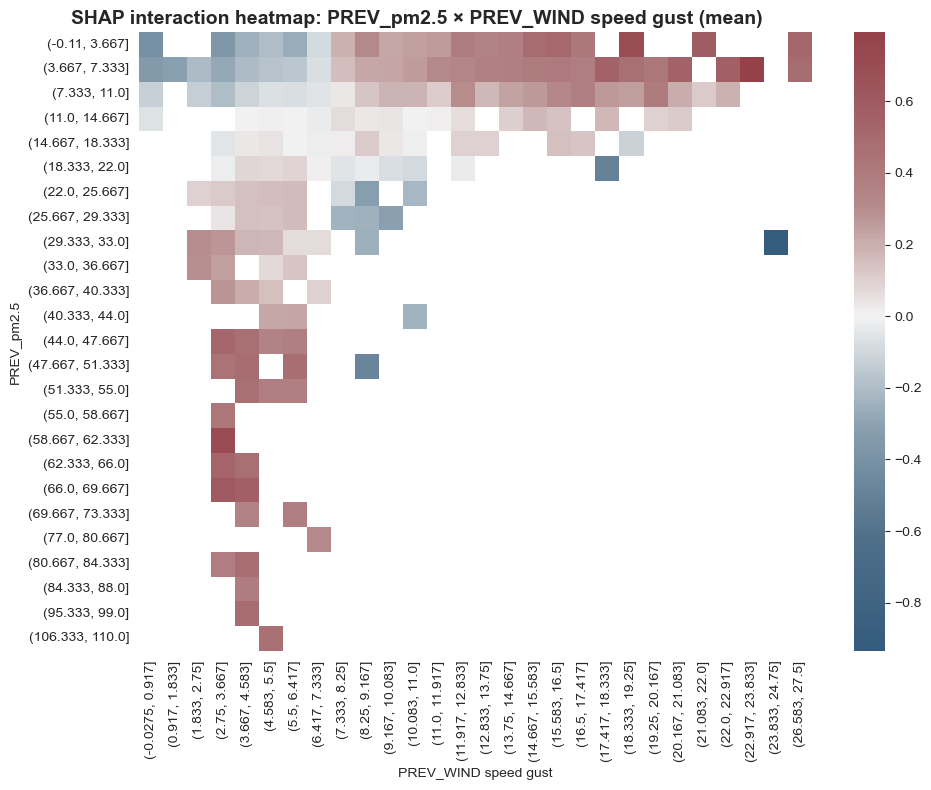

In [26]:
plot_shap_interaction_heatmap(interaction_values_pm, data_pm, 'PREV_pm2.5', 'PREV_WIND speed gust')

In [27]:
feature_importances_50_pm = model_50_pm.get_feature_importance()
feature_names_pm = model_50_pm.feature_names_

# Create a DataFrame for easier plotting
importance_50_pm = pd.DataFrame({
    'Feature': feature_names_pm,
    'Importance': feature_importances_50_pm
}).sort_values(by='Importance', ascending=True)

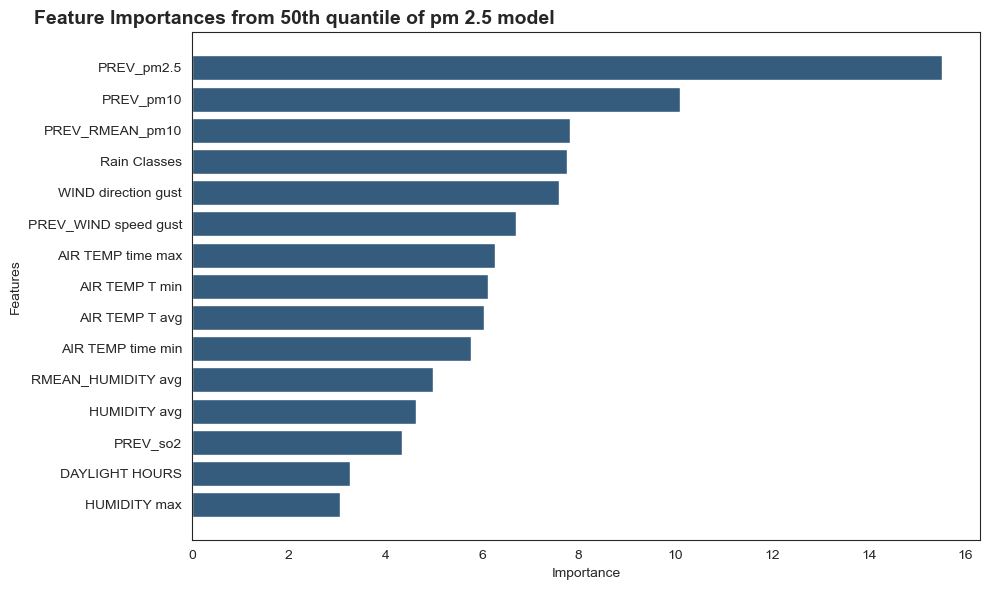

In [28]:
plt.figure(figsize=(10, 6))
plt.barh(importance_50_pm['Feature'], importance_50_pm['Importance'], color = '#355C7D')

plt.ylabel('Features')
plt.xlabel('Importance')
plt.title(
    'Feature Importances from 50th quantile of pm 2.5 model',
    loc="left",
    fontsize=14,
    fontweight="bold",
    x=-0.2
)
plt.tight_layout()
plt.show()

#### 📊 **Median Model evaluation - pm2.5**
1️⃣ **Global structure (feature importance)**

The ranking confirms a strong persistence effect:

- PREV_pm2.5 is by far the dominant driver.
- Followed by PREV_pm10, PREV_RMEAN_pm10, and meteorological regime variables (Rain Classes, WIND direction gust).
- Thermodynamic variables (temperature, humidity) and daylight play a secondary but non-negligible role.

👉 *The model for the 2nd quantile is still mainly driven by pollutant memory, with weather acting as a modulation factor.*

2️⃣ **Main effects (SHAP summary)**

- High previous PM values push predictions upward even at this lower quantile.
- Higher wind speed gusts generally reduce predicted pm2.5 (negative SHAP tail).
- Certain wind directions systematically shift predictions up or down.
- Temperature and humidity show non-linear, moderate contributions.

👉 *Even when estimating a lower quantile, the model preserves physically coherent relationships.*

3️⃣ **Rain Classes (SHAP boxplot)**

- No rain tends to have slightly positive SHAP values.
- Heavy/exceptional rain shifts SHAP values clearly negative.
- Light rain and normal rain lie in between.

👉 *Precipitation acts as a cleansing mechanism, reducing pm2.5 even in lower-tail conditions.*

4️⃣ **Wind direction (SHAP by category)**

Some directions (e.g., W–WSW sector) show positive contributions, while others are clearly negative.

👉 *This likely reflects transport patterns and local emission sources depending on air mass origin.*

5️⃣ **Key interaction patterns (heatmaps)**

- Wind direction × temperature
    - Certain wind sectors amplify temperature effects.
    - Interaction intensity increases at mid–high temperature ranges.
- Temperature × daylight
    - Longer daylight combined with higher temperatures tends to increase predicted pm2.5.
    - At low daylight hours, temperature effects weaken.
- Temperature × humidity
    - High humidity with moderate–high temperature often reduces SHAP contribution.
    - Dry–warm combinations push SHAP positive.
- Rain × PREV_pm2.5
    - When previous pm2.5 is high but rain is present, the positive persistence effect is dampened.
    - Without rain, the persistence effect is amplified.
- PREV_pm2.5 × wind gust
    - Strong gusts mitigate the impact of high previous pm2.5.
    - Weak winds allow accumulation effects to dominate.

👉 *Interactions are meteorologically consistent: transport + dispersion mechanisms actively reshape pollutant persistence.*

6️⃣ **Overall interpretation**

- **Autocorrelation** (pollution memory) remains the primary driver.
- **Meteorological dispersion mechanisms** (wind, rain) systematically reduce predicted concentrations.
- **Thermodynamic conditions** (temperature, humidity, daylight) modulate accumulation processes.
- Interaction effects are structured and physically interpretable.

In short, the model captures a coherent balance between pollutant persistence and atmospheric cleansing/transport dynamics, even when focusing on the lower tail of the pm2.5 distribution.

## 25th Percentile

### Base

In [29]:
quantile = 0.25
base_model_25 = CatBoostRegressor(loss_function=f'Quantile:alpha={quantile}',
                              cat_features=cat_cols_pm,
                              eval_metric=f'Quantile:alpha={quantile}',
                              random_state = 0, verbose=0).fit(x_train_pm, y_train_pm,
                                                               eval_set=[(x_train_pm, y_train_pm)], verbose = 0)

print('Evaluation of the base model')
base_train_25 = mean_pinball_loss(y_train_pm,base_model_25.predict(x_train_pm), alpha = 0.25)
base_test_25 = mean_pinball_loss(y_test_pm,base_model_25.predict(x_test_pm), alpha = 0.25)
base_tot_25 = mean_pinball_loss(pm_vals,base_model_25.predict(data_pm), alpha = 0.25)

print('Training set:',base_train_25)
print('Improvement on training set',round(((baseline_25[0]-base_train_25)/baseline_25[0])*100,2),'%')
print('Test set:',base_test_25)
print('Improvement on test set',round(((baseline_25[1]-base_test_25)/baseline_25[1])*100,2),'%')
print('Full set:',base_tot_25)
print('Improvement on training set',round(((baseline_25[2]-base_tot_25)/baseline_25[2])*100,2),'%')

Evaluation of the base model
Training set: 1.394325879562292
Improvement on training set 47.51 %
Test set: 2.048490238668657
Improvement on test set 16.18 %
Full set: 1.5913516435067905
Improvement on training set 38.29 %


### Fine-Tuned

In [30]:
quantile = 0.25
model_25_pm = CatBoostRegressor(loss_function=f'Quantile:alpha={quantile}',
                              cat_features=cat_cols_pm,
                              eval_metric=f'Quantile:alpha={quantile}',
                             n_estimators = 850,
                             depth = 3,
                              random_state = 0, verbose=0).fit(x_train_pm, y_train_pm,
                                                               eval_set=[(x_train_pm, y_train_pm)], verbose = 0)

print('Evaluation of the tuned model')
tuned_train_25 = mean_pinball_loss(y_train_pm,model_25_pm.predict(x_train_pm), alpha = 0.25)
tuned_test_25 = mean_pinball_loss(y_test_pm,model_25_pm.predict(x_test_pm), alpha = 0.25)
tuned_tot_25 = mean_pinball_loss(pm_vals,model_25_pm.predict(data_pm), alpha = 0.25)

print('Training set:',tuned_train_25)
print('Improvement on training set',round(((baseline_25[0]-tuned_train_25)/baseline_25[0])*100,2),'%')
print('Test set:',tuned_test_25)
print('Improvement on test set',round(((baseline_25[1]-tuned_test_25)/baseline_25[1])*100,2),'%')
print('Full set:',tuned_tot_25)
print('Improvement on training set',round(((baseline_25[2]-tuned_tot_25)/baseline_25[2])*100,2),'%')

Evaluation of the tuned model
Training set: 1.7912285925724
Improvement on training set 32.57 %
Test set: 1.9442626236644547
Improvement on test set 20.45 %
Full set: 1.8373204446668914
Improvement on training set 28.75 %


## 75th Percentile

### Base

In [31]:
quantile = 0.75
base_model_75 = CatBoostRegressor(loss_function=f'Quantile:alpha={quantile}',
                              cat_features=cat_cols_pm,
                              eval_metric=f'Quantile:alpha={quantile}',
                              random_state = 0, verbose=0).fit(x_train_pm, y_train_pm,
                                                               eval_set=[(x_train_pm, y_train_pm)], verbose = 0)

print('Evaluation of the base model')
base_train_75 = mean_pinball_loss(y_train_pm,base_model_75.predict(x_train_pm), alpha = 0.75)
base_test_75 = mean_pinball_loss(y_test_pm,base_model_75.predict(x_test_pm), alpha = 0.75)
base_tot_75 = mean_pinball_loss(pm_vals,base_model_75.predict(data_pm), alpha = 0.75)

print('Training set:',base_train_75)
print('Improvement on training set',round(((baseline_75[0]-base_train_75)/baseline_75[0])*100,2),'%')
print('Test set:',base_test_75)
print('Improvement on test set',round(((baseline_75[1]-base_test_75)/baseline_75[1])*100,2),'%')
print('Full set:',base_tot_75)
print('Improvement on training set',round(((baseline_75[2]-base_tot_75)/baseline_75[2])*100,2),'%')

Evaluation of the base model
Training set: 1.5164732746688923
Improvement on training set 59.55 %
Test set: 2.1480514396274097
Improvement on test set 38.71 %
Full set: 1.7066963718299888
Improvement on training set 53.0 %


In [32]:
quantile = 0.75
model_75_pm = CatBoostRegressor(loss_function=f'Quantile:alpha={quantile}',
                              cat_features=cat_cols_pm,
                              eval_metric=f'Quantile:alpha={quantile}',
                             colsample_bylevel = 0.9,
                             n_estimators = 775,
                             depth = 3,
                              random_state = 0, verbose=0).fit(x_train_pm, y_train_pm,
                                                               eval_set=[(x_train_pm, y_train_pm)], verbose = 0)

print('Evaluation of the tuned model')
tuned_train_75 = mean_pinball_loss(y_train_pm,model_75_pm.predict(x_train_pm), alpha = 0.75)
tuned_test_75 = mean_pinball_loss(y_test_pm,model_75_pm.predict(x_test_pm), alpha = 0.75)
tuned_tot_75 = mean_pinball_loss(pm_vals,model_75_pm.predict(data_pm), alpha = 0.75)

print('Training set:',tuned_train_75)
print('Improvement on training set',round(((baseline_75[0]-tuned_train_75)/baseline_75[0])*100,2),'%')
print('Test set:',tuned_test_75)
print('Improvement on test set',round(((baseline_75[1]-tuned_test_75)/baseline_75[1])*100,2),'%')
print('Full set:',tuned_tot_75)
print('Improvement on training set',round(((baseline_75[2]-tuned_tot_75)/baseline_75[2])*100,2),'%')

Evaluation of the tuned model
Training set: 1.9939038181169968
Improvement on training set 46.81 %
Test set: 2.025487383476822
Improvement on test set 42.21 %
Full set: 2.003416375636351
Improvement on training set 44.83 %


## Results - PM 2.5

In [33]:
def correction_function(low, high):
    if high <= low:
        return (low+1)
    else:
        return high

In [34]:
data_pm_full = data_full.copy()


data_pm_full['Quartile1'] = model_25_pm.predict(data_pm)
data_pm_full['Median'] = model_50_pm.predict(data_pm)
data_pm_full['Quartile3'] = model_75_pm.predict(data_pm)

data_pm_full['Quartile1'] = data_pm_full['Quartile1'].apply(lambda z: 0 if z < 0 else z)
data_pm_full['Median'] = data_pm_full.apply(lambda row: correction_function(row['Quartile1'],row['Median']), axis = 1)
data_pm_full['Quartile3'] = data_pm_full.apply(lambda row: correction_function(row['Median'],row['Quartile3']), axis = 1)

data_pm_full['IQR'] = data_pm_full['Quartile3'] - data_pm_full['Quartile1']

data_pm_full['LowLimit'] = data_pm_full['Quartile1'] - (data_pm_full['IQR'] * 1.5)

data_pm_full['LowLimit'] = data_pm_full['LowLimit'].apply(lambda z: 0 if z < 0 else z)

data_pm_full['HighLimit'] = data_pm_full['Quartile3'] + (data_pm_full['IQR'] * 1.5)

In [35]:
data_pm_full['pm2.5'] = pm_vals

In [36]:
pm_levels = {
    "Good (0-5)": 0,
    "Fair (6-15)": 6,
    "Moderate (16-50)": 16,
    "Poor (51-90)": 51,
    "Very Poor (91-140)": 91,
    "Extremely Poor (>140)": 141
}

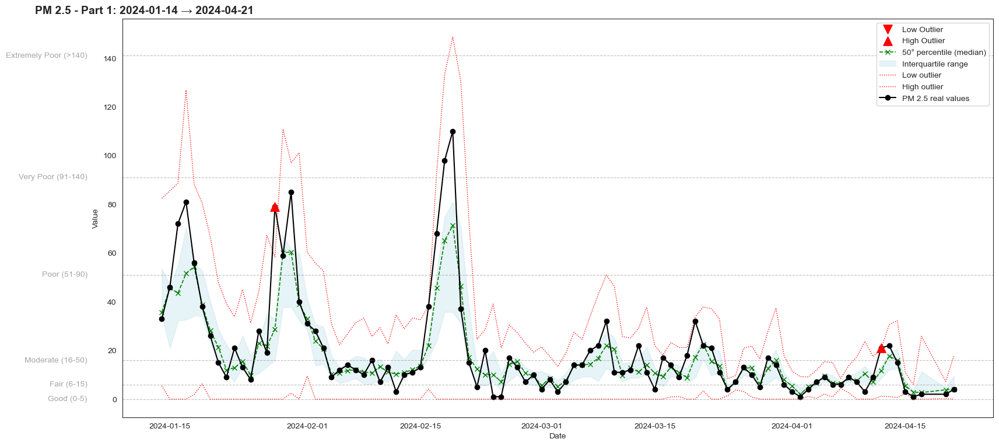

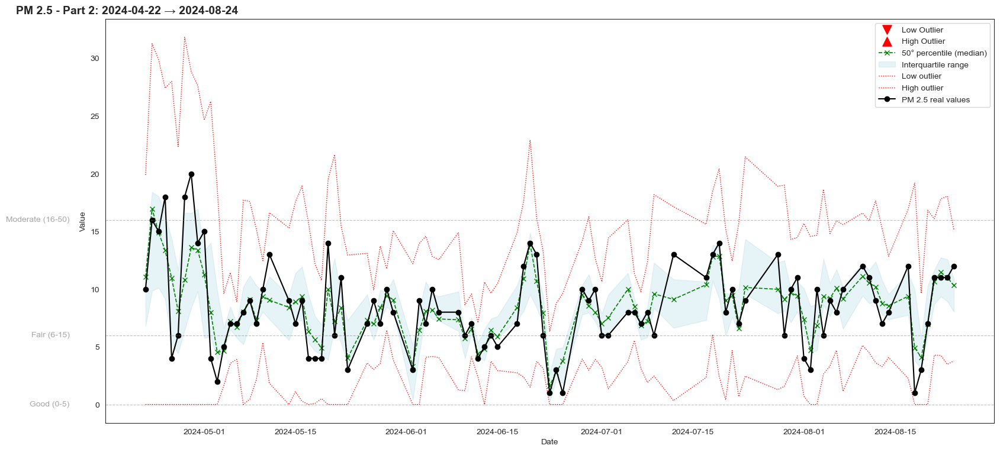

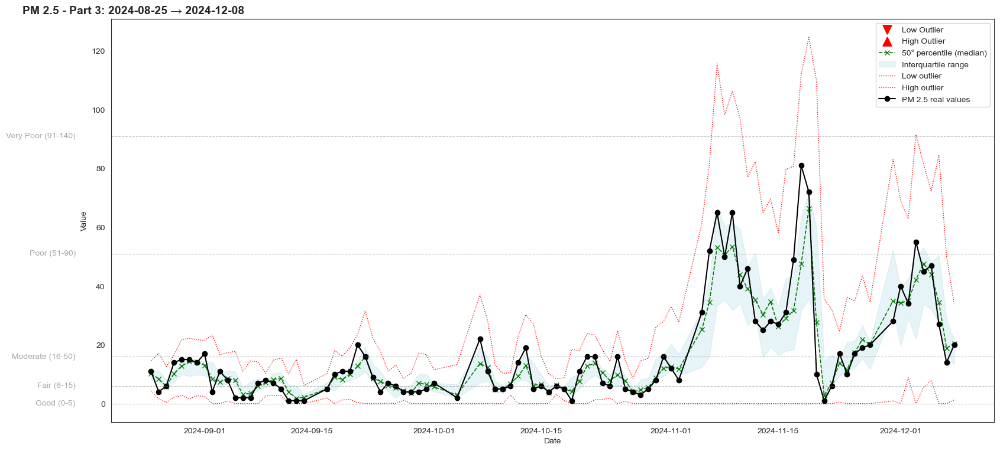

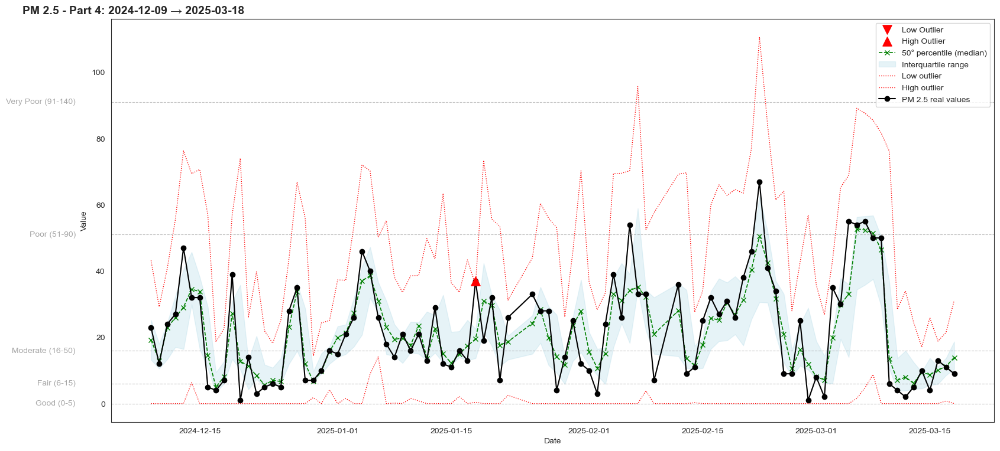

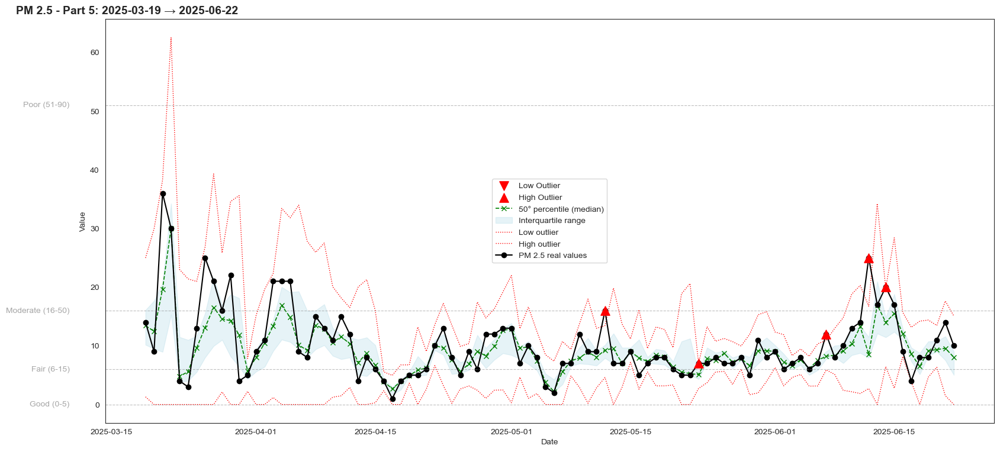

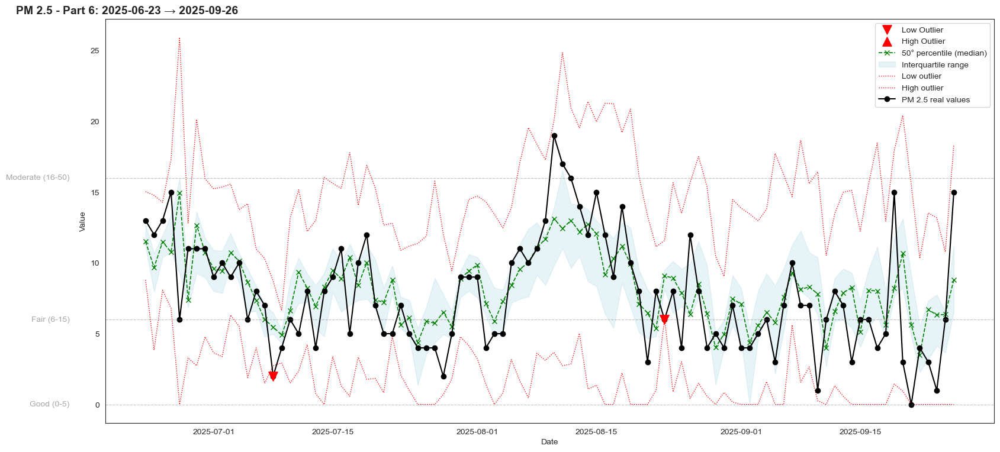

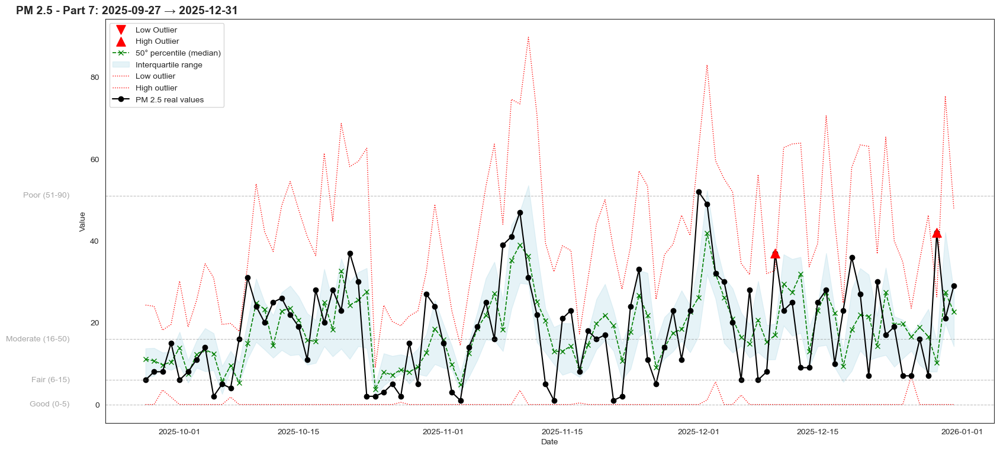

In [37]:
# Split the dataframe into approximately equal parts
data_chunks = np.array_split(data_pm_full, 7)

for i, chunk in enumerate(data_chunks, start=1):
    plt.figure(figsize=(16, 8))

    # Start and end dates of the chunk
    start_date = chunk.index.min().strftime('%Y-%m-%d')
    end_date = chunk.index.max().strftime('%Y-%m-%d')

    # Outliers
    low_outliers = (chunk['pm2.5'] < chunk['LowLimit'])
    plt.scatter(chunk.index[low_outliers], chunk['pm2.5'][low_outliers], color='red', label='Low Outlier', zorder=5,
               marker = 'v', s=120)

    high_outliers = (chunk['pm2.5'] > chunk['HighLimit'])
    plt.scatter(chunk.index[high_outliers], chunk['pm2.5'][high_outliers], color='red', label='High Outlier', zorder=5,
               marker = '^', s=120)

    # Quantiles and IQR interval
    plt.plot(chunk.index, chunk['Median'], label='50° percentile (median)', linestyle='--', color='green', linewidth=1.2,
            marker = 'x')
    plt.fill_between(chunk.index, chunk['Quartile1'], chunk['Quartile3'],
                     color='lightblue', alpha=0.3, label='Interquartile range')

    # Outlier limits
    plt.plot(chunk.index, chunk['LowLimit'], label='Low outlier', linestyle=':', color='red', linewidth=1)
    plt.plot(chunk.index, chunk['HighLimit'], label='High outlier', linestyle=':', color='red', linewidth=1)

    # Actual values
    plt.plot(chunk.index, chunk['pm2.5'], label='PM 2.5 real values', color='black', marker='o')

    # Dynamic title with dates
    plt.title(
        f'PM 2.5 - Part {i}: {start_date} → {end_date}',
        loc="left",
        fontsize=14,
        fontweight="bold",
        x=-0.1
    )
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.tight_layout(pad=2)

    max_val = max(chunk['pm2.5'].max(),chunk['HighLimit'].max())

    ax = plt.gca()

    for label, value in pm_levels.items():
        if value <= max_val:
            ax.axhline(y=value, color='gray', linestyle='--', linewidth=0.8, alpha=0.5)
            ax.text(-0.04, value, label, color='gray', fontsize=10, alpha=0.7,
                    va='center', ha='right', transform=ax.get_yaxis_transform())

    plt.show()

#### 📊 **Full prediction vs real values (PM2.5)**

These plots combine:

- Predicted Q1, median (Q2), Q3
- Estimated IQR band
- Derived outlier thresholds
- Observed real PM2.5 values

1️⃣ **Overall calibration**

Across all periods:

- The median prediction closely follows the central tendency of the data.
- The interquartile band adapts well to seasonal variability (wider in winter, narrower in summer).
- Real values are mostly contained within the predicted IQR.

👉 *The three quantile models reconstruct the conditional distribution coherently.*

 **Outlier detection quality**

High outliers are generally detected during strong accumulation events.

Low outliers are rarer and mainly occur in very clean, high-dispersion conditions.

Most extreme events sit clearly outside the predicted band, showing good separation.

👉 The distribution-based thresholds behave consistently with atmospheric dynamics.

2️⃣ **Distributional consistency**

Important observation:

- The predicted quartiles remain ordered and stable.
- The IQR expands during volatile phases and contracts during stable periods.
- No structural crossing or instability in quantile predictions.

👉 *This indicates good monotonic consistency between Q1–Q2–Q3 models.*

3️⃣ **Structural interpretation**

The combined quantile framework shows that:

- Median captures persistence
- Upper quartile reacts strongly to accumulation episodes
- Lower quartile reflects dispersion regimes
- IQR width becomes a proxy for atmospheric instability

🎯 **Key Points**

The three-quantile modeling approach:

- Reconstructs the full conditional distribution of PM2.5.
- Adapts well to seasonal regimes.
- Produces coherent and physically interpretable outlier detection.
- Captures both persistence and meteorological variability.

**In short, the system behaves like a distribution-aware atmospheric risk model, not just a regression model.**

In [38]:
data_pm_full['Day Type'] = day_types.values

Now the real values of PM 2.5 are classified using the models predictions

In [39]:
data_pm_full['Evaluation pm2.5'] = data_pm_full.apply(lambda row: classify_quartiles(row['LowLimit'],
                                                                         row['Quartile1'],
                                                                        row['Median'],
                                                                        row['Quartile3'],
                                                                        row['HighLimit'],
                                                                        row['pm2.5']), axis = 1)

Description of column Evaluation pm2.5
The column Evaluation pm2.5 has 0 missing values


,Evaluation pm2.5 values,Absolute frequency,Relative frequency (%)
0,low,192,28.49
1,low to medium,172,25.52
2,high,160,23.74
3,medium to high,138,20.47
4,high outlier,10,1.48
5,low outlier,2,0.30


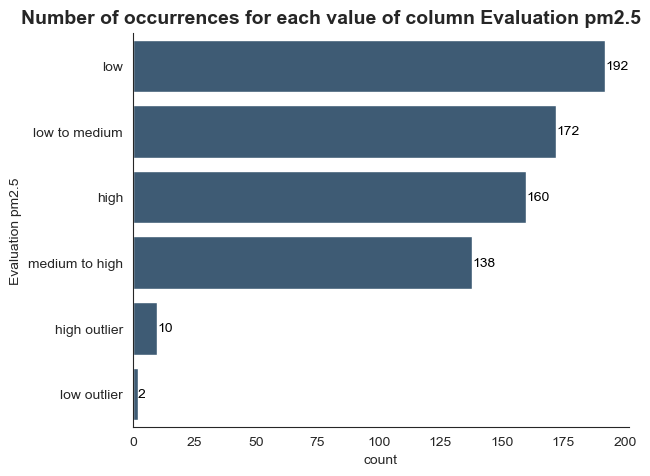

In [40]:
describe_cat_column_h(data_pm_full,'Evaluation pm2.5')

#### 📊 **Distribution of evaluation classes (PM2.5)**

This chart summarizes how real observations are positioned relative to the predicted quantile structure and outlier thresholds.

1️⃣ **Central distribution**

- Low (192) and Low to medium (172) are the most frequent categories.
- Followed by High (160) and Medium to high (138).

👉 *The majority of observations fall within the predicted interquartile structure, showing balanced coverage across lower and upper halves of the distribution.*

2️⃣ **Outliers**

- High outliers: 10
- Low outliers: 2

👉 *Extreme events are relatively rare, and the model does not over-flag outliers. This suggests that the predicted distribution envelope is well calibrated and not overly narrow.*

3️⃣ **Interpretation**

- Most observations remain inside the modeled distribution bands.
- The asymmetry (more high than low outliers) reflects typical PM2.5 behavior: accumulation episodes are more extreme than ultra-clean conditions.
- The classification confirms that the quantile-based framework captures normal variability while isolating true extreme events.

🎯 **Key points**

The evaluation distribution indicates:

- Good probabilistic calibration.
- Controlled and realistic outlier detection.
- A stable quantile structure that adapts to seasonal dynamics without excessive false alarms.

********************************************* very_humid_overcast_calm *********************************************


,Evaluation pm2.5,Absolute frequency,Relative frequency (%)
0,low outlier,0,0.00
1,low,19,21.35
2,low to medium,26,29.21
3,medium to high,17,19.10
4,high,25,28.09
5,high outlier,2,2.25


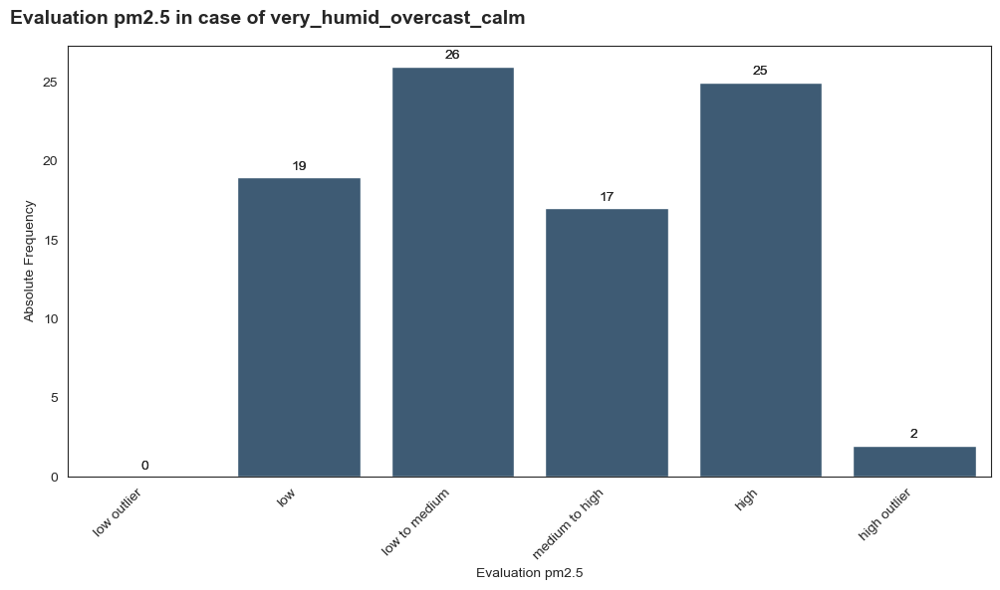

********************************************* very_humid_frequently_rainy *********************************************


,Evaluation pm2.5,Absolute frequency,Relative frequency (%)
0,low outlier,0,0.00
1,low,10,23.26
2,low to medium,12,27.91
3,medium to high,8,18.60
4,high,13,30.23
5,high outlier,0,0.00


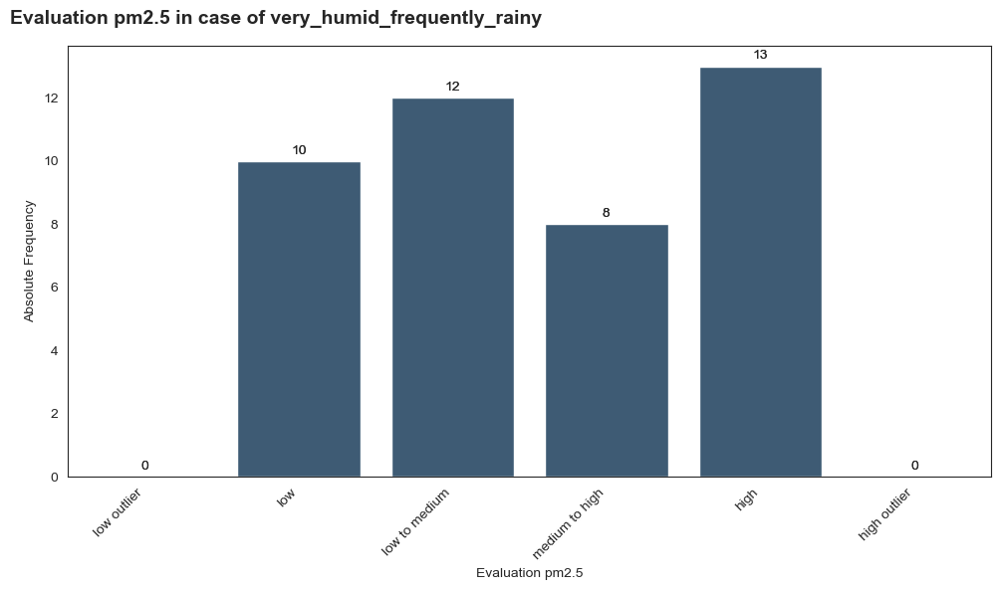

********************************************* overcast_persistent_light_rain *********************************************


,Evaluation pm2.5,Absolute frequency,Relative frequency (%)
0,low outlier,0,0.00
1,low,12,27.91
2,low to medium,10,23.26
3,medium to high,11,25.58
4,high,10,23.26
5,high outlier,0,0.00


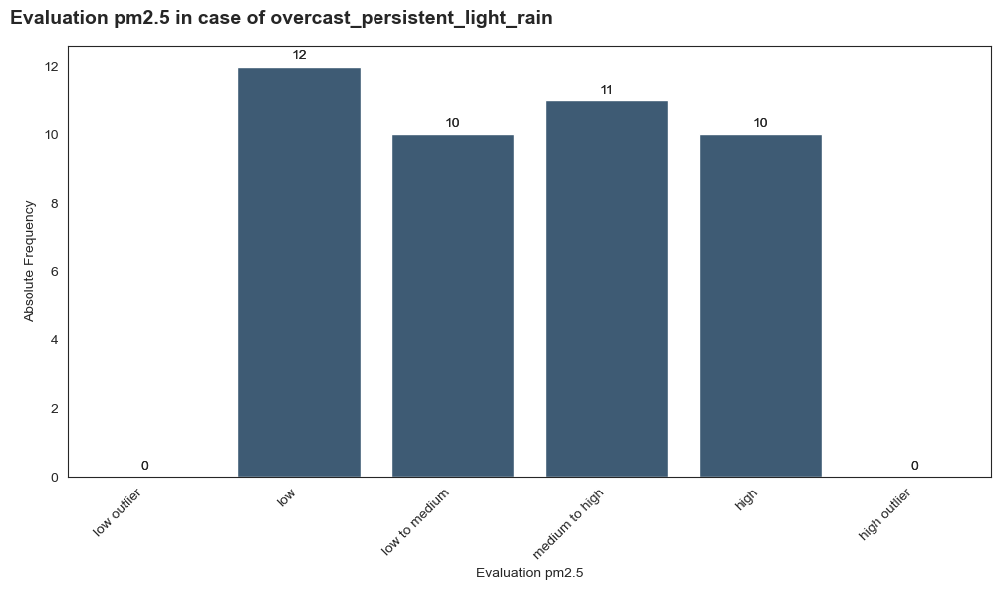

********************************************* dry_stable_calm *********************************************


,Evaluation pm2.5,Absolute frequency,Relative frequency (%)
0,low outlier,0,0.00
1,low,18,26.47
2,low to medium,15,22.06
3,medium to high,20,29.41
4,high,13,19.12
5,high outlier,2,2.94


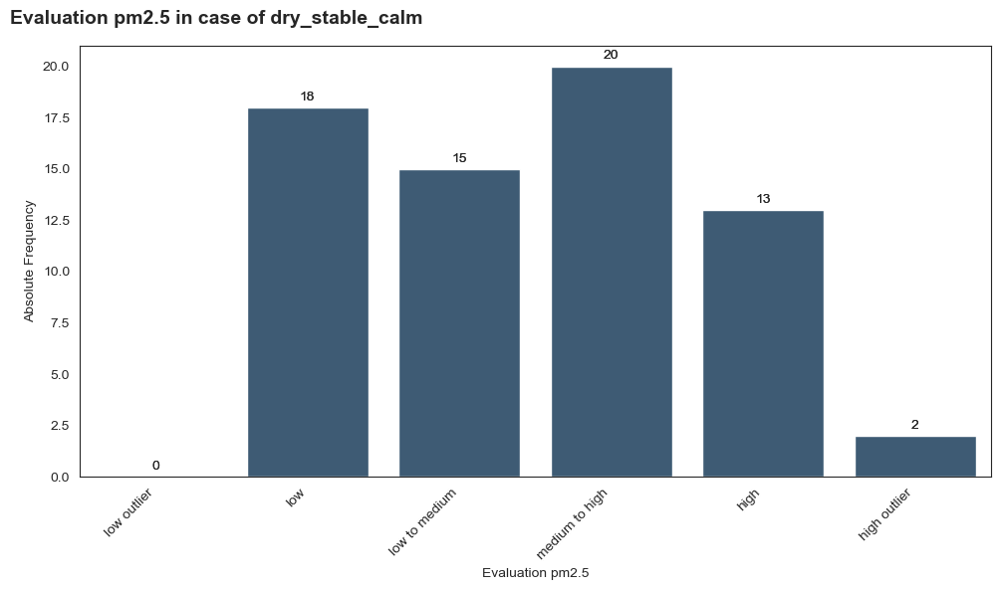

********************************************* variable_clearing *********************************************


,Evaluation pm2.5,Absolute frequency,Relative frequency (%)
0,low outlier,0,0.00
1,low,17,34.69
2,low to medium,12,24.49
3,medium to high,11,22.45
4,high,8,16.33
5,high outlier,1,2.04


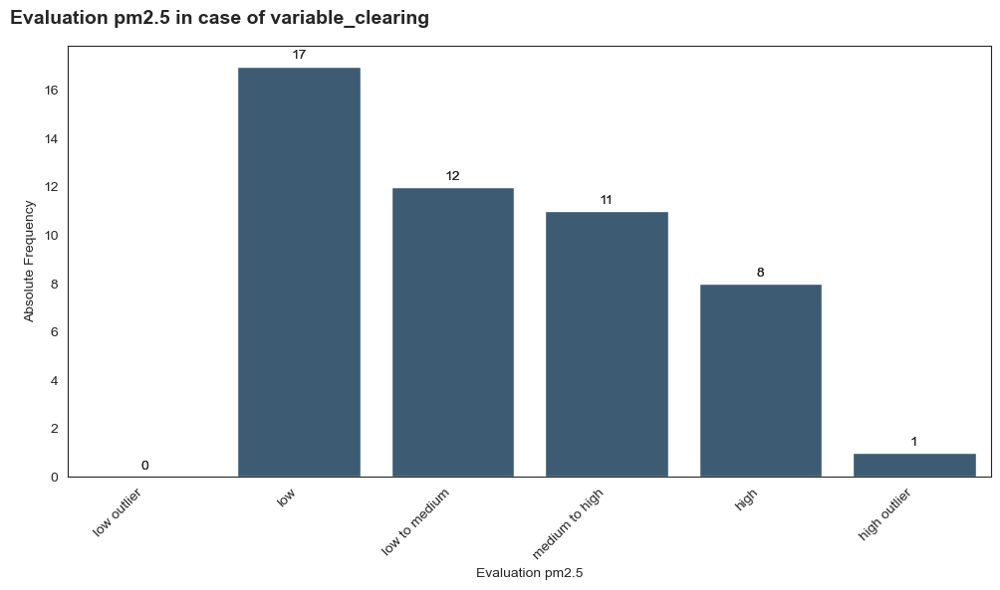

********************************************* mild_stable_partly_cloudy *********************************************


,Evaluation pm2.5,Absolute frequency,Relative frequency (%)
0,low outlier,0,0.00
1,low,17,21.79
2,low to medium,23,29.49
3,medium to high,12,15.38
4,high,25,32.05
5,high outlier,1,1.28


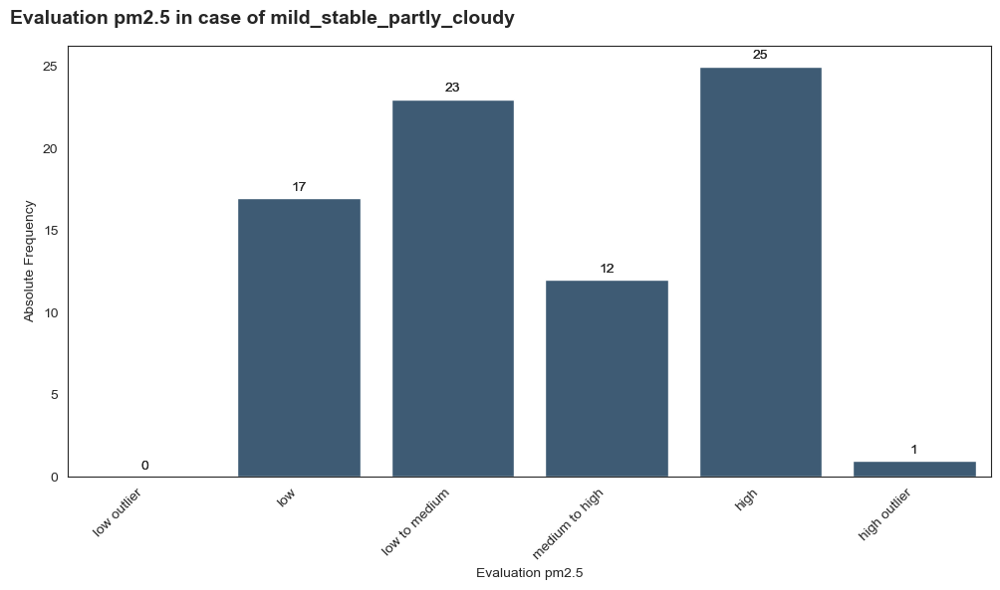

********************************************* mild_unstable_showers *********************************************


,Evaluation pm2.5,Absolute frequency,Relative frequency (%)
0,low outlier,0,0.00
1,low,19,33.33
2,low to medium,16,28.07
3,medium to high,8,14.04
4,high,13,22.81
5,high outlier,1,1.75


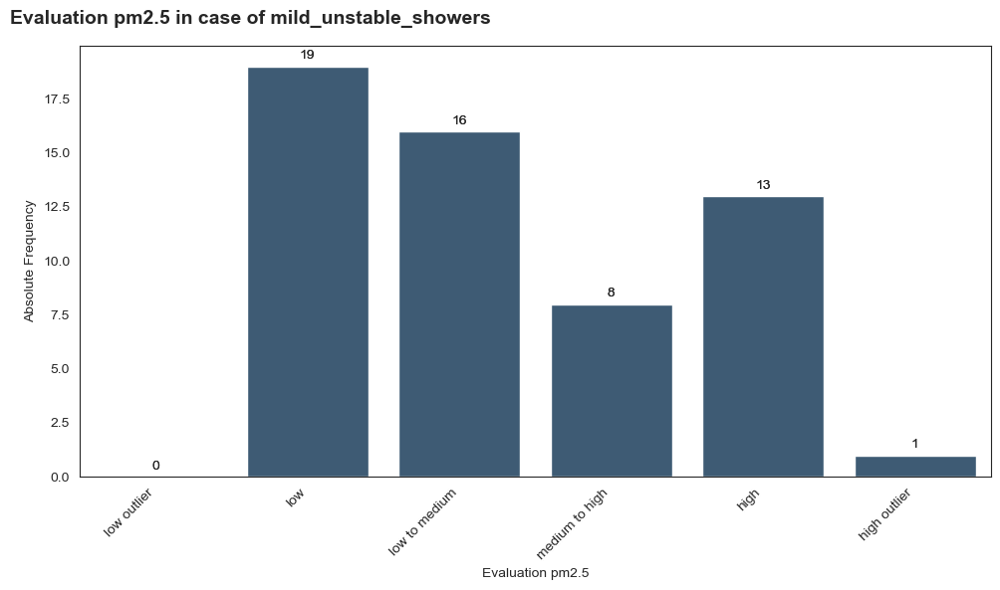

********************************************* windy_humid_worsening *********************************************


,Evaluation pm2.5,Absolute frequency,Relative frequency (%)
0,low outlier,0,0.00
1,low,13,50.00
2,low to medium,8,30.77
3,medium to high,3,11.54
4,high,2,7.69
5,high outlier,0,0.00


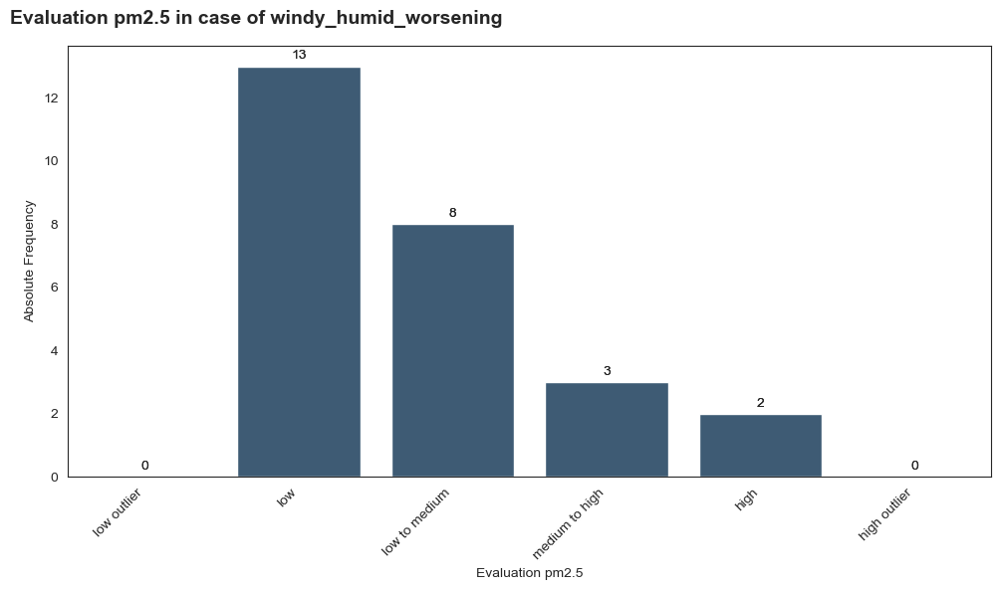

********************************************* strongly_perturbed_very_windy *********************************************


,Evaluation pm2.5,Absolute frequency,Relative frequency (%)
0,low outlier,1,2.13
1,low,18,38.30
2,low to medium,8,17.02
3,medium to high,11,23.40
4,high,8,17.02
5,high outlier,1,2.13


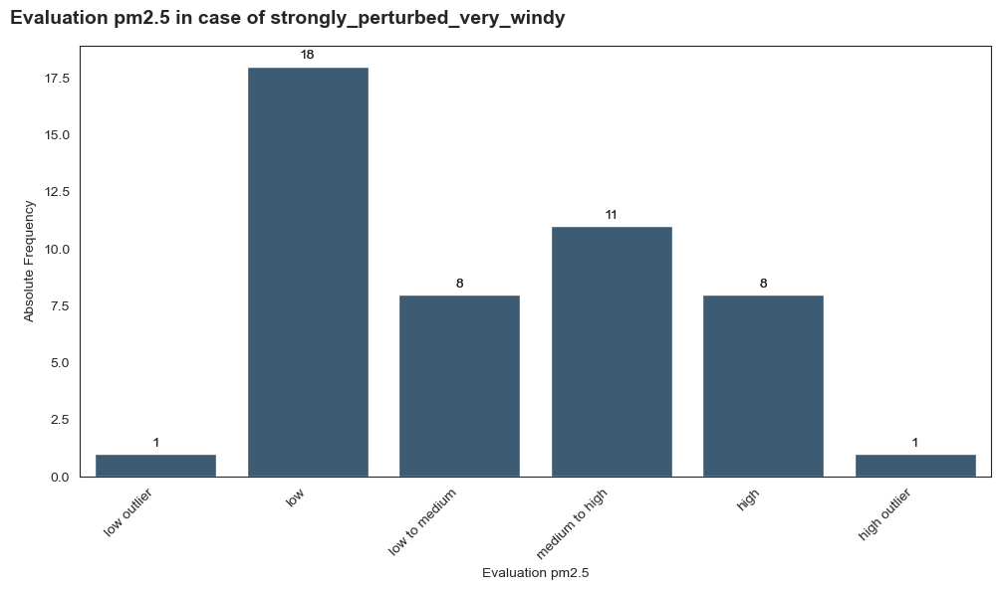

********************************************* continuous_stratiform_rain *********************************************


,Evaluation pm2.5,Absolute frequency,Relative frequency (%)
0,low outlier,0,0.00
1,low,3,11.54
2,low to medium,12,46.15
3,medium to high,5,19.23
4,high,6,23.08
5,high outlier,0,0.00


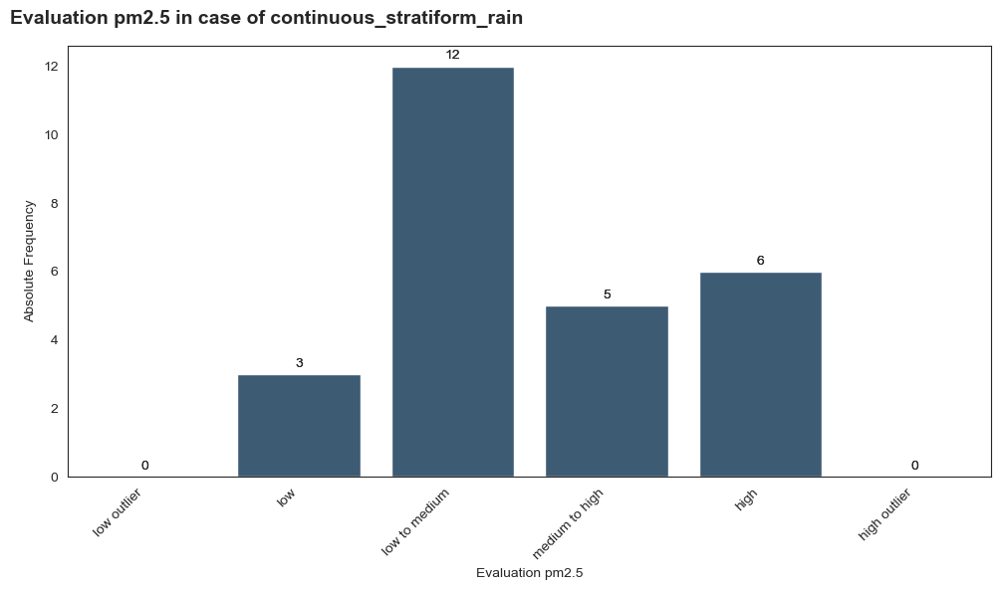

********************************************* slightly_unstable_variable *********************************************


,Evaluation pm2.5,Absolute frequency,Relative frequency (%)
0,low outlier,0,0.00
1,low,20,40.82
2,low to medium,11,22.45
3,medium to high,10,20.41
4,high,8,16.33
5,high outlier,0,0.00


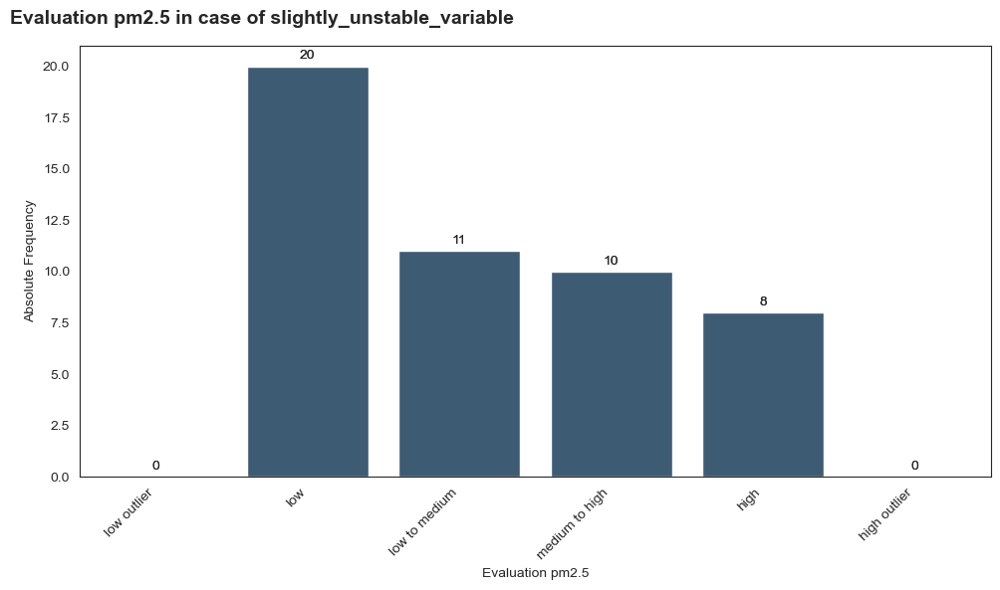

********************************************* hot_dry_stable *********************************************


,Evaluation pm2.5,Absolute frequency,Relative frequency (%)
0,low outlier,1,1.01
1,low,26,26.26
2,low to medium,19,19.19
3,medium to high,22,22.22
4,high,29,29.29
5,high outlier,2,2.02


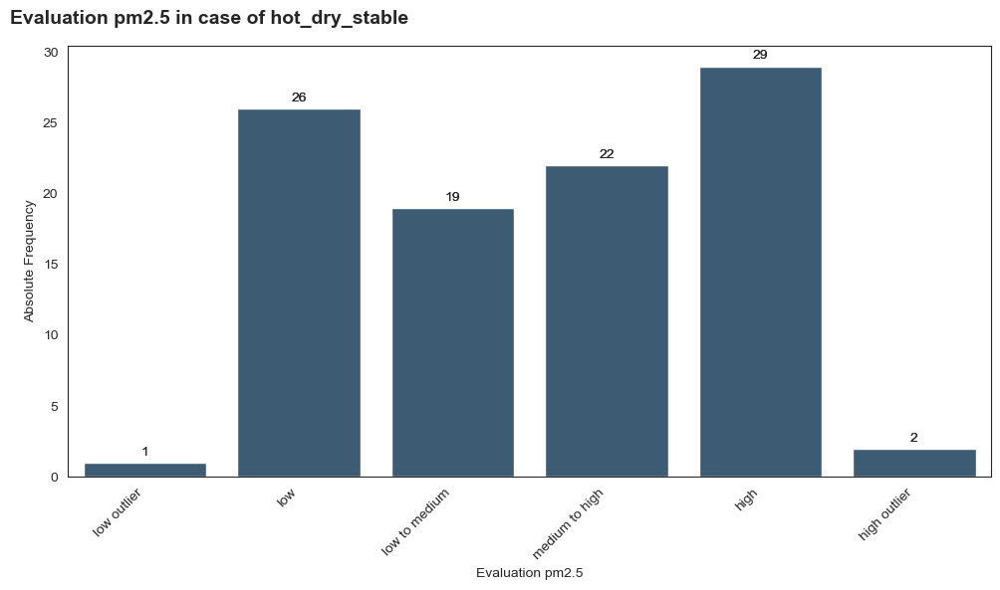

In [41]:
categories_by_groups(data_pm_full, 'Day Type', 'Evaluation pm2.5', ['low outlier','low','low to medium','medium to high',
                                                                    'high','high outlier'])

The Kruskal-Wallis H-test for the different groups of the column Day Type and the column IQR is 4.824508475024742e-72 so there is a significant deviation of the median of IQR in at least two groups.


,count,mean,std,min,25%,50%,75%,max
Day Type,,,,,,,,
continuous_stratiform_rain,26.0,6.044321,3.003667,0.802724,4.007957,5.882512,7.989888,14.200074
dry_stable_calm,68.0,11.861847,8.051514,1.401764,6.468256,9.897631,15.297654,45.258609
hot_dry_stable,99.0,3.623334,1.323511,1.021969,2.816941,3.388127,4.352149,8.856700
mild_stable_partly_cloudy,78.0,7.588885,6.365921,0.995322,3.740653,5.316867,9.183653,38.978486
mild_unstable_showers,57.0,4.352987,3.214781,1.004731,2.629634,3.619350,4.592217,22.208880
overcast_persistent_light_rain,43.0,12.700884,5.922613,3.111201,8.551909,10.691521,17.234996,23.939495
slightly_unstable_variable,49.0,5.805318,3.299177,0.981307,3.331028,4.587126,7.135721,14.367009
strongly_perturbed_very_windy,47.0,2.781640,2.180269,0.780600,1.680172,2.158859,2.956227,12.762958
variable_clearing,49.0,3.675518,2.005859,0.925470,2.120444,3.224541,4.130808,9.801189


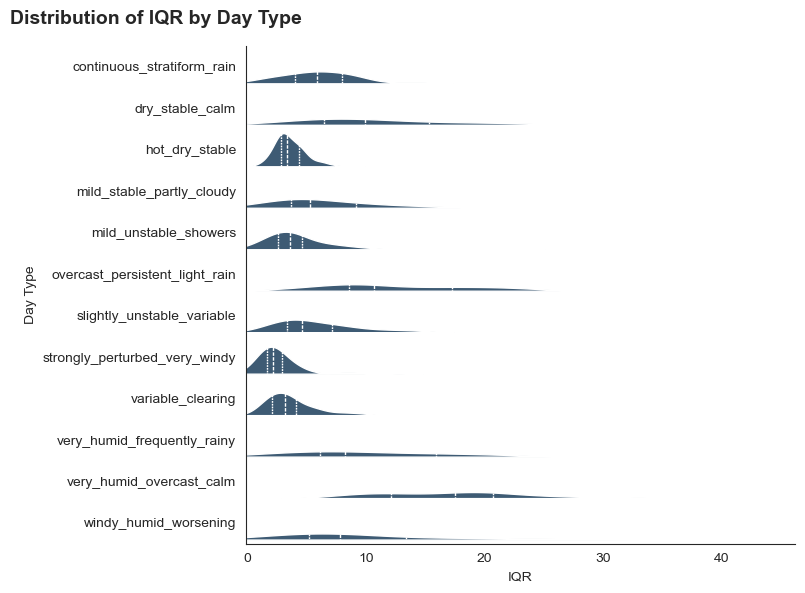

In [42]:
cat_num_rel(data_pm_full,'Day Type','IQR', lgscale = False)

#### 📊 **PM2.5 Evaluation by Day Type & IQR Distribution**
1️⃣ **PM2.5 Evaluation by Day Type (Cluster-Based Weather Regimes)**

These bar charts show how PM2.5 levels are distributed across evaluation classes under each clustered day type.

**🔹 General Patterns**

**Stable and dry conditions** (hot_dry_stable, dry_stable_calm, mild_stable_partly_cloudy)
→ Tend to show higher frequencies of medium-to-high and high PM2.5 levels.
→ Occasional high outliers appear, especially in hot_dry_stable days.
→ This confirms the accumulation effect under stagnant atmospheric conditions.

**Humid and overcast conditions** (very_humid_overcast_calm, very_humid_frequently_rainy)
→ Display a broad distribution from low to high categories.
→ High concentrations are still present, especially when wind is limited.
→ Rain does not always immediately reduce PM2.5 if atmospheric mixing remains weak.

**Rain-dominated regimes** (continuous_stratiform_rain, overcast_persistent_light_rain)
→ Show fewer high values overall.
→ Distribution concentrates more in low and low-to-medium classes.
→ Wet deposition likely contributes to pollutant removal.

**Wind-driven instability** (strongly_perturbed_very_windy, windy_humid_worsening)
→ Mostly low to moderate values.
→ Very limited high outliers.
→ Wind enhances dispersion and reduces accumulation.

**Slightly unstable / variable conditions**
→ Balanced distributions with moderate variability.
→ Intermediate pollution dynamics.

**🔹 Outliers**

High outliers are relatively rare but concentrate in:

- hot_dry_stable
- dry_stable_calm

Low outliers are extremely rare across all regimes.

*Overall, the clustering successfully captures meteorological regimes that meaningfully differentiate pollution behavior.*

**2️⃣ Distribution of IQR by Day Type**

The IQR (Interquartile Range) distribution plot highlights intra-regime variability.

**🔹 Key Observations**

Highest variability (large IQR)

- very_humid_overcast_calm
- overcast_persistent_light_rain
- dry_stable_calm
→ **These regimes show large internal dispersion of PM2.5 levels.**

Moderate variability

- mild_stable_partly_cloudy
- slightly_unstable_variable
- very_humid_frequently_rainy

Lowest variability

- strongly_perturbed_very_windy
- windy_humid_worsening
- hot_dry_stable

**🔹 Interpretation**

**Stable atmospheric conditions tend to produce consistently elevated pollution**, leading to:

- Higher medians
- Moderate IQR (concentration accumulation but predictable)
- Mixed or transitional regimes produce:
- Greater variability
- Larger IQR
→ *Suggesting dynamic pollutant behavior depending on secondary factors.*

In [43]:
data_pm_full['True pm2.5 CLASS'] = pm_classes

Now the forecasted range of values is used to determine the danger class based on EU AQI, and to compare it to the real one, and finally evaluating this "classification".

In [44]:
data_pm_full['Estimated pm2.5 CLASS'] = data_pm_full.apply(lambda row: choose_quartile_ref(row['pm2.5'],
                                                                                           row['Quartile1'],
                                                                                           row['Median'],
                                                                                           row['Quartile3']),
                                                           axis = 1).apply(lambda p: classify_level(p,
                                                                                                    EU_AQI_THRESHOLDS['pm2.5']))

In [45]:
cm_pm = confusion_matrix(data_pm_full['True pm2.5 CLASS'], data_pm_full['Estimated pm2.5 CLASS'], labels=EU_AQI_ORDER[:-1],
                        normalize = 'true')

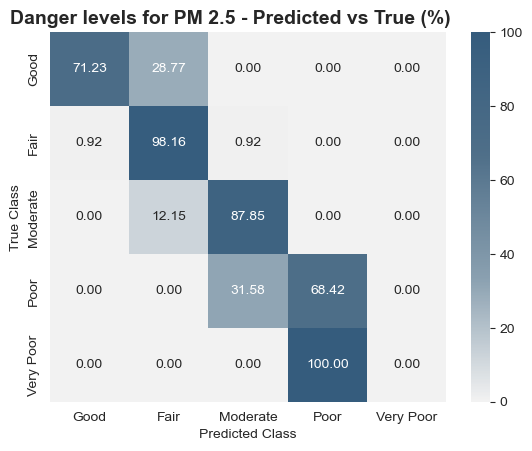

In [46]:
sns.heatmap(cm_pm*100, annot=True, fmt='0.2f', cmap = hcmap_mono, xticklabels=EU_AQI_ORDER[:-1], yticklabels=EU_AQI_ORDER[:-1])
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.title("Danger levels for PM 2.5 - Predicted vs True (%)", loc="left",
    fontsize=14,
    fontweight="bold",
    x=-0.1)
plt.show()

In [47]:
print(classification_report(data_pm_full['True pm2.5 CLASS'], data_pm_full['Estimated pm2.5 CLASS'], labels=EU_AQI_ORDER[:-1]))

              precision    recall  f1-score   support

        Good       0.97      0.71      0.82       146
        Fair       0.83      0.98      0.90       326
    Moderate       0.95      0.88      0.91       181
        Poor       0.87      0.68      0.76        19
   Very Poor       0.00      0.00      0.00         2

    accuracy                           0.88       674
   macro avg       0.72      0.65      0.68       674
weighted avg       0.89      0.88      0.88       674



#### 🔎 **Overall Performance Pattern**

The matrix shows a strong diagonal dominance, meaning most observations are correctly classified.

✅ **Good Class**

- 71.23% correctly classified
- 28.77% misclassified as Fair
- No severe misclassifications
→ *The model is slightly conservative, occasionally overestimating risk.*

✅ **Fair Class**

- 98.16% correctly classified
- Minimal confusion (0.92% toward Good and Moderate)
→ *Extremely strong performance in this range.*

✅ **Moderate Class**

- 87.85% correctly classified
- 12.15% predicted as Fair
→ *Slight downward bias, but still robust.*

⚠ **Poor Class**

- 68.42% correctly classified
- 31.58% predicted as Moderate
→ *Noticeable underestimation of higher pollution episodes.*

❗ **Very Poor Class**

- 0% correctly classified
- 100% predicted as Poor
→ *The model systematically underestimates the most extreme pollution events.*

🎯 **Interpretation**
1️⃣ **Strong Performance in Low-to-Mid Ranges**

The quartile-based method works very well for:

- Good
- Fair
- Moderate

This confirms:

- Accurate IQR estimation
- Reliable median behavior
- Good central distribution modeling

2️⃣ **Systematic Underestimation of Extremes**

The model struggles in the upper tail:

- Poor → partially shifted to Moderate
- Very Poor → fully shifted to Poor

This is expected because:

- The method caps extreme values at Q3
- Quartiles are robust but not tail-sensitive
- Extreme pollution events lie outside typical interquartile structure

In other words:

**The model is robust but conservative in high-risk conditions.**

📈 **What This Means Practically**
✔ Strength

- Stable and reliable for everyday pollution levels
- Low risk of false extreme alarms
- Good probabilistic central behavior

⚠ **Limitation**

- Not optimal for detecting severe pollution spikes
- Underestimates rare high-impact events

#### 📌 **Conclusions on the PM2.5 Modeling Framework**

The PM2.5 modeling approach proved to be robust and structurally coherent. The models successfully captured the central behavior and variability of pollution across different meteorological regimes, showing strong performance in low-to-moderate danger levels and good stability over time.

The regime-based clustering of day types highlighted how **stable atmospheric conditions favor accumulation, while windy or rainy regimes promote dispersion**. This confirms the physical consistency of the modeling framework.

However, the quartile-based classification tends to **underestimate extreme pollution events**, as tail behavior is not explicitly modeled. **The system is therefore reliable and conservative, but less sensitive to rare high-impact episodes.**

*Overall, the methodology provides a solid probabilistic foundation for air quality analysis, combining interpretability, meteorological consistency, and predictive stability, with clear room for enhancement in extreme-event detection.*

## O3

In [48]:
data_o3 = data_full.copy()[['PREV_o3', 'HUMIDITY avg', 'AIR TEMP T max', 'PREV_AIR TEMP T avg',
                            'AIR TEMP time min', 'RMEAN_AIR TEMP T avg', 'DAYLIGHT HOURS',
                            'PREV_AIR TEMP T max', 'PREV_pm10', 'AIR TEMP time max']]

In [49]:
for o in data_o3.select_dtypes(include = 'object').columns.tolist():
    data_o3[o] = data_o3[o].astype('category')

cat_cols_o3 = data_o3.select_dtypes(include='category').columns.tolist()

x_train_o3 = data_o3.head(int(data.shape[0]*0.7))

x_test_o3 = data_o3.tail(data.shape[0]-int(data.shape[0]*0.7))

y_train_o3 = o3_vals.head(int(data.shape[0]*0.7))

y_test_o3 = o3_vals.tail(data.shape[0]-int(data.shape[0]*0.7))

### Baseline Results - Median

In [50]:
baseline_50 = baseline(data_orig, 'o3', x_train_o3, x_test_o3, 0.5)

print(f"Pinball Loss training: {baseline_50[0]}")
print(f"Pinball Loss test: {baseline_50[1]}")
print(f"Pinball Loss TOT: {baseline_50[2]}")

Pinball Loss training: 8.471337579617835
Pinball Loss test: 11.746305418719212
Pinball Loss TOT: 9.401004304160688


In [51]:
baseline_mae = tuple(2 * b for b in baseline_50)

print(f"Pinball Loss training: {baseline_mae[0]}")
print(f"Pinball Loss test: {baseline_mae[1]}")
print(f"Pinball Loss TOT: {baseline_mae[2]}")

Pinball Loss training: 16.94267515923567
Pinball Loss test: 23.492610837438423
Pinball Loss TOT: 18.802008608321376


### Baseline Results - 25th Percentile

In [52]:
baseline_25 = baseline(data_orig, 'o3', x_train_o3, x_test_o3, 0.25)

print(f"Pinball Loss training: {baseline_25[0]}")
print(f"Pinball Loss test: {baseline_25[1]}")
print(f"Pinball Loss TOT: {baseline_25[2]}")

Pinball Loss training: 6.942675159235669
Pinball Loss test: 9.345443349753694
Pinball Loss TOT: 7.670283357245337


### Baseline Results - 75th Percentile

In [53]:
baseline_75 = baseline(data_orig, 'o3', x_train_o3, x_test_o3, 0.75)

print(f"Pinball Loss training: {baseline_75[0]}")
print(f"Pinball Loss test: {baseline_75[1]}")
print(f"Pinball Loss TOT: {baseline_75[2]}")

Pinball Loss training: 6.400743099787686
Pinball Loss test: 9.70935960591133
Pinball Loss TOT: 7.356617647058823


### Median Model

### Base

In [54]:
quantile = 0.5
base_model = CatBoostRegressor(loss_function=f'Quantile:alpha={quantile}',
                              cat_features=cat_cols_o3,
                              eval_metric=f'Quantile:alpha={quantile}',
                              random_state = 0, verbose=0).fit(x_train_o3, y_train_o3,
                                                               eval_set=[(x_train_o3, y_train_o3)], verbose = 0)

In [55]:
print('Performances of the CatBoost model (train set)')

display(train_test_performances(base_model, x_train_o3, y_train_o3, x_test_o3, y_test_o3, 'cat_50'))

print('Performances of the CatBoost model (full set)')
display(model_performance_regression_rounded(base_model, 'cat_50', data_o3, o3_vals))

Performances of the CatBoost model (train set)


,MAE
cat_50 train,5.994890
cat_50 test,14.219133


Performances of the CatBoost model (full set)


,MAE
cat_50,8.47


In [56]:
print('Evaluation of the base model')
base_train_50 = mean_pinball_loss(y_train_o3,base_model.predict(x_train_o3), alpha = 0.5)
base_test_50 = mean_pinball_loss(y_test_o3,base_model.predict(x_test_o3), alpha = 0.5)
base_tot_50 = mean_pinball_loss(o3_vals,base_model.predict(data_o3), alpha = 0.5)

print('Training set:',base_train_50)
print('Improvement on training set',round(((baseline_50[0]-base_train_50)/baseline_50[0])*100,2),'%')
print('Test set:',base_test_50)
print('Improvement on test set',round(((baseline_50[1]-base_test_50)/baseline_50[1])*100,2),'%')
print('Full set:',base_tot_50)
print('Improvement on training set',round(((baseline_50[2]-base_tot_50)/baseline_50[2])*100,2),'%')

Evaluation of the base model
Training set: 2.9974450495449703
Improvement on training set 64.62 %
Test set: 7.109566276911494
Improvement on test set 39.47 %
Full set: 4.2359622738111495
Improvement on training set 54.94 %


### Fine-Tuned

In [57]:
quantile = 0.5
model_50_o3 = CatBoostRegressor(loss_function=f'Quantile:alpha={quantile}',
                              cat_features=cat_cols_o3,
                              eval_metric=f'Quantile:alpha={quantile}',
                             colsample_bylevel = 0.8,
                             n_estimators = 800,
                             depth = 3,
                              random_state = 0, verbose=0).fit(x_train_o3, y_train_o3,
                                                               eval_set=[(x_train_o3, y_train_o3)], verbose = 0)

print('Performances of the CatBoost model (train/test set)')

display(train_test_performances(model_50_o3, x_train_o3, y_train_o3, x_test_o3, y_test_o3, 'cat_50'))

print('Performances of the CatBoost model (FULL set)')
display(model_performance_regression_rounded(model_50_o3, 'cat_50', data_o3, o3_vals))


print('Evaluation of the tuned model')
tuned_train_50 = mean_pinball_loss(y_train_o3,model_50_o3.predict(x_train_o3), alpha = 0.5)
tuned_test_50 = mean_pinball_loss(y_test_o3,model_50_o3.predict(x_test_o3), alpha = 0.5)
tuned_tot_50 = mean_pinball_loss(o3_vals,model_50_o3.predict(data_o3), alpha = 0.5)

print('Training set:',tuned_train_50)
print('Improvement on training set',round(((baseline_50[0]-tuned_train_50)/baseline_50[0])*100,2),'%')
print('Test set:',tuned_test_50)
print('Improvement on test set',round(((baseline_50[1]-tuned_test_50)/baseline_50[1])*100,2),'%')
print('Full set:',tuned_tot_50)
print('Improvement on full set',round(((baseline_50[2]-tuned_tot_50)/baseline_50[2])*100,2),'%')

Performances of the CatBoost model (train/test set)


,MAE
cat_50 train,9.994029
cat_50 test,14.102577


Performances of the CatBoost model (FULL set)


,MAE
cat_50,11.23


Evaluation of the tuned model
Training set: 4.997014471380123
Improvement on training set 41.01 %
Test set: 7.051288552013696
Improvement on test set 39.97 %
Full set: 5.615735003084299
Improvement on full set 40.26 %


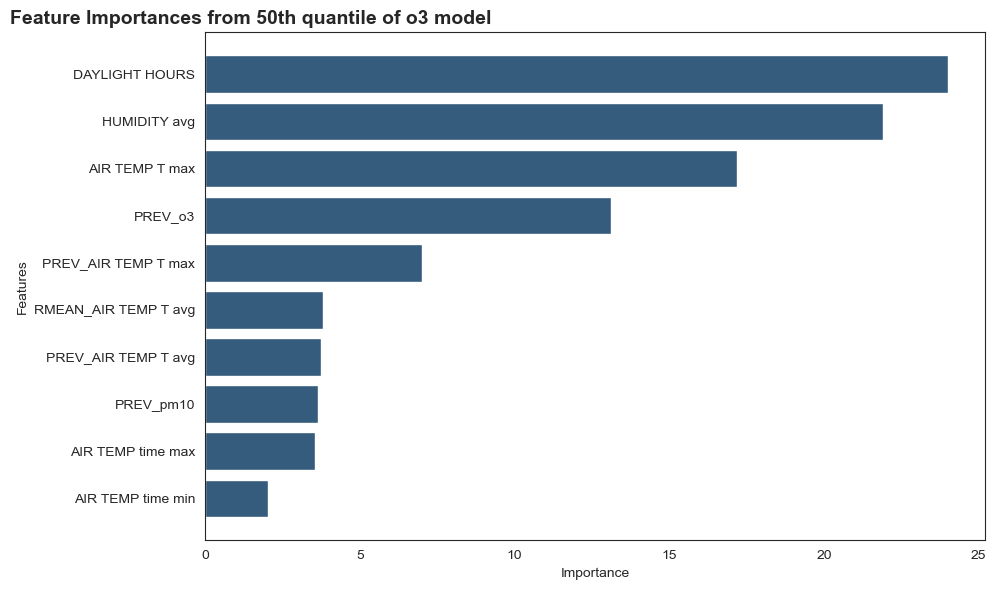

In [58]:
feature_importances_o3_50 = model_50_o3.get_feature_importance()
feature_names_o3 = model_50_o3.feature_names_

# Create a DataFrame for easier plotting
importance_50_o3 = pd.DataFrame({
    'Feature': feature_names_o3,
    'Importance': feature_importances_o3_50
}).sort_values(by='Importance', ascending=True)

plt.figure(figsize=(10, 6))
plt.barh(importance_50_o3['Feature'], importance_50_o3['Importance'], color='#355C7D')

plt.ylabel('Features')
plt.xlabel('Importance')
plt.title('Feature Importances from 50th quantile of o3 model', loc="left",
    fontsize=14,
    fontweight="bold",
    x=-0.25
         )
plt.tight_layout()
plt.show()

In [59]:
explainer_o3 = sh.TreeExplainer(model_50_o3)
shap_values_o3 = explainer_o3(data_o3)

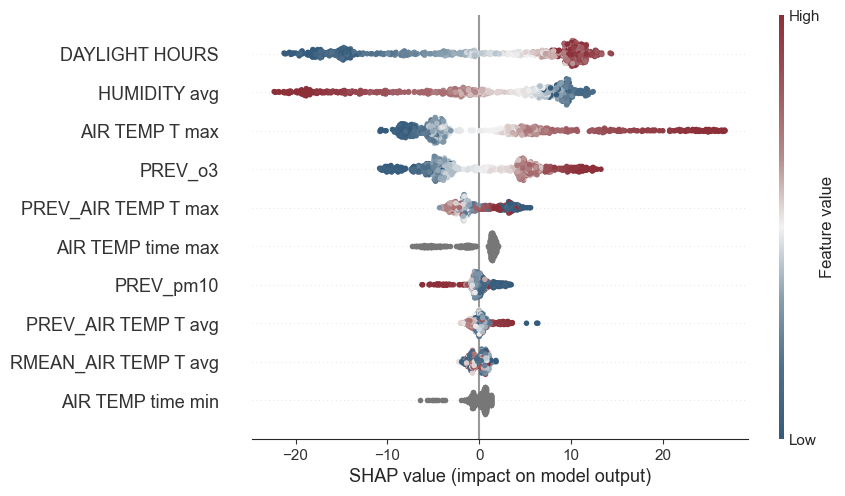

In [60]:
sh.plots.beeswarm(shap_values_o3, max_display=data_o3.shape[1], color = hcmap)

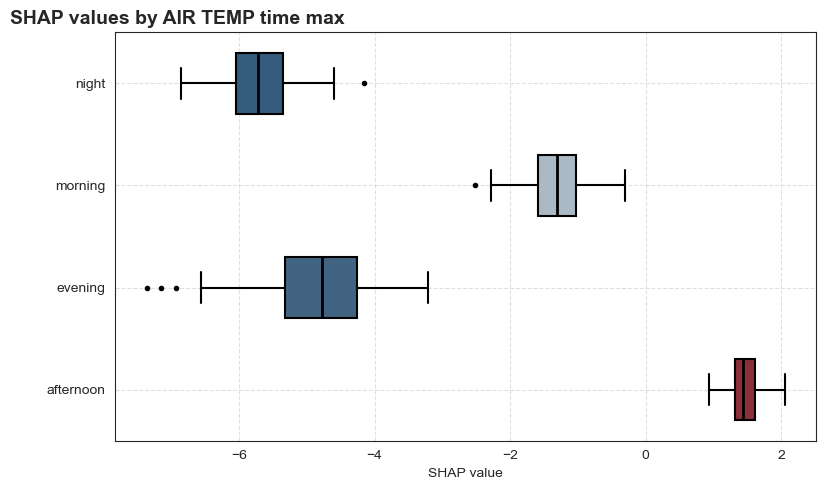

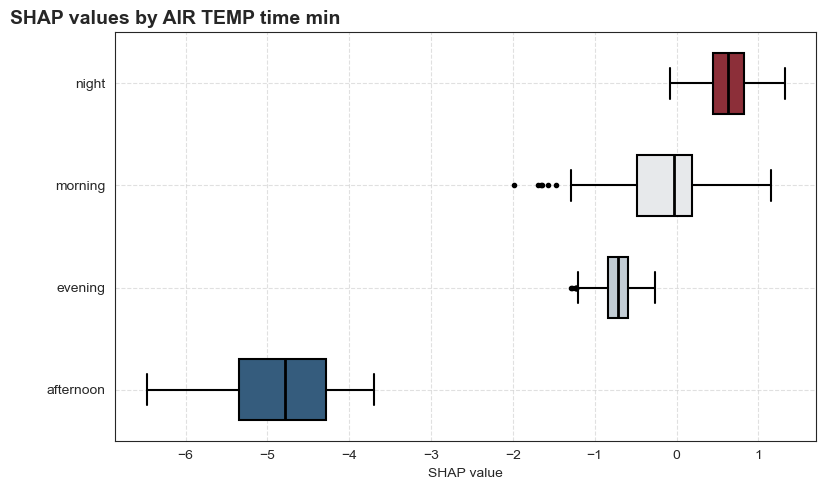

In [61]:
plot_shap_boxplot_colored(data_o3, shap_values_o3, 'AIR TEMP time max', cmap = hcmap)

plot_shap_boxplot_colored(data_o3, shap_values_o3, 'AIR TEMP time min', cmap = hcmap)

In [62]:
interaction_values_o3 = explainer_o3.shap_interaction_values(data_o3)

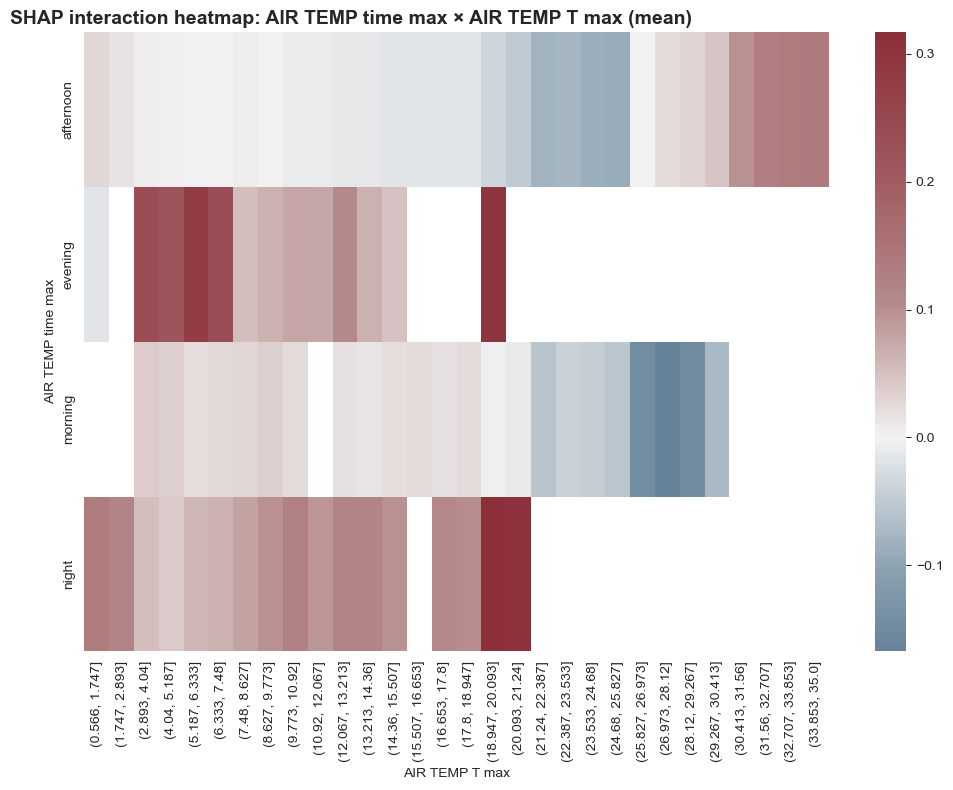

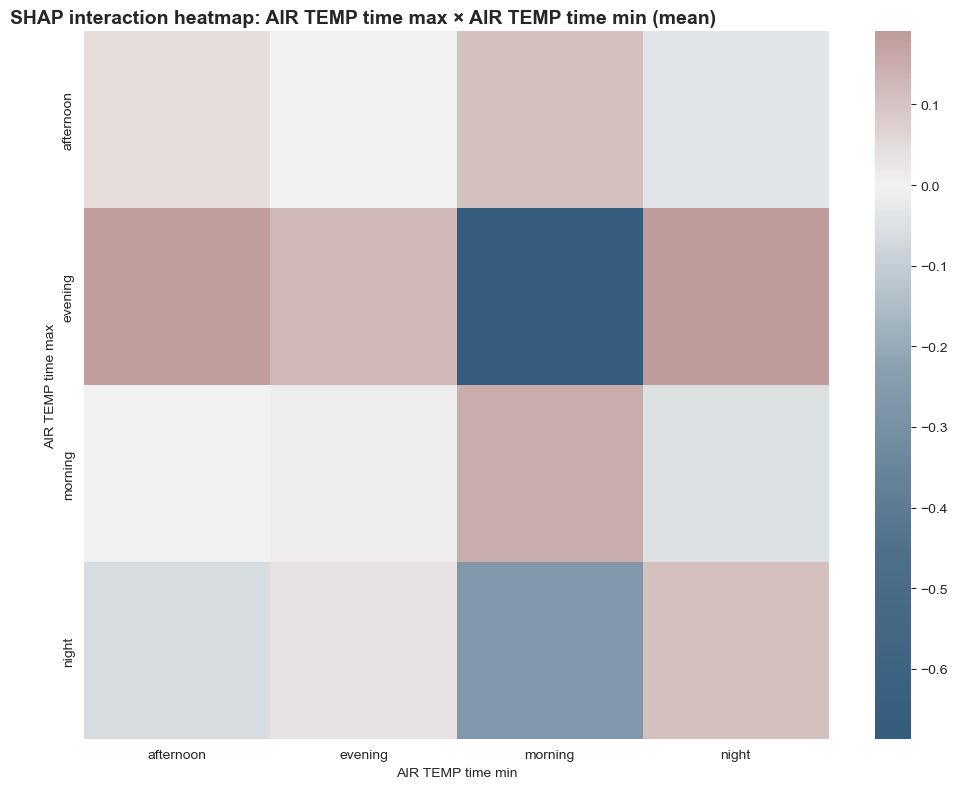

In [63]:
plot_shap_interaction_heatmap(interaction_values_o3, data_o3, 'AIR TEMP time max', 'AIR TEMP T max')

plot_shap_interaction_heatmap(interaction_values_o3, data_o3, 'AIR TEMP time max', 'AIR TEMP time min')

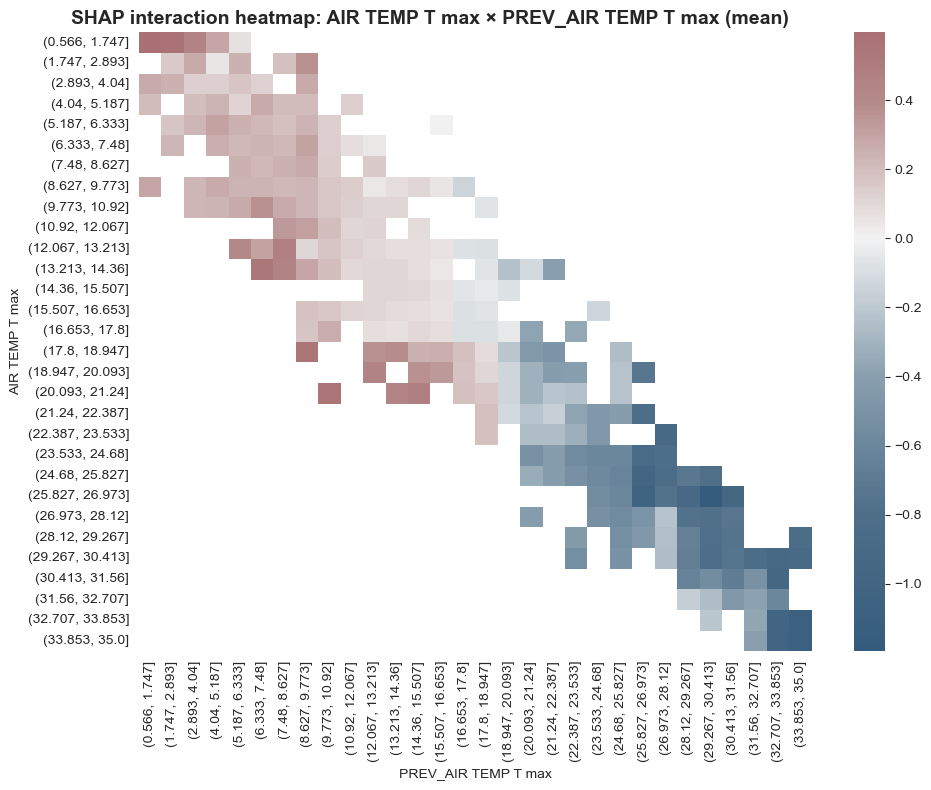

In [64]:
plot_shap_interaction_heatmap(interaction_values_o3, data_o3, 'AIR TEMP T max', 'PREV_AIR TEMP T max')

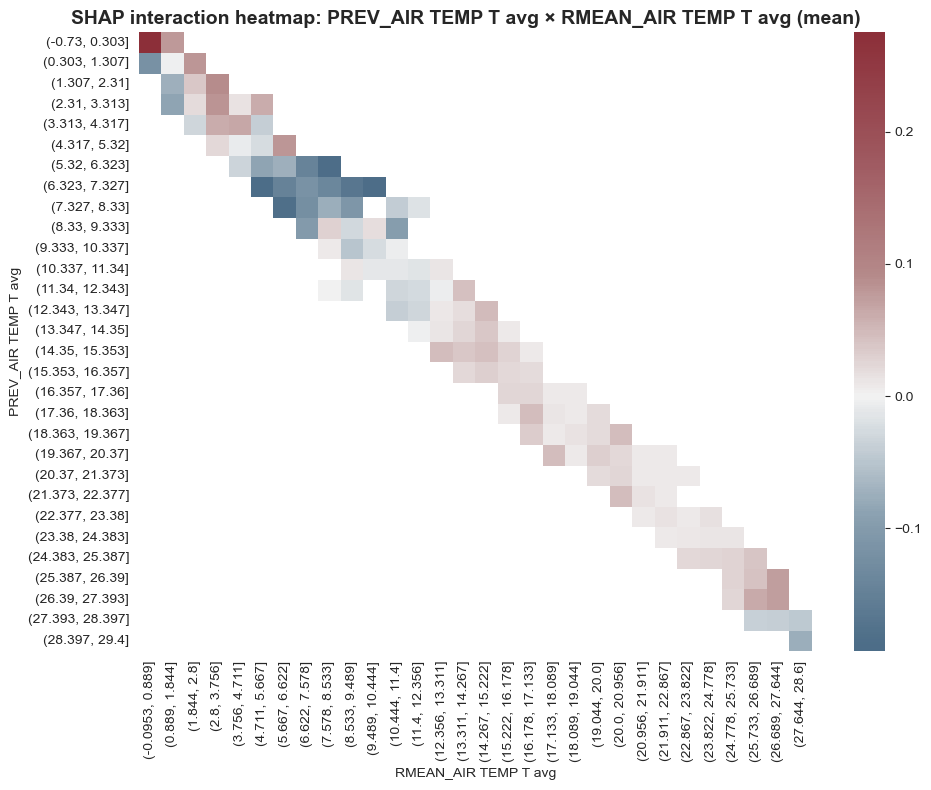

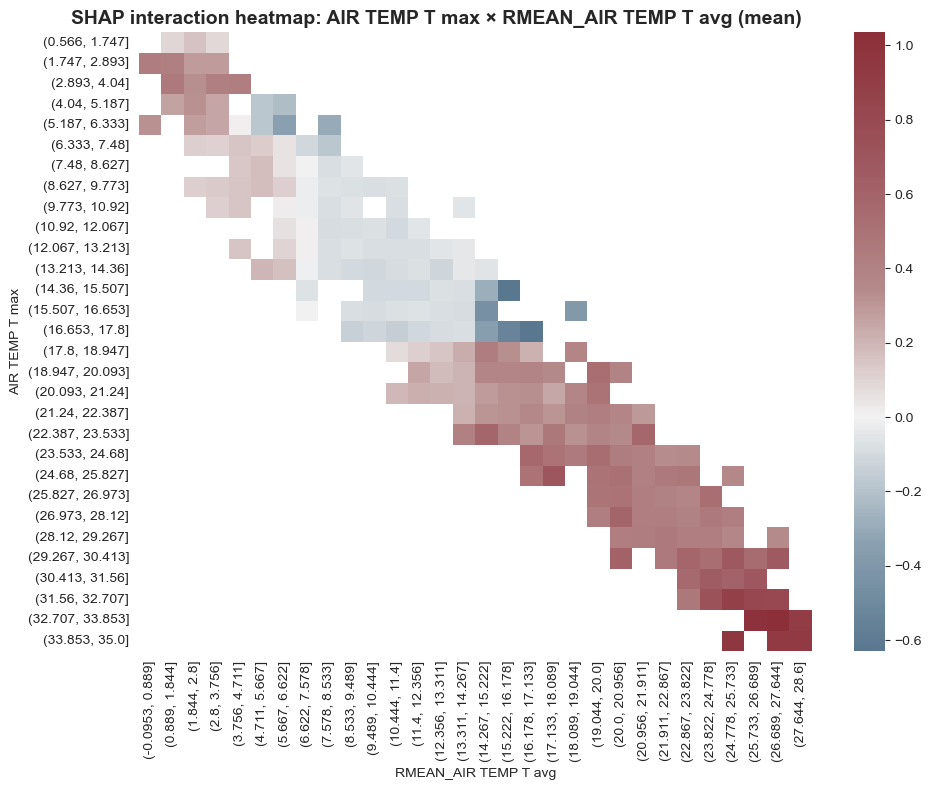

In [65]:
plot_shap_interaction_heatmap(interaction_values_o3, data_o3, 'PREV_AIR TEMP T avg', 'RMEAN_AIR TEMP T avg')

plot_shap_interaction_heatmap(interaction_values_o3, data_o3, 'AIR TEMP T max', 'RMEAN_AIR TEMP T avg')

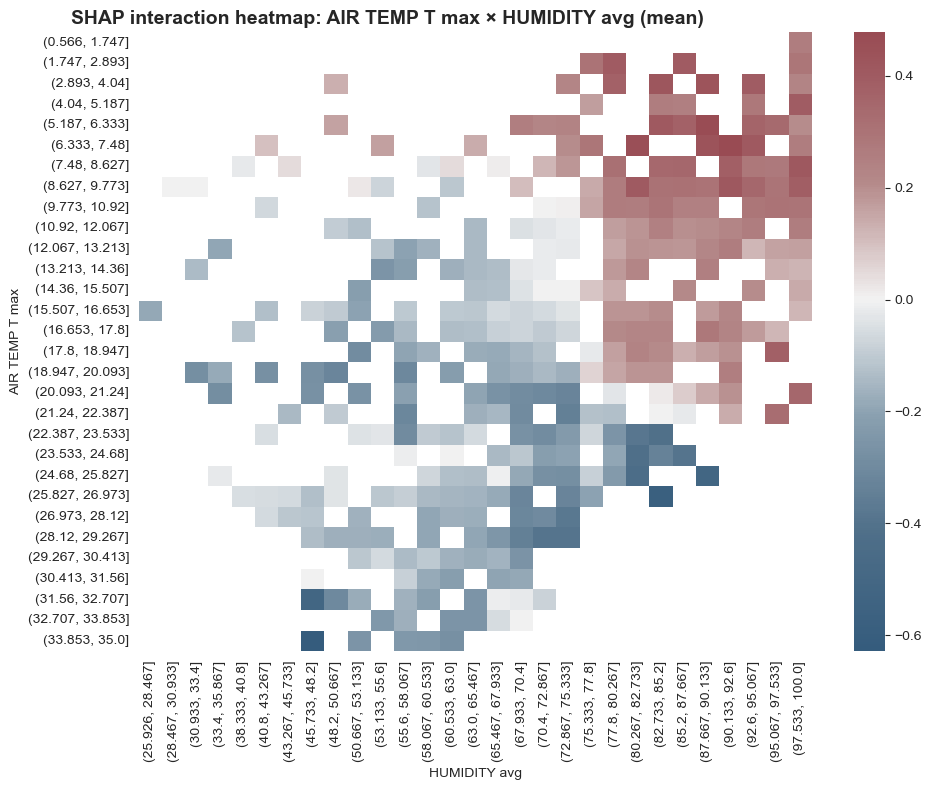

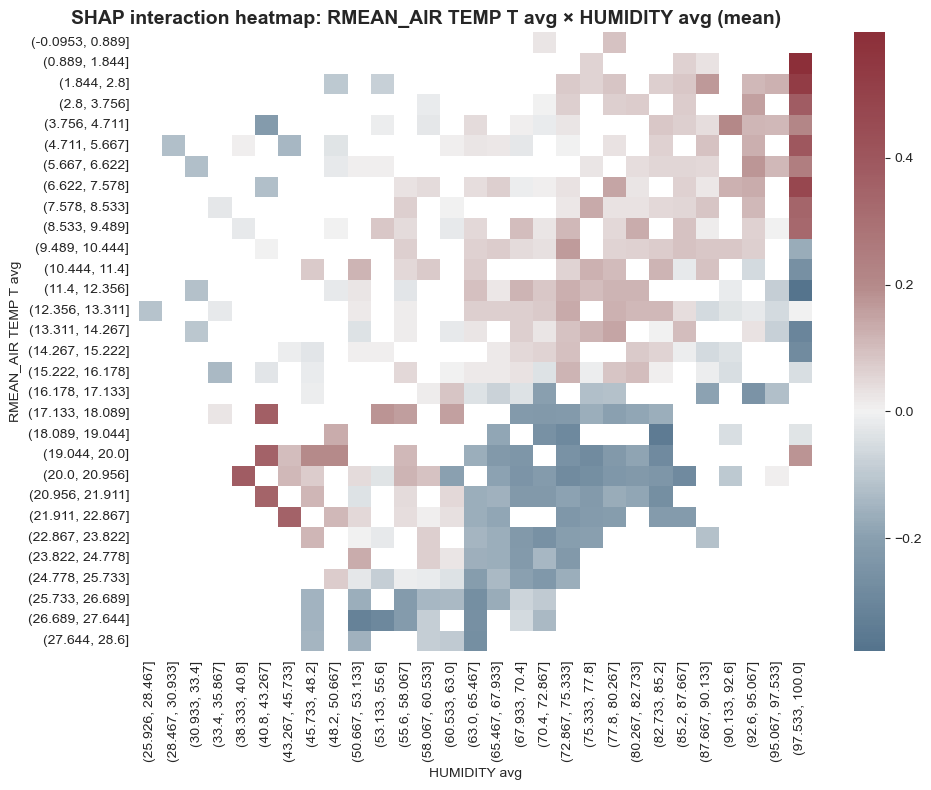

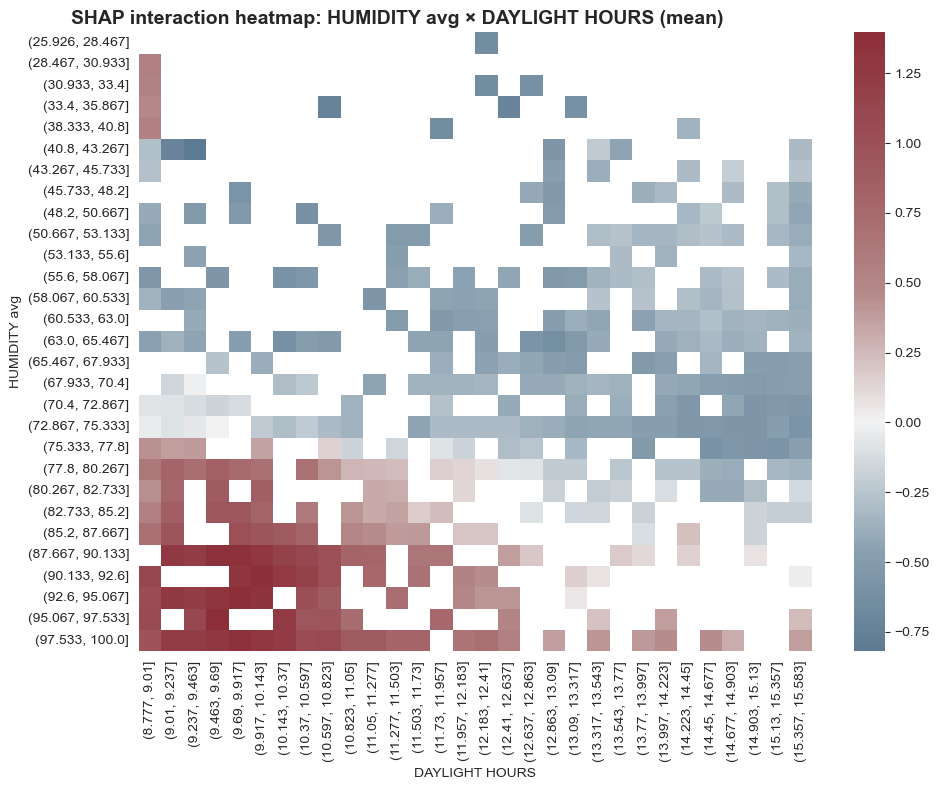

In [66]:
plot_shap_interaction_heatmap(interaction_values_o3, data_o3, 'AIR TEMP T max', 'HUMIDITY avg')

plot_shap_interaction_heatmap(interaction_values_o3, data_o3, 'RMEAN_AIR TEMP T avg', 'HUMIDITY avg')

plot_shap_interaction_heatmap(interaction_values_o3, data_o3, 'HUMIDITY avg', 'DAYLIGHT HOURS')

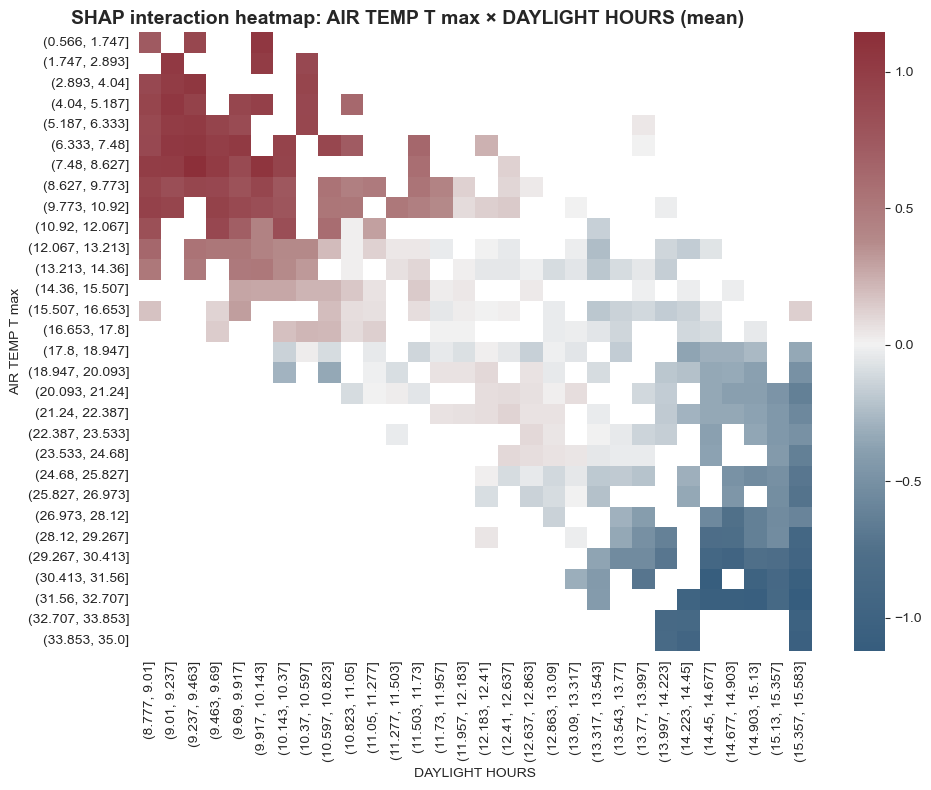

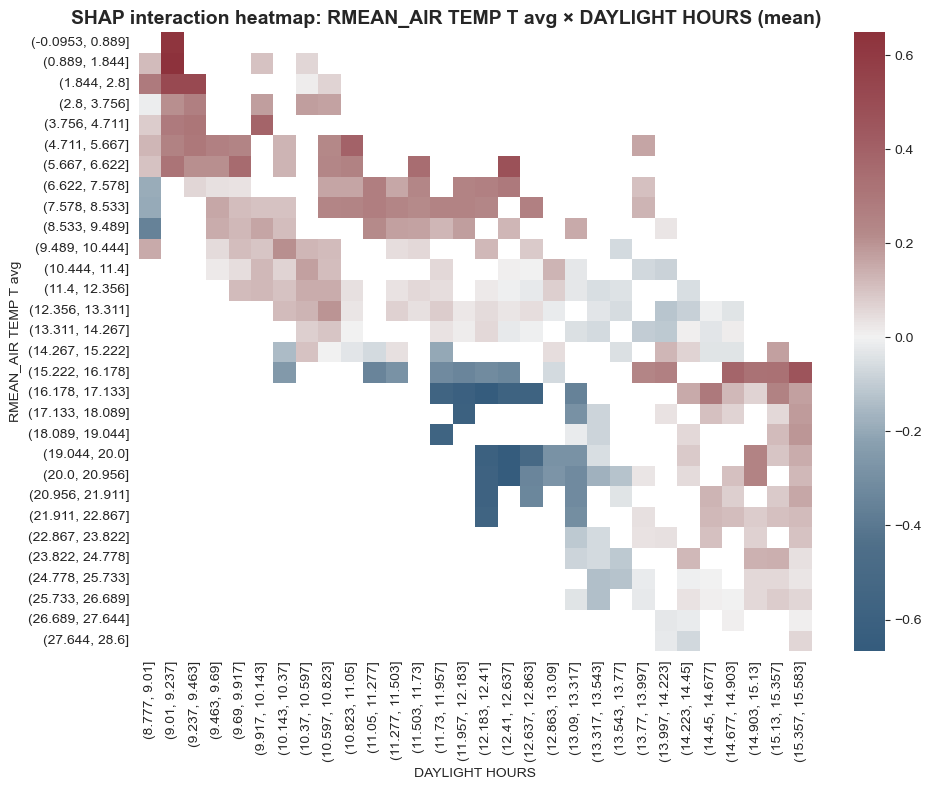

In [67]:
plot_shap_interaction_heatmap(interaction_values_o3, data_o3, 'AIR TEMP T max', 'DAYLIGHT HOURS')

plot_shap_interaction_heatmap(interaction_values_o3, data_o3, 'RMEAN_AIR TEMP T avg', 'DAYLIGHT HOURS')

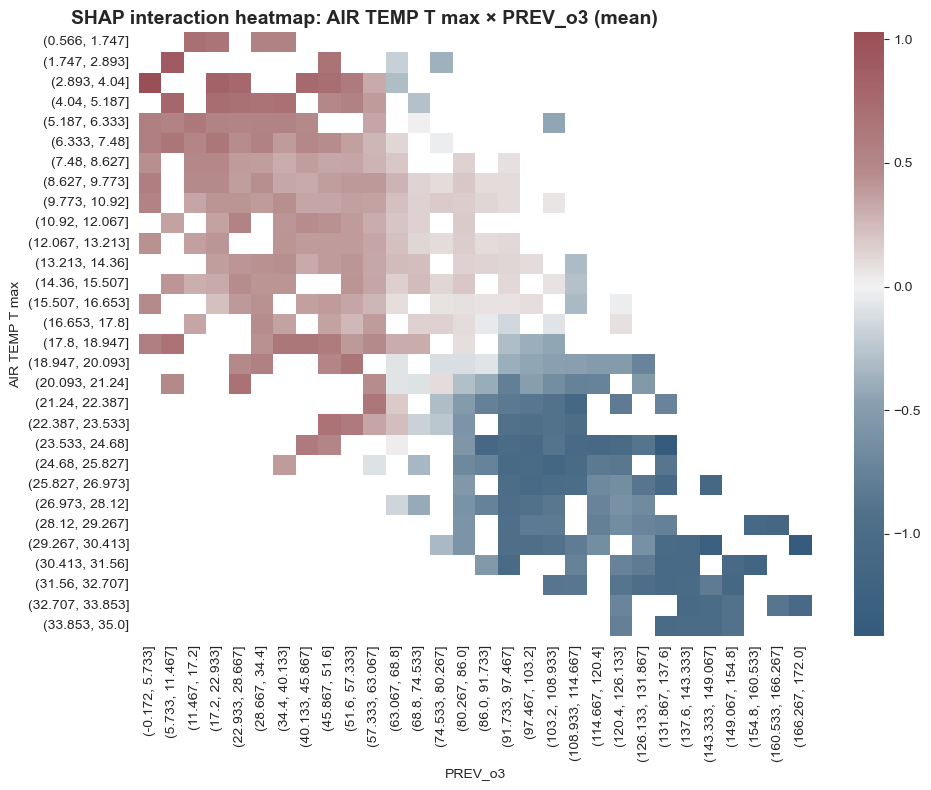

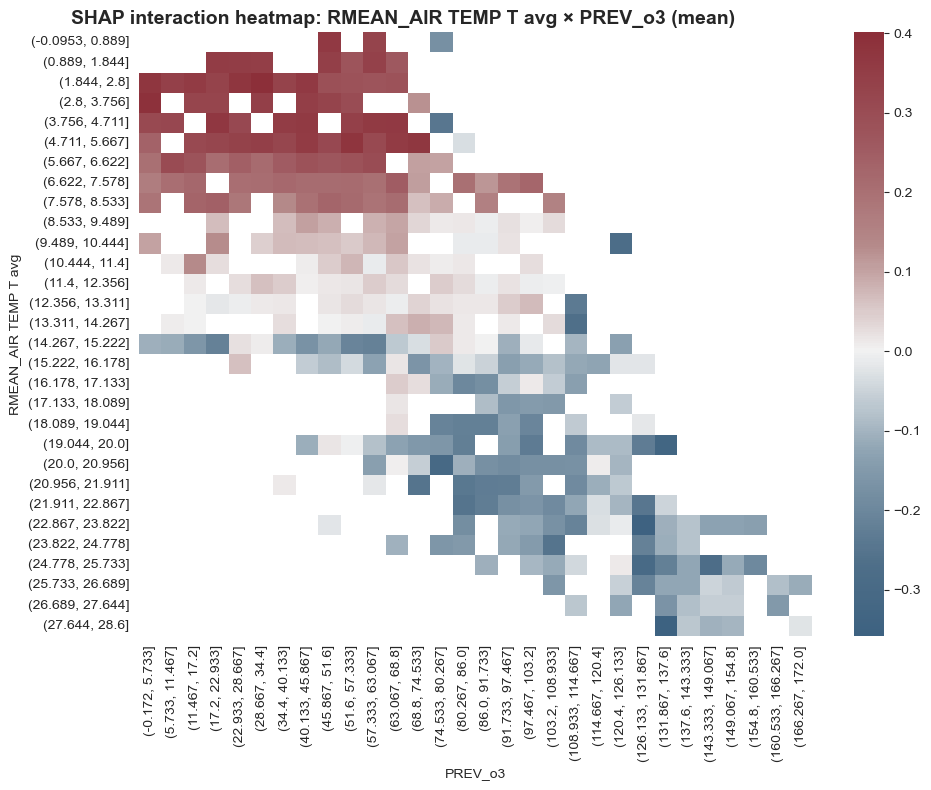

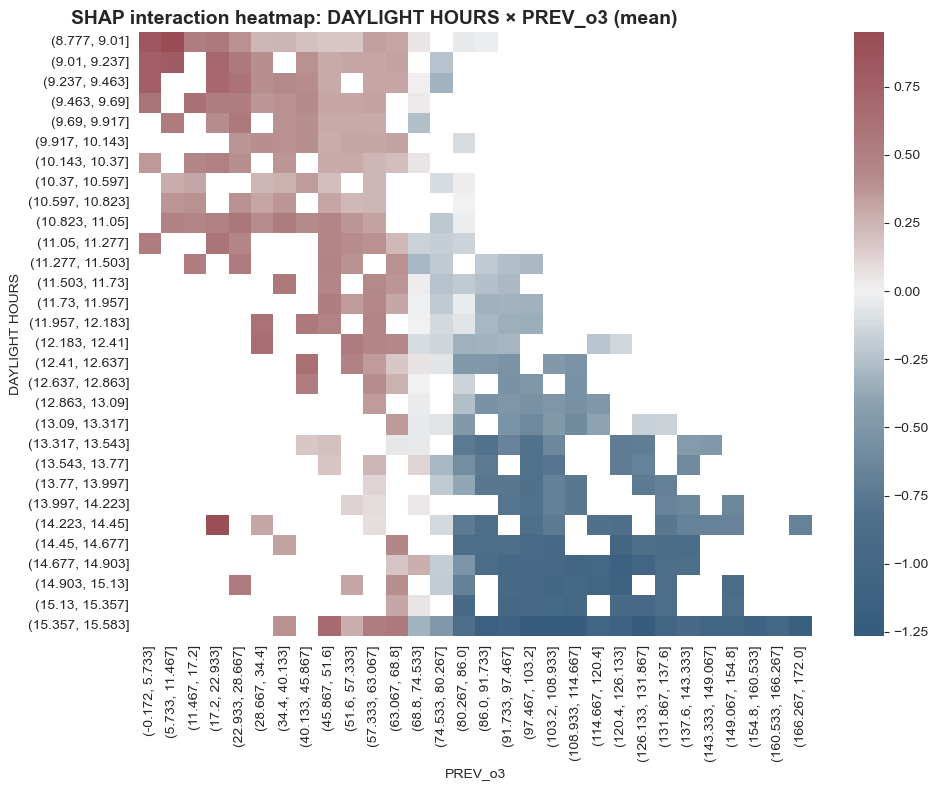

In [68]:
plot_shap_interaction_heatmap(interaction_values_o3, data_o3, 'AIR TEMP T max', 'PREV_o3')

plot_shap_interaction_heatmap(interaction_values_o3, data_o3, 'RMEAN_AIR TEMP T avg', 'PREV_o3')

plot_shap_interaction_heatmap(interaction_values_o3, data_o3, 'DAYLIGHT HOURS', 'PREV_o3')

#### 📊 O₃ Model Interpretation – Median (50th Percentile)
1️⃣ **Main Drivers of O₃ (Feature Importance)**

The median O₃ model is clearly dominated by:

- DAYLIGHT HOURS (strongest driver)
- HUMIDITY avg
- AIR TEMP T max
- PREV_o3
- All remaining variables play a secondary, refinement-level role.

This ranking already suggests a physically coherent structure:
Ozone levels are primarily governed by **photochemical potential (daylight)**, **thermal conditions (maximum temperature)**, **atmospheric moisture**, and **persistence from the previous day**.

2️⃣ **Direction of Effects (SHAP Summary)**

The SHAP beeswarm confirms strong and consistent relationships:

**DAYLIGHT HOURS**
- Higher values → strong positive SHAP impact → higher predicted O₃
- Lower values → negative impact
→ *The model captures seasonal/irradiance-driven ozone production.*

**HUMIDITY avg**
- High humidity → negative SHAP values
- Low humidity → positive SHAP values
→ *Dry conditions favor higher ozone concentrations.*

**AIR TEMP T max**
- Higher Tmax → positive contribution
- Lower Tmax → negative contribution
→ *Thermal enhancement of photochemical reactions is clearly learned.*

**PREV_o3**
- High previous-day ozone → positive contribution
→ *Strong persistence component in the system.*

The main effects are mostly monotonic and physically consistent.

3️⃣ **Diurnal Timing Effects**

- The categorical features describing when Tmin and Tmax occur add regime-level information.
- Tmax in the afternoon → positive impact
- Tmax in evening/night → strongly negative impact
→ *The model interprets non-standard thermal cycles as unfavorable for ozone formation.*

- Tmin occurring in the afternoon → strongly negative impact
- Tmin at night → slightly positive impact

*These effects suggest the model is detecting atmospheric stability patterns and daily thermal structure consistency.*

4️⃣ **Interaction Effects (SHAP Heatmaps)**

The interaction maps reveal regime-dependent dynamics:

**Daylight × Tmax**
The impact of temperature changes significantly depending on irradiance.
→ Warm days with long daylight produce stronger ozone responses.

**Daylight × Humidity**
Humidity suppresses ozone more strongly under high irradiance conditions.

**Tmax × PREV_o3**
When previous-day ozone is already high, the marginal effect of temperature changes.
→ Evidence of persistence-modulated amplification.

**Current vs Previous Temperature**
The model distinguishes stable warm periods from abrupt changes, suggesting it captures continuity vs regime shifts.

Overall, the interactions indicate **the model is not purely additive**:
**it captures conditional photochemical behavior.**

🎯 **Key points**

The median O₃ model is:

- Physically coherent
- Strongly seasonally driven
- Thermally sensitive
- Persistence-aware
- Regime-dependent through interactions

It successfully captures the core mechanisms of ozone formation: **solar radiation, temperature, atmospheric dryness, and temporal continuity.**

Compared to the PM2.5 model, **this O₃ model appears even more structurally aligned with known atmospheric chemistry**, with clearer monotonic effects and strong interaction structure.

*In summary, it represents a robust and interpretable probabilistic model of median ozone behavior, with a well-defined seasonal–photochemical backbone and meaningful regime modulation.*

## 25th Percentile

### Base

In [69]:
quantile = 0.25
base_model_25 = CatBoostRegressor(loss_function=f'Quantile:alpha={quantile}',
                              cat_features=cat_cols_o3,
                              eval_metric=f'Quantile:alpha={quantile}',
                              random_state = 0, verbose=0).fit(x_train_o3, y_train_o3,
                                                               eval_set=[(x_train_o3, y_train_o3)], verbose = 0)

print('Evaluation of the base model')
base_train_25 = mean_pinball_loss(y_train_o3,base_model_25.predict(x_train_o3), alpha = 0.25)
base_test_25 = mean_pinball_loss(y_test_o3,base_model_25.predict(x_test_o3), alpha = 0.25)
base_tot_25 = mean_pinball_loss(o3_vals,base_model_25.predict(data_o3), alpha = 0.25)

print('Training set:',base_train_25)
print('Improvement on training set',round(((baseline_25[0]-base_train_25)/baseline_25[0])*100,2),'%')
print('Test set:',base_test_25)
print('Improvement on test set',round(((baseline_25[1]-base_test_25)/baseline_25[1])*100,2),'%')
print('Full set:',base_tot_25)
print('Improvement on training set',round(((baseline_25[2]-base_tot_25)/baseline_25[2])*100,2),'%')

Evaluation of the base model
Training set: 3.073851593991732
Improvement on training set 55.73 %
Test set: 6.555054760380042
Improvement on test set 29.86 %
Full set: 4.1223445357971125
Improvement on training set 46.26 %


### Fine Tuned

In [70]:
quantile = 0.25
model_25_o3 = CatBoostRegressor(loss_function=f'Quantile:alpha={quantile}',
                              cat_features=cat_cols_o3,
                              eval_metric=f'Quantile:alpha={quantile}',
                             n_estimators = 560,
                             depth = 3,
                             random_state = 0, verbose=0).fit(x_train_o3, y_train_o3,
                                                               eval_set=[(x_train_o3, y_train_o3)], verbose = 0)

print('Evaluation of the tuned model')
tuned_train_25 = mean_pinball_loss(y_train_o3,model_25_o3.predict(x_train_o3), alpha = 0.25)
tuned_test_25 = mean_pinball_loss(y_test_o3,model_25_o3.predict(x_test_o3), alpha = 0.25)
tuned_tot_25 = mean_pinball_loss(o3_vals,model_25_o3.predict(data_o3), alpha = 0.25)

print('Training set:',tuned_train_25)
print('Improvement on training set',round(((baseline_25[0]-tuned_train_25)/baseline_25[0])*100,2),'%')
print('Test set:',tuned_test_25)
print('Improvement on test set',round(((baseline_25[1]-tuned_test_25)/baseline_25[1])*100,2),'%')
print('Full set:',tuned_tot_25)
print('Improvement on full set',round(((baseline_25[2]-tuned_tot_25)/baseline_25[2])*100,2),'%')

Evaluation of the tuned model
Training set: 4.321228818675638
Improvement on training set 37.76 %
Test set: 6.056942454612873
Improvement on test set 35.19 %
Full set: 4.84400310368344
Improvement on full set 36.85 %


## 75th Percentile

### Base

In [71]:
quantile = 0.75
base_model_75 = CatBoostRegressor(loss_function=f'Quantile:alpha={quantile}',
                              cat_features=cat_cols_o3,
                              eval_metric=f'Quantile:alpha={quantile}',
                              random_state = 0, verbose=0).fit(x_train_o3, y_train_o3,
                                                               eval_set=[(x_train_o3, y_train_o3)], verbose = 0)

print('Evaluation of the base model')
base_train_75 = mean_pinball_loss(y_train_o3,base_model_75.predict(x_train_o3), alpha = 0.75)
base_test_75 = mean_pinball_loss(y_test_o3,base_model_75.predict(x_test_o3), alpha = 0.75)
base_tot_75 = mean_pinball_loss(o3_vals,base_model_75.predict(data_o3), alpha = 0.75)

print('Training set:',base_train_75)
print('Improvement on training set',round(((baseline_75[0]-base_train_75)/baseline_75[0])*100,2),'%')
print('Test set:',base_test_75)
print('Improvement on test set',round(((baseline_75[1]-base_test_75)/baseline_75[1])*100,2),'%')
print('Full set:',base_tot_75)
print('Improvement on training set',round(((baseline_75[2]-base_tot_75)/baseline_75[2])*100,2),'%')

Evaluation of the base model
Training set: 2.7730613175067784
Improvement on training set 56.68 %
Test set: 5.982288307654919
Improvement on test set 38.39 %
Full set: 3.7396385860528802
Improvement on training set 49.17 %


### Fine-Tuned

In [72]:
quantile = 0.75
model_75_o3 = CatBoostRegressor(loss_function=f'Quantile:alpha={quantile}',
                              cat_features=cat_cols_o3,
                              eval_metric=f'Quantile:alpha={quantile}',
                             n_estimators = 640,
                             depth = 3,
                              random_state = 0, verbose=0).fit(x_train_o3, y_train_o3,
                                                               eval_set=[(x_train_o3, y_train_o3)], verbose = 0)

print('Evaluation of the tuned model')
tuned_train_75 = mean_pinball_loss(y_train_o3,model_75_o3.predict(x_train_o3), alpha = 0.75)
tuned_test_75 = mean_pinball_loss(y_test_o3,model_75_o3.predict(x_test_o3), alpha = 0.75)
tuned_tot_75 = mean_pinball_loss(o3_vals,model_75_o3.predict(data_o3), alpha = 0.75)

print('Training set:',tuned_train_75)
print('Improvement on training set',round(((baseline_75[0]-tuned_train_75)/baseline_75[0])*100,2),'%')
print('Test set:',tuned_test_75)
print('Improvement on test set',round(((baseline_75[1]-tuned_test_75)/baseline_75[1])*100,2),'%')
print('Full set:',tuned_tot_75)
print('Improvement on full set',round(((baseline_75[2]-tuned_tot_75)/baseline_75[2])*100,2),'%')

Evaluation of the tuned model
Training set: 3.9417676702527564
Improvement on training set 38.42 %
Test set: 5.293435326199769
Improvement on test set 45.48 %
Full set: 4.348872320337687
Improvement on full set 40.88 %


## Results - O3

In [73]:
data_o3_full = data_full.copy()


data_o3_full['Quartile1'] = model_25_o3.predict(data_o3)
data_o3_full['Median'] = model_50_o3.predict(data_o3)
data_o3_full['Quartile3'] = model_75_o3.predict(data_o3)

data_o3_full['Quartile1'] = data_o3_full['Quartile1'].apply(lambda z: 0 if z < 0 else z)
data_o3_full['Median'] = data_o3_full.apply(lambda row: correction_function(row['Quartile1'],row['Median']), axis = 1)
data_o3_full['Quartile3'] = data_o3_full.apply(lambda row: correction_function(row['Median'],row['Quartile3']), axis = 1)

data_o3_full['IQR'] = data_o3_full['Quartile3'] - data_o3_full['Quartile1']

data_o3_full['LowLimit'] = data_o3_full['Quartile1'] - (data_o3_full['IQR'] * 1.5)

data_o3_full['LowLimit'] = data_o3_full['LowLimit'].apply(lambda z: 0 if z < 0 else z)

data_o3_full['HighLimit'] = data_o3_full['Quartile3'] + (data_o3_full['IQR'] * 1.5)

data_o3_full['o3'] = o3_vals

In [74]:
o3_levels = {
    "Good (0-60)": 0,
    "Fair (61-100)": 61,
    "Moderate (101-120)": 101,
    "Poor (121-160)": 121,
    "Very Poor (161-180)": 161,
    "Extremely Poor (>180)": 181
}

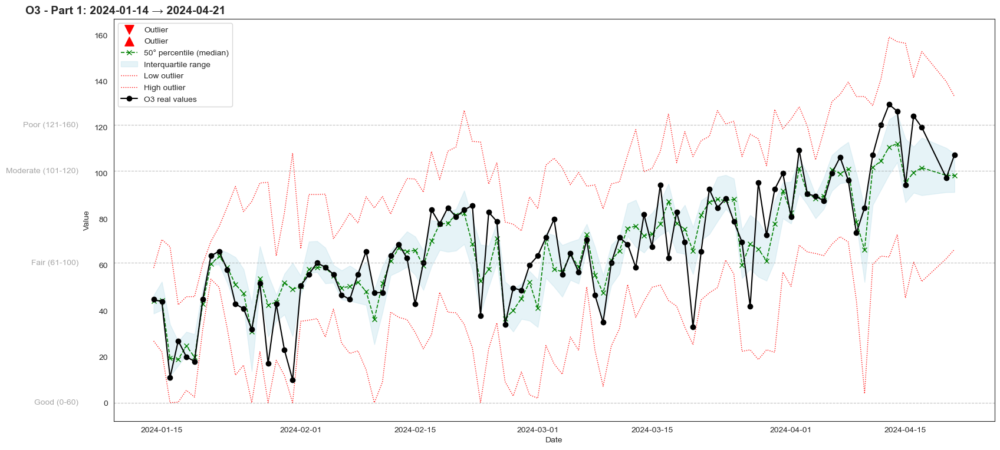

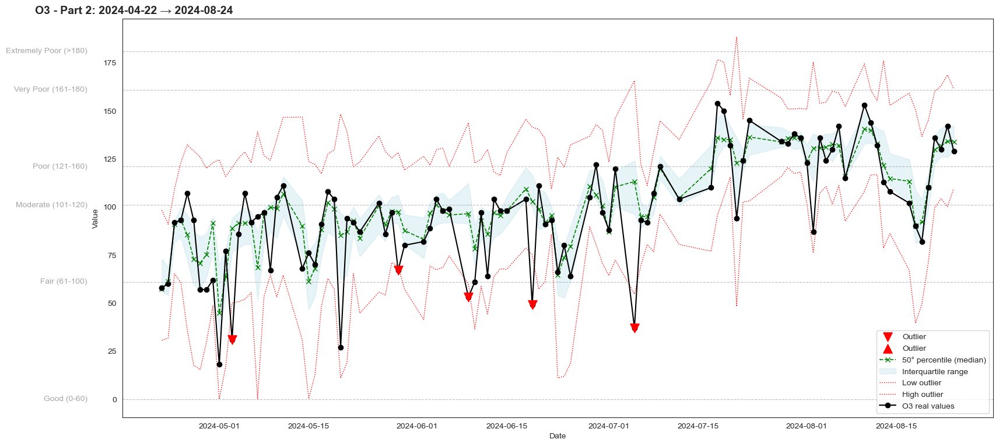

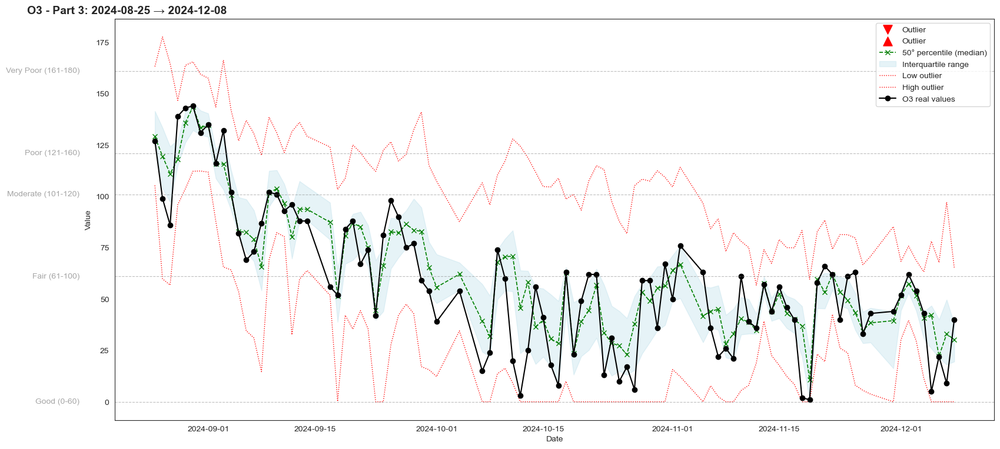

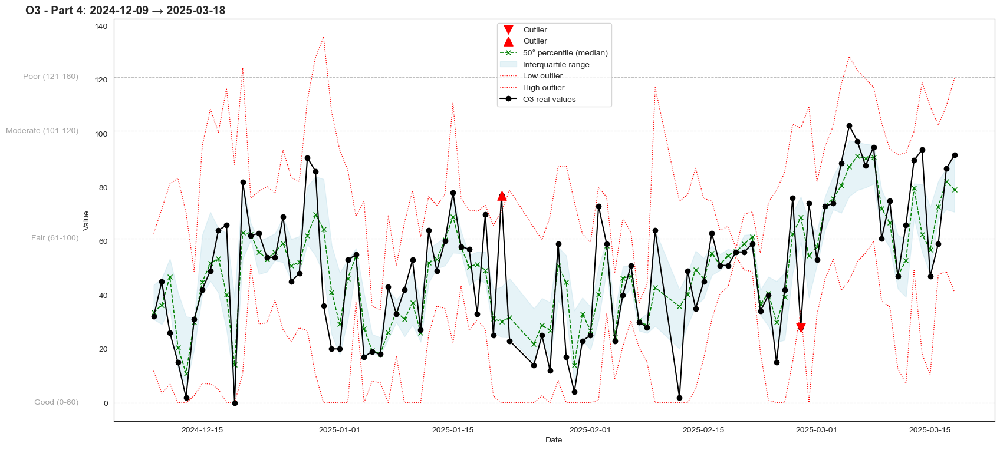

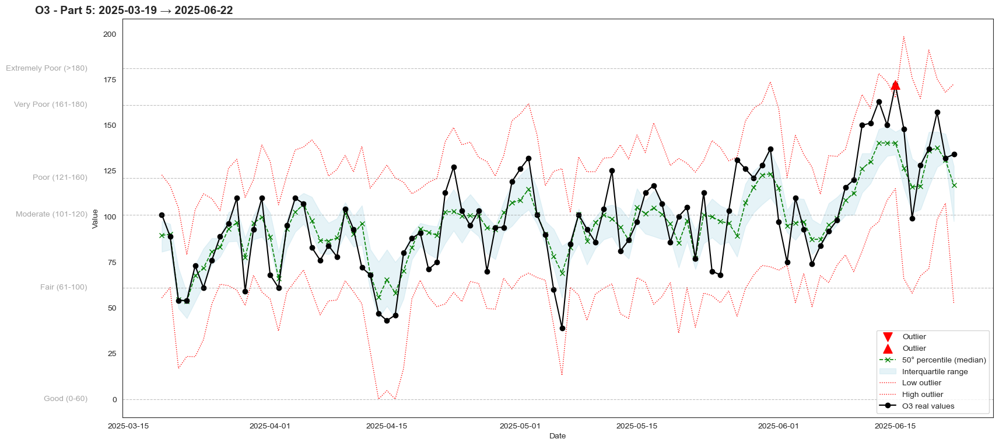

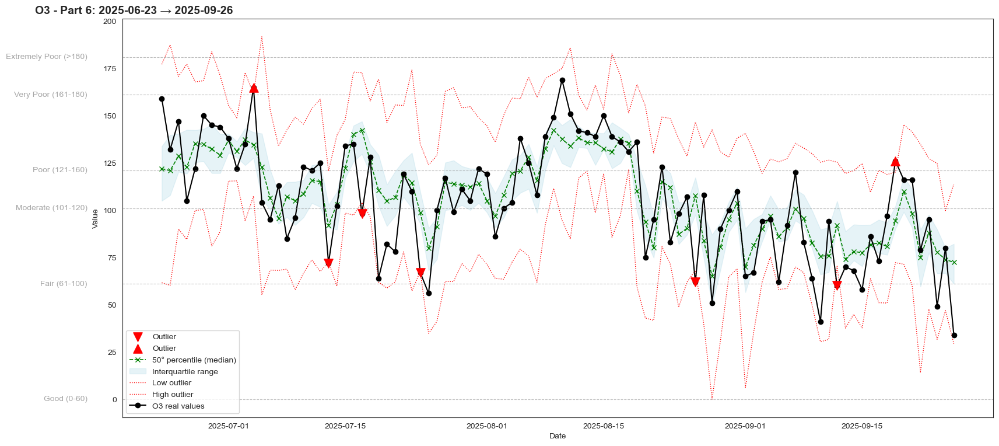

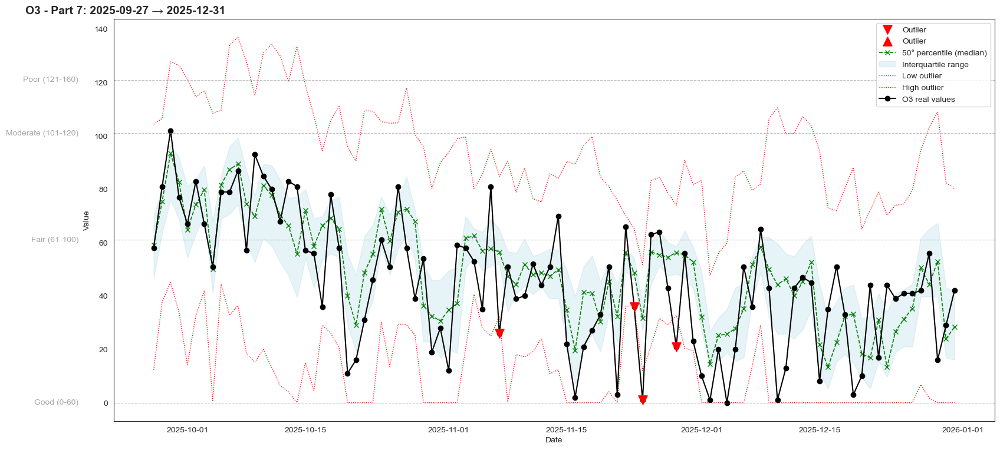

In [75]:
# Split the dataframe into approximately equal parts
data_chunks = np.array_split(data_o3_full, 7)

for i, chunk in enumerate(data_chunks, start=1):
    plt.figure(figsize=(16, 8))

    # Start and end dates of the chunk
    start_date = chunk.index.min().strftime('%Y-%m-%d')
    end_date = chunk.index.max().strftime('%Y-%m-%d')

    # Outliers
    low_outliers = (chunk['o3'] < chunk['LowLimit'])
    plt.scatter(chunk.index[low_outliers], chunk['o3'][low_outliers], color='red', label='Outlier', zorder=5,
               marker = 'v', s=120)

    high_outliers = (chunk['o3'] > chunk['HighLimit'])
    plt.scatter(chunk.index[high_outliers], chunk['o3'][high_outliers], color='red', label='Outlier', zorder=5,
               marker = '^', s=120)

    # Quantiles and IQR interval
    plt.plot(chunk.index, chunk['Median'], label='50° percentile (median)', linestyle='--', color='green', linewidth=1.2,
             marker='x')
    plt.fill_between(chunk.index, chunk['Quartile1'], chunk['Quartile3'],
                     color='lightblue', alpha=0.3, label='Interquartile range')

    # Outlier limits
    plt.plot(chunk.index, chunk['LowLimit'], label='Low outlier', linestyle=':', color='red', linewidth=1)
    plt.plot(chunk.index, chunk['HighLimit'], label='High outlier', linestyle=':', color='red', linewidth=1)

    # Actual values
    plt.plot(chunk.index, chunk['o3'], label='O3 real values', color='black', marker='o')

    # Dynamic title with dates
    plt.title(f'O3 - Part {i}: {start_date} → {end_date}', loc="left",
        fontsize=14,
        fontweight="bold",
        x=-0.1
    )
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.tight_layout(pad=2)

    ax = plt.gca()

    max_val = max(chunk['o3'].max(),chunk['HighLimit'].max())

    for label, value in o3_levels.items():
        if value <= max_val:
            ax.axhline(y=value, color='gray', linestyle='--', linewidth=0.8, alpha=0.5)
            ax.text(-0.04, value, label, color='gray', fontsize=10, alpha=0.7,
                    va='center', ha='right', transform=ax.get_yaxis_transform())

    plt.show()

#### 📈 O₃ Temporal Predictions

1️⃣ 2️⃣ **Prediction Performance**

Across the seven temporal blocks:

🟢 *Seasonal Structure*

The predicted median correctly reproduces:

- Spring increase
- Summer plateau
- Autumn decline
- Winter minimum

No structural drift is visible across years.

🔵 *Interquartile Range (Uncertainty Band)*

The uncertainty band behaves coherently:

- Narrower during stable winter regimes
- Wider during spring transitions
- Wider during unstable summer peaks

This reflects realistic atmospheric variability: **photochemical regimes amplify uncertainty**.

🔴 *Extreme Events*

High outliers concentrate in summer, low anomalies in winter.
The upper quantile model (Q3) generally envelopes extreme spikes without systematic underestimation.

This indicates:

- Good upper-tail calibration
- Robust extreme-event handling
- No persistent bias

3️⃣ **Regime Comparison**

The three quantile models describe distinct ozone regimes:

- Q1 (Lower Quartile) captures baseline atmospheric conditions.
    It performs best in low-ozone scenarios and stable winter regimes.
    Nonlinear effects are weaker and interactions are smoother.

- Q2 (Median) represents the structural seasonal backbone.
    It balances photochemistry, persistence, and meteorology.
    It offers the most stable overall description of typical ozone behavior.

- Q3 (Upper Quartile) models high-impact regimes.
    It responds strongly to irradiance and temperature interactions.
    It captures heat-wave amplification and tail risk dynamics.

In essence:

- Q1 describes stability.
- Q2 describes structure.
- Q3 describes amplification.

Together, they reconstruct the full ozone distribution across atmospheric states.

4️⃣ **Model Quality Assessment**
**Strengths**

- Physically consistent across seasons
- Clear regime separation
- Good persistence modeling
- Well-calibrated uncertainty bands
- Strong extreme-event representation

No evident systematic seasonal bias or collapse in transitional periods.

5️⃣ **Overall Conclusion**

The system constitutes a probabilistic ozone regime framework.

It captures:

- Background atmospheric states
- Seasonal backbone dynamics
- Extreme photochemical amplification
- Time-varying uncertainty

Most importantly, the upper quantile confirms that **ozone behaves in a nonlinear, irradiance-driven, persistence-amplified way, especially under warm and dry conditions.**

In [76]:
data_o3_full['Day Type'] = day_types.values

In [77]:
data_o3_full['Evaluation o3'] = data_o3_full.apply(lambda row: classify_quartiles(row['LowLimit'],
                                                                         row['Quartile1'],
                                                                        row['Median'],
                                                                        row['Quartile3'],
                                                                        row['HighLimit'],
                                                                        row['o3']), axis = 1)

Description of column Evaluation o3
The column Evaluation o3 has 0 missing values


,Evaluation o3 values,Absolute frequency,Relative frequency (%)
0,low,168,24.93
1,low to medium,164,24.33
2,high,162,24.04
3,medium to high,161,23.89
4,low outlier,15,2.23
5,high outlier,4,0.59


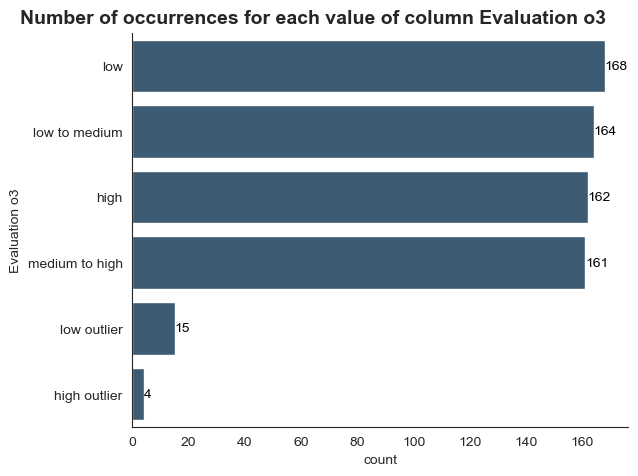

In [78]:
describe_cat_column_h(data_o3_full,'Evaluation o3')

#### 📊 Distribution of O₃ Evaluation Categories

This chart shows the number of occurrences for each category of the Evaluation o3 column.

1️⃣ **Overall Balance of Core Regimes**

The four main categories are remarkably balanced.

This suggests:

- No strong class imbalance
- A well-distributed ozone regime representation
- Good suitability for quantile modeling

From a modeling perspective, this is very positive:
The system has been trained and evaluated across the full ozone spectrum rather than being dominated by a single regime.

2️⃣ **Rare Events (Outliers)**

- Low outliers: 15
- High outliers: 4

Key observations:

- Extreme high ozone events are rare.
- Low anomalies occur slightly more often than extreme highs.
- Outliers represent a small fraction of the dataset.

This has two implications:

- Statistical perspective
    - Extreme high events are underrepresented.
    - Upper-tail modeling (Q3) becomes especially important to avoid underestimation.
- Physical perspective
    - The atmospheric system is more frequently stable or moderate.
    - Extreme ozone spikes are episodic rather than persistent.

3️⃣ **Structural Interpretation**

The distribution confirms what emerged from the quantile models:

- The system spends comparable time in low, transitional, and high regimes.
- True extremes are uncommon.
- Ozone dynamics are continuous rather than binary.

This supports the idea that:

This modeling framework is not forced to extrapolate heavily - it learns from a structurally balanced regime dataset.

4️⃣ **Risk Perspective**

From a risk-oriented air quality viewpoint:

- High and medium-to-high regimes together represent a substantial portion of observations.
- Although extreme high outliers are few, elevated ozone is not rare. This suggests that:
    - Chronic moderate elevation may be more relevant than rare catastrophic peaks.
    - Monitoring upper quantiles remains important even if extreme exceedances are limited.

********************************************* very_humid_overcast_calm *********************************************


,Evaluation o3,Absolute frequency,Relative frequency (%)
0,low outlier,2,2.25
1,low,27,30.34
2,low to medium,22,24.72
3,medium to high,26,29.21
4,high,12,13.48
5,high outlier,0,0.00


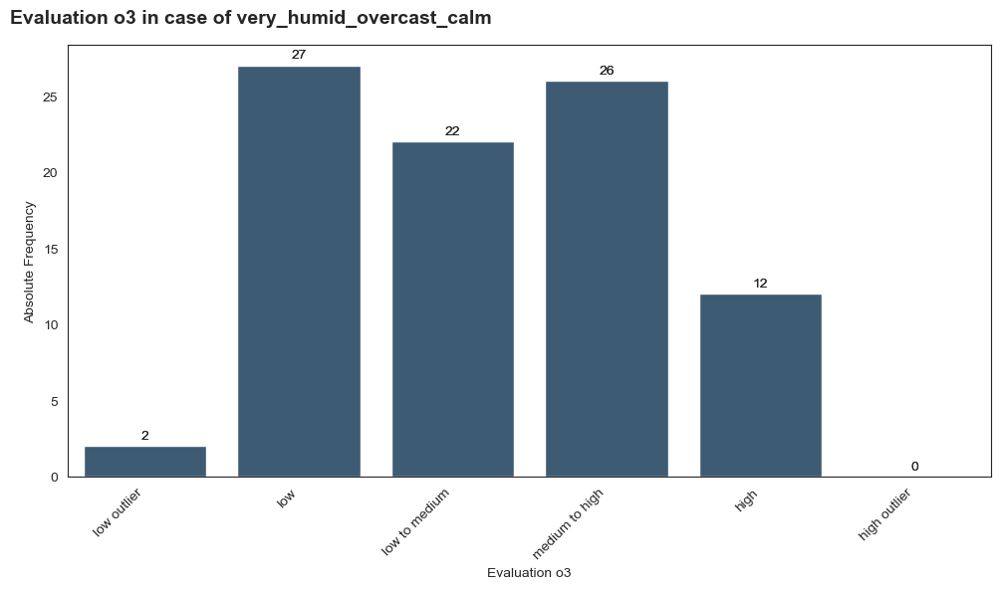

********************************************* very_humid_frequently_rainy *********************************************


,Evaluation o3,Absolute frequency,Relative frequency (%)
0,low outlier,0,0.00
1,low,13,30.23
2,low to medium,10,23.26
3,medium to high,5,11.63
4,high,14,32.56
5,high outlier,1,2.33


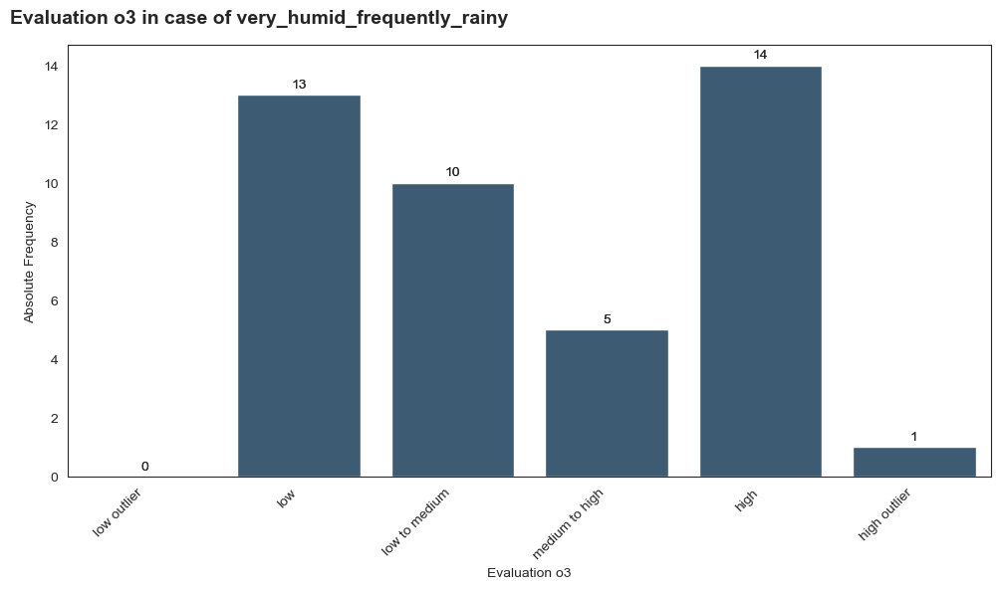

********************************************* overcast_persistent_light_rain *********************************************


,Evaluation o3,Absolute frequency,Relative frequency (%)
0,low outlier,1,2.33
1,low,10,23.26
2,low to medium,14,32.56
3,medium to high,9,20.93
4,high,9,20.93
5,high outlier,0,0.00


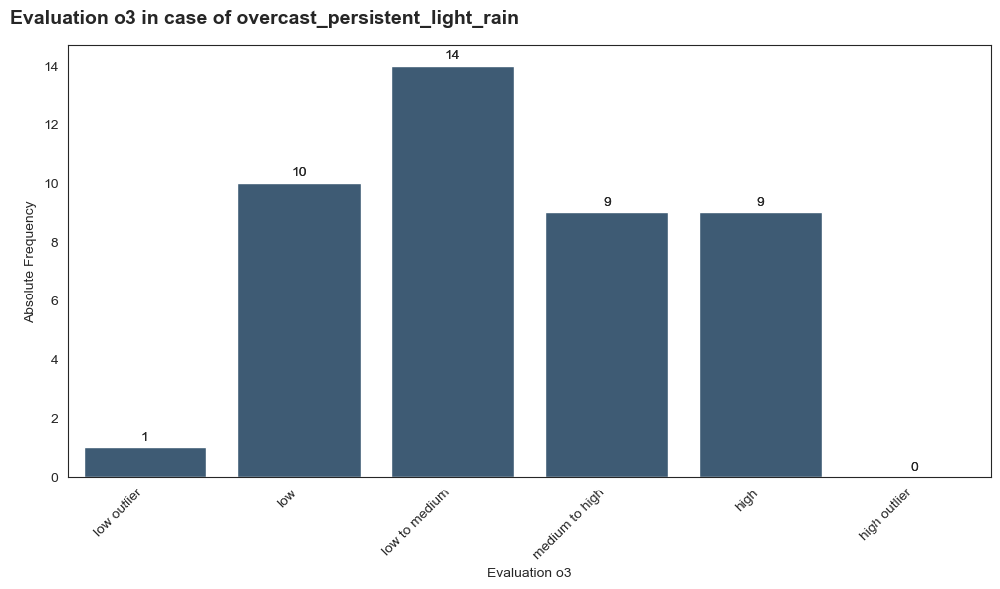

********************************************* dry_stable_calm *********************************************


,Evaluation o3,Absolute frequency,Relative frequency (%)
0,low outlier,1,1.47
1,low,23,33.82
2,low to medium,14,20.59
3,medium to high,13,19.12
4,high,17,25.00
5,high outlier,0,0.00


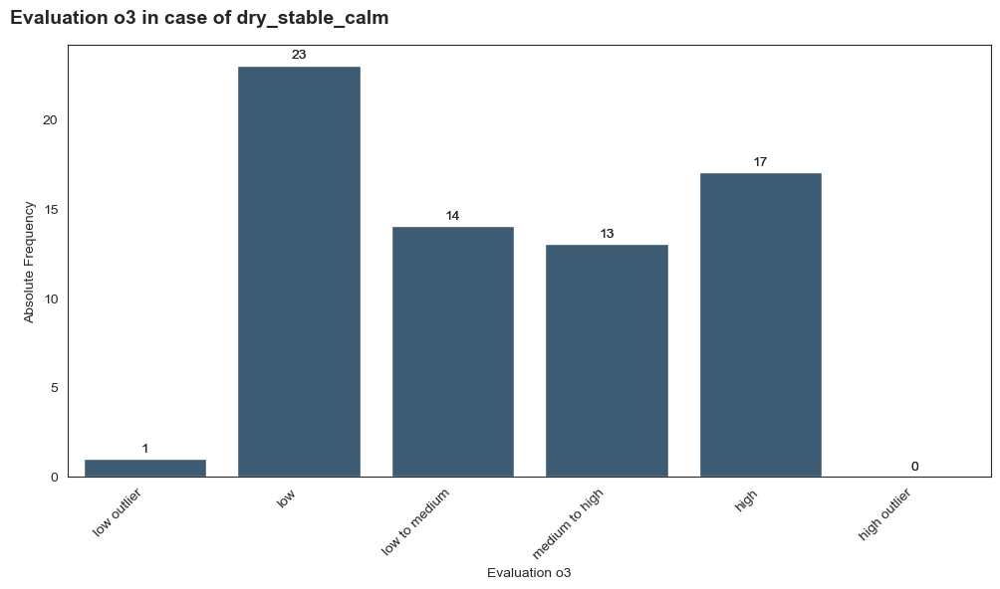

********************************************* variable_clearing *********************************************


,Evaluation o3,Absolute frequency,Relative frequency (%)
0,low outlier,2,4.08
1,low,12,24.49
2,low to medium,12,24.49
3,medium to high,10,20.41
4,high,13,26.53
5,high outlier,0,0.00


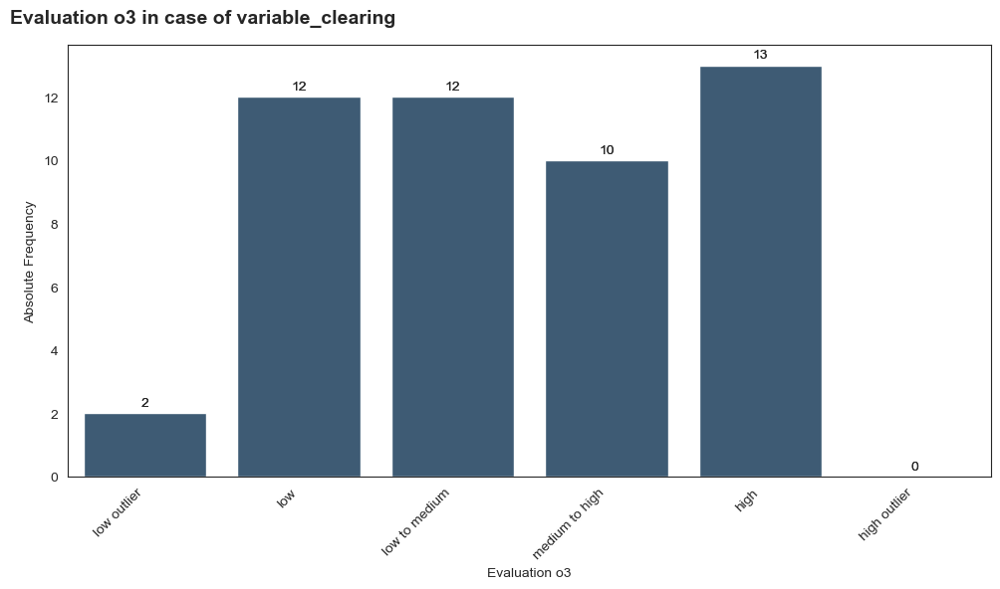

********************************************* mild_stable_partly_cloudy *********************************************


,Evaluation o3,Absolute frequency,Relative frequency (%)
0,low outlier,2,2.56
1,low,18,23.08
2,low to medium,19,24.36
3,medium to high,15,19.23
4,high,23,29.49
5,high outlier,1,1.28


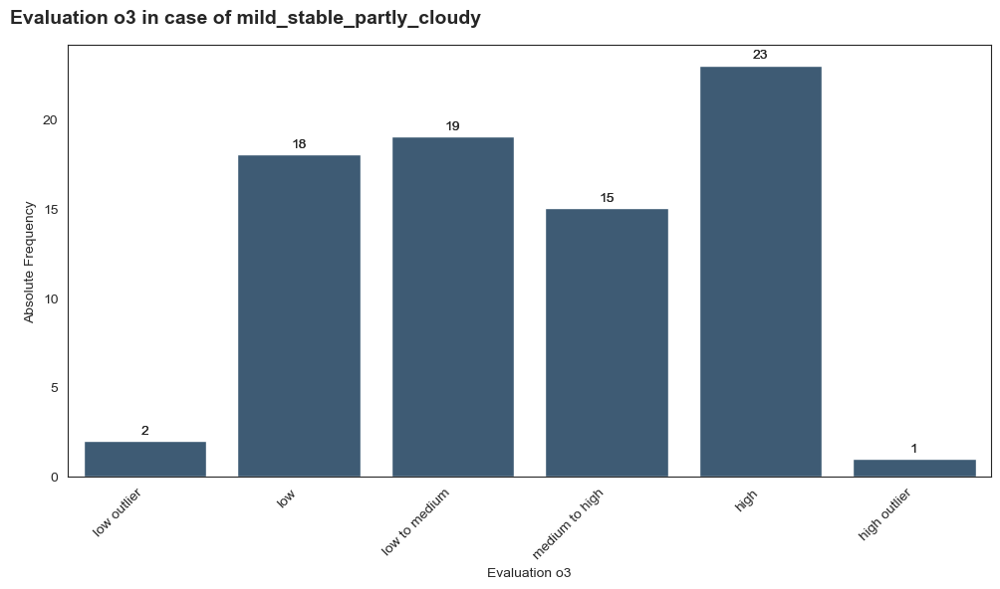

********************************************* mild_unstable_showers *********************************************


,Evaluation o3,Absolute frequency,Relative frequency (%)
0,low outlier,2,3.51
1,low,16,28.07
2,low to medium,13,22.81
3,medium to high,13,22.81
4,high,13,22.81
5,high outlier,0,0.00


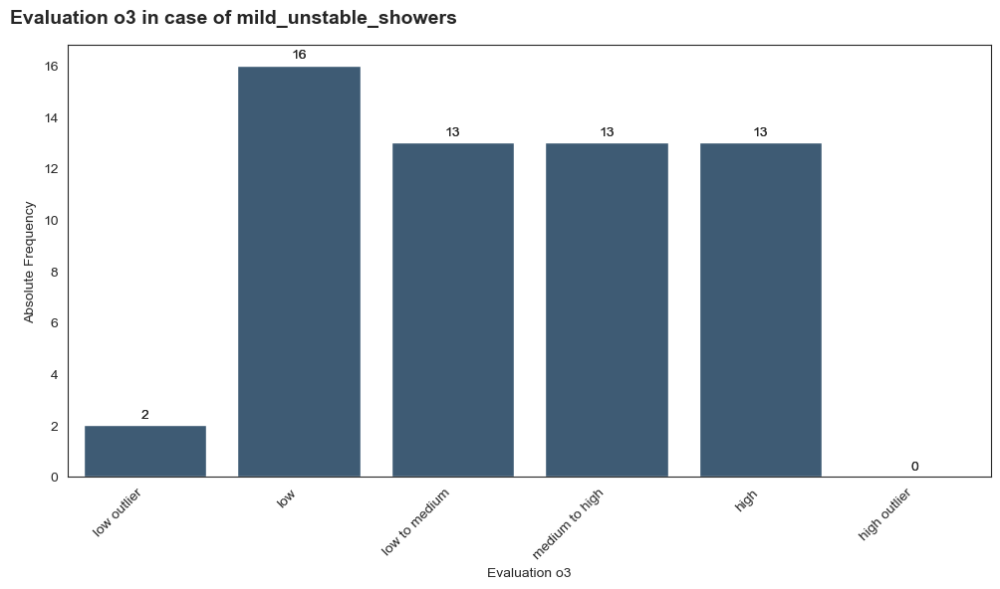

********************************************* windy_humid_worsening *********************************************


,Evaluation o3,Absolute frequency,Relative frequency (%)
0,low outlier,1,3.85
1,low,5,19.23
2,low to medium,4,15.38
3,medium to high,9,34.62
4,high,7,26.92
5,high outlier,0,0.00


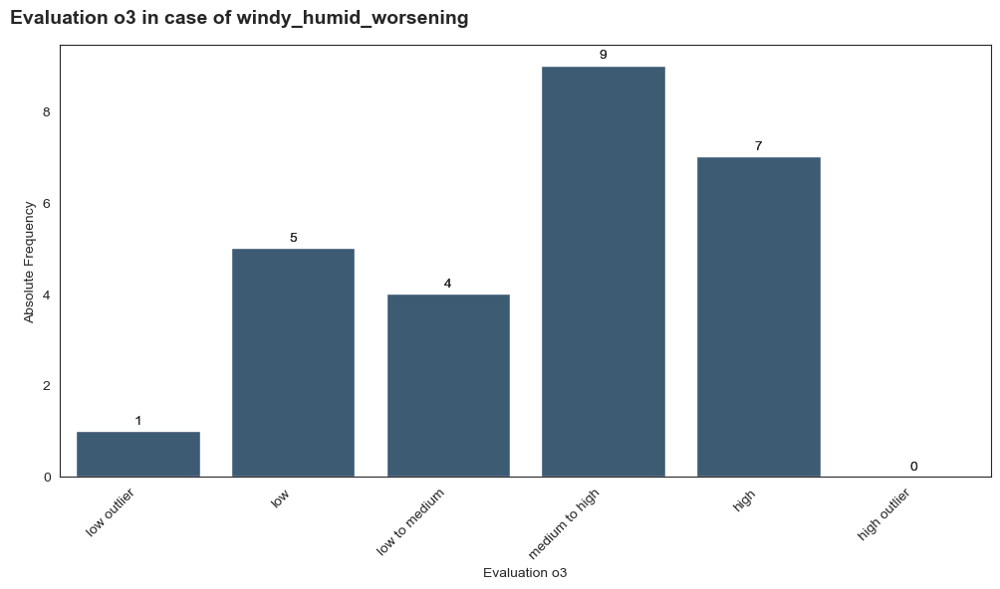

********************************************* strongly_perturbed_very_windy *********************************************


,Evaluation o3,Absolute frequency,Relative frequency (%)
0,low outlier,1,2.13
1,low,13,27.66
2,low to medium,14,29.79
3,medium to high,11,23.40
4,high,8,17.02
5,high outlier,0,0.00


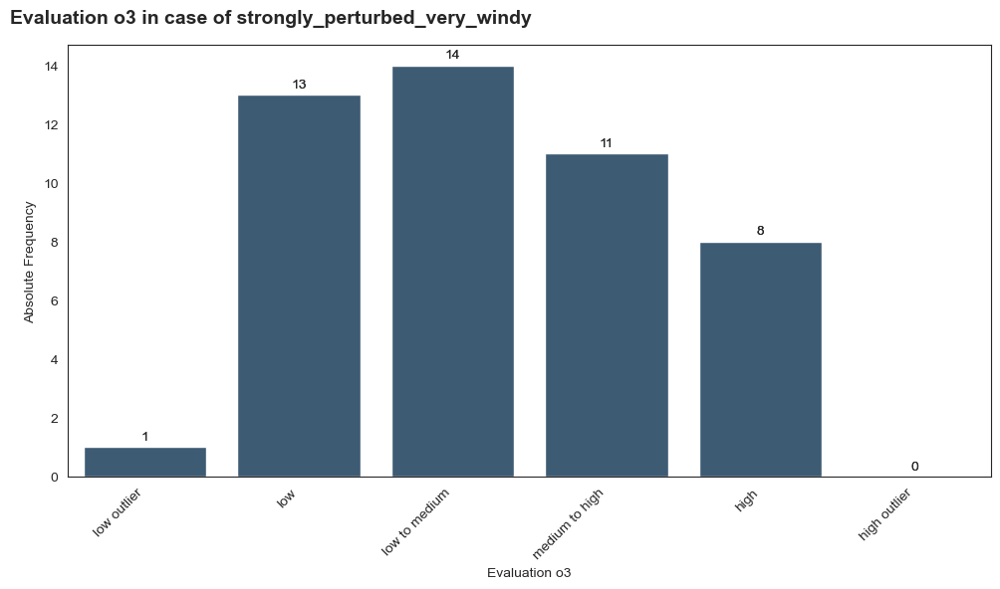

********************************************* continuous_stratiform_rain *********************************************


,Evaluation o3,Absolute frequency,Relative frequency (%)
0,low outlier,0,0.00
1,low,4,15.38
2,low to medium,7,26.92
3,medium to high,11,42.31
4,high,4,15.38
5,high outlier,0,0.00


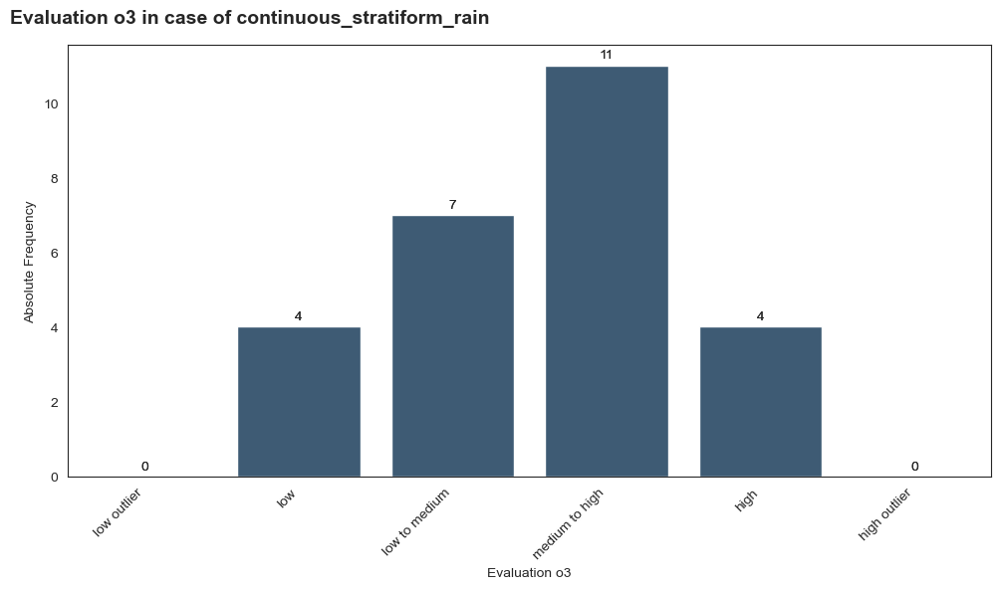

********************************************* slightly_unstable_variable *********************************************


,Evaluation o3,Absolute frequency,Relative frequency (%)
0,low outlier,1,2.04
1,low,10,20.41
2,low to medium,15,30.61
3,medium to high,12,24.49
4,high,11,22.45
5,high outlier,0,0.00


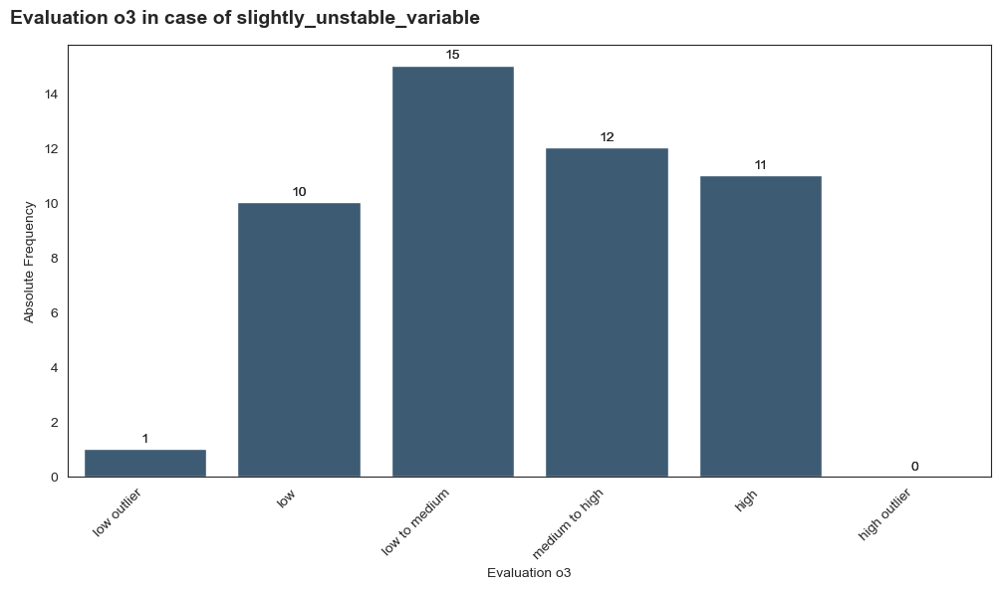

********************************************* hot_dry_stable *********************************************


,Evaluation o3,Absolute frequency,Relative frequency (%)
0,low outlier,2,2.02
1,low,17,17.17
2,low to medium,20,20.20
3,medium to high,27,27.27
4,high,31,31.31
5,high outlier,2,2.02


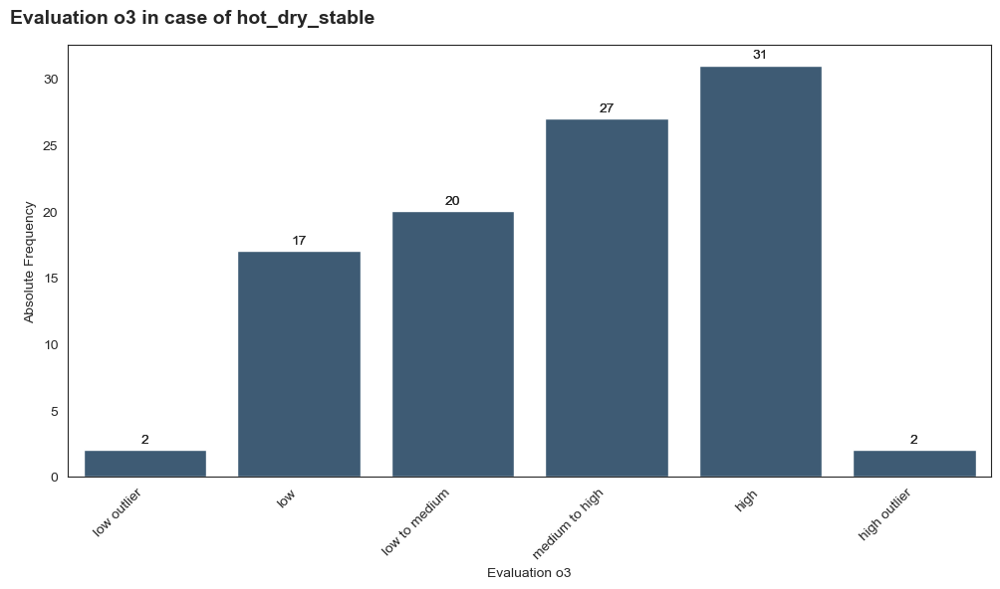

In [79]:
categories_by_groups(data_o3_full, 'Day Type', 'Evaluation o3', ['low outlier','low','low to medium','medium to high',
                                                                    'high','high outlier'])

The Kruskal-Wallis H-test for the different groups of the column Day Type and the column IQR is 2.6945105724840693e-11 so there is a significant deviation of the median of IQR in at least two groups.


,count,mean,std,min,25%,50%,75%,max
Day Type,,,,,,,,
continuous_stratiform_rain,26.0,22.555864,5.991347,14.851060,17.656238,20.671113,25.647799,35.839311
dry_stable_calm,68.0,17.879694,6.321505,4.102999,13.908227,17.068760,20.889543,35.177638
hot_dry_stable,99.0,18.070533,5.978034,7.465932,13.423902,17.525742,21.972675,34.165072
mild_stable_partly_cloudy,78.0,21.266085,6.390047,9.889905,17.188374,20.133361,24.960146,40.313554
mild_unstable_showers,57.0,18.551028,4.500845,7.661565,15.526864,18.815252,22.092757,28.895290
overcast_persistent_light_rain,43.0,21.294873,8.201406,6.693148,15.991525,21.572141,27.773165,37.374108
slightly_unstable_variable,49.0,20.910697,5.575580,8.504002,17.020622,20.216367,23.869888,37.053961
strongly_perturbed_very_windy,47.0,17.968325,5.200958,5.870300,14.979326,17.376509,21.209787,29.843699
variable_clearing,49.0,19.880455,6.064007,11.439654,15.387898,18.990987,22.786748,35.074867


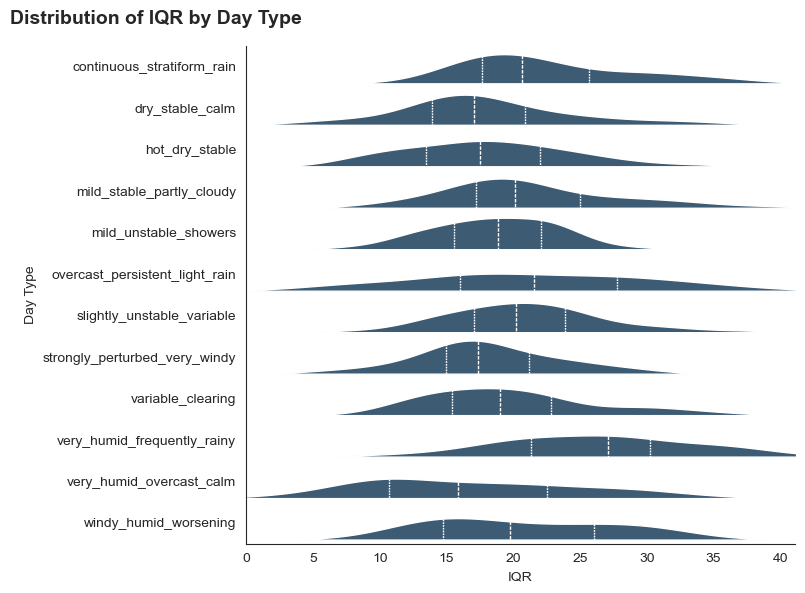

In [80]:
cat_num_rel(data_o3_full,'Day Type','IQR', lgscale = False)

#### 📊 O₃ Evaluation by Day Type

1️⃣ **Very Humid / Overcast / Rain-Dominated Regimes**
🔹 very_humid_overcast_calm

- Mostly low to medium and medium to high
- Some high, but almost no high outliers
- Very few low outliers

Interpretation:
Despite weak photochemistry, **calm conditions prevent strong dispersion**. O₃ does not collapse completely but **remains moderate**. The system is **chemically limited but dynamically stable**.

🔹 **very_humid_frequently_rainy**

- Mostly low and low to medium
- Few high events
- Almost no extremes

Interpretation:
**Frequent rain suppresses ozone formation and enhances removal processes**. This is a chemically damped regime with low volatility.

🔹 **overcast_persistent_light_rain**

- Dominated by low to medium
- Balanced moderate-high presence
- No high outliers

Interpretation:
**Persistent cloud cover limits irradiance**. Ozone remains moderate and structurally stable, rarely entering extreme states.

🔹 **continuous_stratiform_rain**

- Mainly medium to high
- Some low to medium
- No extremes

Interpretation:
**Stratiform rain does not eliminate ozone entirely**; background concentrations remain sustained. Suggests residual transport and persistence components.

2️⃣ **Stable Dry Regimes**
🔹 **dry_stable_calm**

- Significant low
- Noticeable high
- Balanced distribution

Interpretation:
Calm but dry conditions create dual behavior:
- Weak photochemistry in cooler seasons → low
- Strong accumulation under sun → high

This is a **regime-sensitive configuration.**

🔹 **hot_dry_stable**

- Dominated by high and medium to high
- Presence of high outliers
- Very few low states

Interpretation:
This is the **classic photochemical amplification regime.**
High temperature + low humidity + stability = strong ozone formation.

This regime aligns perfectly with the Q3 nonlinear amplification findings.

3️⃣ **Transitional / Clearing Regimes**
🔹 **variable_clearing**

- Fairly balanced across categories
- No strong extremes

Interpretation:
**Transition from cloudy to sunny conditions increases variability.** Ozone responds dynamically to rapidly changing irradiance.

🔹 **slightly_unstable_variable**

- Even distribution across low to high
- Moderate volatility

Interpretation:
**Instability introduces mixing, preventing sustained extremes but allowing variability.**

🔹 **mild_stable_partly_cloudy**

- High frequency of high
- Strong presence of moderate-high

Interpretation:
**Partial clouds still allow strong irradiance.** Stability supports photochemical accumulation.

🔹 **mild_unstable_showers**

- Balanced across categories
- No strong extreme dominance

Interpretation:
**Localized showers reduce sustained high ozone but do not fully suppress photochemistry.**

4️⃣ **Wind-Dominated Regimes**
🔹 **windy_humid_worsening**

- Mostly medium to high
- Some high

Interpretation:
**Wind enhances transport.** Ozone may increase due to regional advection rather than local production.

🔹 **strongly_perturbed_very_windy**

- Balanced distribution
- Moderate levels dominate

Interpretation:
**Strong mixing prevents accumulation**, reducing sustained high ozone but not eliminating moderate concentrations.

5️⃣ **IQR Distribution by Day Type (Uncertainty Analysis)**

The final violin plot shows how uncertainty (IQR) varies by regime.

🔵 *Highest IQR (More Volatile Regimes)*

- overcast_persistent_light_rain
- very_humid_frequently_rainy
- hot_dry_stable
- windy_humid_worsening

Interpretation:
Regimes with either:

- Strong photochemical amplification
- Rapid atmospheric transitions

produce larger predictive spread.

🟢 *Lower IQR (Stable Regimes)*

- dry_stable_calm
- continuous_stratiform_rain
- slightly_unstable_variable

These show tighter predictive bands.

Interpretation:
*Atmospheric behavior is more structurally predictable in these regimes.*

6️⃣ **Structural Synthesis**

The regime analysis confirms:

- Photochemical amplification under hot-dry stability
- Suppression under persistent rain
- Variability during transitional clearing
- Transport-driven elevation under windy humid regimes

Importantly:

**The uncertainty (IQR) expands exactly where atmospheric chemistry becomes nonlinear or transport-driven.**

🎯 **Key points**

This regime-based breakdown validates your quantile modeling approach:

- Ozone behavior is clearly regime-dependent.
- Upper-tail dynamics are strongly tied to hot, dry, stable conditions.
- Rain and instability reduce extremes.
- Wind introduces transport-driven variability.
- Uncertainty correctly increases in nonlinear regimes.

In [81]:
data_o3_full['True o3 CLASS'] = o3_classes

In [82]:
data_o3_full['Estimated o3 CLASS'] = data_o3_full.apply(lambda row: choose_quartile_ref(row['o3'],
                                                                                           row['Quartile1'],
                                                                                           row['Median'],
                                                                                           row['Quartile3']),
                                                           axis = 1).apply(lambda p: classify_level(p,
                                                                                                    EU_AQI_THRESHOLDS['o3']))

In [83]:
cm_o3 = confusion_matrix(data_o3_full['True o3 CLASS'], data_o3_full['Estimated o3 CLASS'], labels=EU_AQI_ORDER[:-2],
                        normalize = 'true')

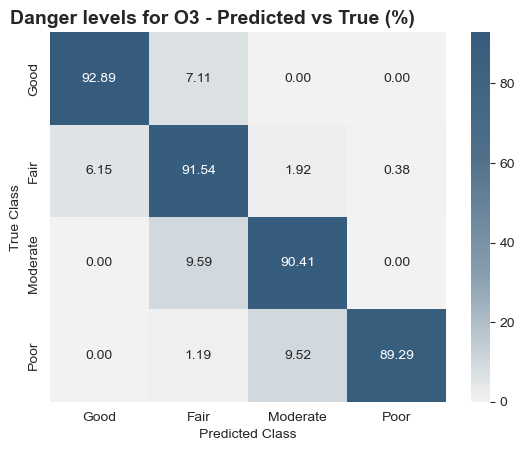

In [84]:
sns.heatmap(cm_o3*100, annot=True, fmt='.2f', cmap = hcmap_mono, xticklabels=EU_AQI_ORDER[:-2], yticklabels=EU_AQI_ORDER[:-2])
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.title("Danger levels for O3 - Predicted vs True (%)", loc="left",
    fontsize=14,
    fontweight="bold",
    x=-0.1
        )
plt.show()

In [85]:
print(classification_report(data_o3_full['True o3 CLASS'], data_o3_full['Estimated o3 CLASS'], labels=EU_AQI_ORDER[:-2]))

              precision    recall  f1-score   support

        Good       0.94      0.93      0.93       253
        Fair       0.90      0.92      0.91       260
    Moderate       0.84      0.90      0.87        73
        Poor       0.94      0.89      0.91        84

   micro avg       0.91      0.92      0.91       670
   macro avg       0.90      0.91      0.91       670
weighted avg       0.91      0.92      0.91       670



#### 📊 **O₃ Danger Levels - Predicted vs True (%)**

This confusion matrix shows the percentage of predictions for each true class (row-wise normalization). Overall, the structure is very strong and diagonally dominant.

1️⃣ **Overall Performance Structure**

Diagonal accuracy:

- Good → 92.89% correctly predicted
- Fair → 91.54% correctly predicted
- Moderate → 90.41% correctly predicted
- Poor → 89.29% correctly predicted

This indicates:

- Very high classification stability across all danger levels
- No catastrophic confusion between distant categories
- Balanced performance across severity spectrum

All classes exceed ~89% accuracy: this is excellent for an environmental multi-class system.

2️⃣ **Error Structure (Where Confusion Happens)**
🔹 Good class

- 7.11% misclassified as Fair
- 0% misclassified as Moderate or Poor

Interpretation:
Misclassifications occur only to the immediately adjacent class.
The model never jumps from Good to Moderate or Poor.

🔹 **Fair class**

- 6.15% → Good
- 1.92% → Moderate
- 0.38% → Poor

Interpretation:
Slight bidirectional spillover with Good and Moderate.
Very small leakage into Poor — strong boundary control.

🔹 **Moderate class**

- 9.59% → Fair
- 0% → Good
- 0% → Poor

Interpretation:
Moderate is mainly confused with Fair, not with extremes.
No collapse into Good or Poor.

🔹 **Poor class**

- 9.52% → Moderate
- 1.19% → Fair
- 0% → Good

Interpretation:
High ozone is sometimes softened into Moderate, but never into Good.
This is risk-conservative behavior.

3️⃣ **Structural Interpretation**

The misclassification pattern is strictly ordinal:

- Good ↔ Fair ↔ Moderate ↔ Poor
- No long-distance errors occur.

This means the model:

- Respects severity ordering
- Preserves monotonic structure
- Does not underestimate severe events dramatically
- Avoids overreaction from low to high risk

This is exactly what you want in air-quality danger classification.

4️⃣ **Comparison with PM2.5 Classification**

Relative to PM2.5:

- O₃ classification appears slightly more structurally clean
- No extreme cross-class errors
- Stronger diagonal dominance
- Clearer ordinal error pattern

This likely reflects:

- Strong seasonal backbone of ozone
- Clear photochemical regimes
- Lower noise compared to PM2.5 (which is often multi-source and chaotic)

5️⃣ **Risk-Oriented Interpretation**

The most critical aspect in environmental risk modeling is avoiding:

- Severe underestimation
- Severe overestimation

The model avoids both, which is extremely important for public health applications.

The system is conservative but stable.

#### 📌 **Conclusions on the O₃ Modeling Framework**

Overall, the O₃ models demonstrate strong structural coherence and environmental consistency. The temporal predictions accurately follow seasonal photochemical dynamics, with IQR effectively capturing variability across different atmospheric regimes. Feature importance and interaction analyses align with physical expectations, highlighting the role of **temperature, solar radiation, humidity, and persistence effects**.

The danger-level classification is robust and ordinally consistent, with high accuracy across all classes and misclassifications occurring mainly between adjacent categories. Importantly, **no extreme severity jumps are observed, confirming that the system preserves risk hierarchy.**

In conclusion, the **O₃ modeling framework is statistically solid, physically interpretable, and operationally reliable for air-quality monitoring and risk assessment.**

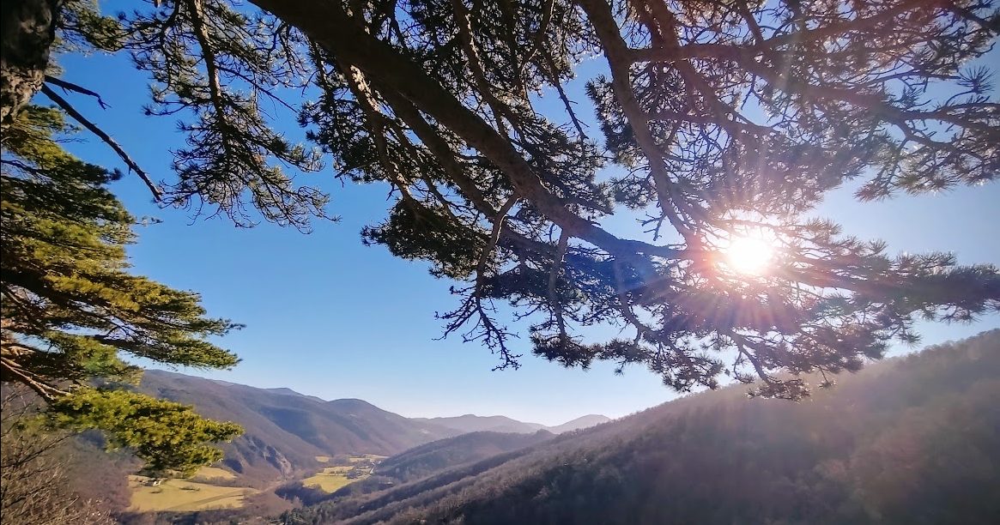

## **Conclusions**

The modeling framework applied to PM2.5 and O₃ demonstrates strong predictive capability and interpretability across different analytical layers.

For **PM2.5**, the models effectively **capture medium-term variability and maintain stable classification accuracy across danger levels**. Misclassifications are largely confined to neighboring categories, indicating that **prediction errors remain within a limited risk margin**. Quantile-based modeling enhances the system’s ability to describe dispersion and detect anomalous behavior.

For **O₃**, the results highlight a **clear dependence on atmospheric stability and seasonal patterns**. **Hot and stable conditions significantly increase both concentration levels and variability, while precipitation and atmospheric instability mitigate peak values**. The predictive system successfully reflects these dynamics, maintaining **high classification performance across risk levels**.

The integration of **quantile regression, interquartile range analysis, and multi-class classification** proves to be a coherent and effective methodological approach. It allows **not only accurate forecasting but also structured risk interpretation and scenario-based environmental assessment**.

From an operational perspective, the framework is suitable for supporting **early warning systems, seasonal risk monitoring, and policy-oriented air quality management decisions.**